In [ ]:
!pip install --upgrade sympy==1.12
!pip install torch==2.0.1 transformers==4.30.2 sentence-transformers==2.2.2

ERROR: Could not find a version that satisfies the requirement torch==2.0.1 (from versions: 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1, 2.6.0, 2.7.0, 2.7.1, 2.8.0, 2.9.0, 2.9.1, 2.10.0)
ERROR: No matching distribution found for torch==2.0.1


In [ ]:
# ============================================================
# 1. ИМПОРТЫ И ГЛОБАЛЬНЫЕ НАСТРОЙКИ
# ============================================================

# ------------------------------------------------------------
# Стандартные библиотеки
# ------------------------------------------------------------
import os
import re
import json
import time
import warnings
from collections import Counter

# ------------------------------------------------------------
# Научные вычисления и работа с данными
# ------------------------------------------------------------
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# Визуализация
# ------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# ------------------------------------------------------------
# Scikit-learn: предобработка, модели, метрики
# ------------------------------------------------------------
from sklearn.model_selection import (
    train_test_split, GridSearchCV, RandomizedSearchCV,
    learning_curve, validation_curve, cross_val_score
)
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import label_binarize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
)
from sklearn.utils.class_weight import compute_class_weight

# ------------------------------------------------------------
# Scipy: статистические распределения
# ------------------------------------------------------------
from scipy.stats import randint

# ------------------------------------------------------------
# NLTK (токенизация / стоп-слова)
# ------------------------------------------------------------
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords

# ------------------------------------------------------------
# Глубокое обучение / эмбеддинги
# ------------------------------------------------------------
import torch
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer

# ------------------------------------------------------------
# Прогресс-бары
# ------------------------------------------------------------
from tqdm import tqdm

# ------------------------------------------------------------
# Сохранение моделей
# ------------------------------------------------------------
import joblib

# ============================================================
# ПОДКЛЮЧЕНИЕ GOOGLE DRIVE (для Colab)
# ============================================================
try:
    if 'google.colab' in str(get_ipython()):
        from google.colab import drive
        drive.mount('/content/drive')
        print("✅ Google Drive подключён")
    else:
        print("✅ Не-Colab окружение, пропускаем монтирование")
except NameError:
    print("✅ Не-Colab окружение, пропускаем монтирование")

# ============================================================
# ГЛОБАЛЬНЫЕ НАСТРОЙКИ
# ============================================================
warnings.filterwarnings('ignore')
np.random.seed(42)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 100)

# Стиль графиков
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 100
plt.rcParams['figure.figsize'] = (10, 6)

print("✅ Все библиотеки загружены, окружение настроено")

Mounted at /content/drive
✅ Google Drive подключён
✅ Все библиотеки загружены, окружение настроено


In [ ]:
# ============================================================
# 2. УНИВЕРСАЛЬНЫЕ ФУНКЦИИ ДЛЯ ВИЗУАЛИЗАЦИИ И АНАЛИЗА
# ============================================================

# ------------------------------------------------------------
# 2.1. БАЗОВЫЙ EDA (разведочный анализ)
# ------------------------------------------------------------
def plot_class_distribution(y_train, y_test, title='Распределение классов'):
    """
    Строит bar charts распределения классов в train и test.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Train
    train_counts = pd.Series(y_train).value_counts().sort_index()
    axes[0].bar(train_counts.index.astype(str), train_counts.values,
                color='skyblue', edgecolor='black')
    axes[0].set_title(f'{title} (train)', fontsize=12)
    axes[0].set_xlabel('Класс')
    axes[0].set_ylabel('Количество')
    for i, v in enumerate(train_counts.values):
        axes[0].text(i, v + max(train_counts.values)*0.01, str(v), ha='center')

    # Test
    test_counts = pd.Series(y_test).value_counts().sort_index()
    axes[1].bar(test_counts.index.astype(str), test_counts.values,
                color='lightgreen', edgecolor='black')
    axes[1].set_title(f'{title} (test)', fontsize=12)
    axes[1].set_xlabel('Класс')
    axes[1].set_ylabel('Количество')
    for i, v in enumerate(test_counts.values):
        axes[1].text(i, v + max(test_counts.values)*0.01, str(v), ha='center')

    plt.tight_layout()
    plt.show()

def plot_text_length_distribution(X_train, X_test, bins=50):
    """
    Гистограммы распределения длины текстов (в словах) для train и test.
    """
    train_lengths = [len(str(text).split()) for text in X_train]
    test_lengths = [len(str(text).split()) for text in X_test]

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].hist(train_lengths, bins=bins, alpha=0.7, color='skyblue', edgecolor='black')
    axes[0].axvline(np.mean(train_lengths), color='red', linestyle='--',
                    label=f'Среднее: {np.mean(train_lengths):.1f}')
    axes[0].set_title('Распределение длины текстов (train)', fontsize=12)
    axes[0].set_xlabel('Количество слов')
    axes[0].set_ylabel('Частота')
    axes[0].legend()

    axes[1].hist(test_lengths, bins=bins, alpha=0.7, color='lightgreen', edgecolor='black')
    axes[1].axvline(np.mean(test_lengths), color='red', linestyle='--',
                    label=f'Среднее: {np.mean(test_lengths):.1f}')
    axes[1].set_title('Распределение длины текстов (test)', fontsize=12)
    axes[1].set_xlabel('Количество слов')
    axes[1].set_ylabel('Частота')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    print(f"\nСтатистика по текстам:")
    print(f"Train: {len(X_train)} текстов, средняя длина: {np.mean(train_lengths):.1f} слов")
    print(f"Test:  {len(X_test)} текстов, средняя длина: {np.mean(test_lengths):.1f} слов")

# ------------------------------------------------------------
# 2.2. АНАЛИЗ РЕЗУЛЬТАТОВ GRIDSEARCH
# ------------------------------------------------------------
def plot_gridsearch_heatmap(gs, param_x, param_y, metric='mean_test_score',
                            title='Тепловая карта GridSearch'):
    """
    Строит тепловую карту для двух гиперпараметров на основе cv_results_.
    """
    results_df = pd.DataFrame(gs.cv_results_)
    pivot = results_df.pivot_table(index=param_y, columns=param_x, values=metric)
    plt.figure(figsize=(8, 6))
    sns.heatmap(pivot, annot=True, fmt='.3f', cmap='viridis',
                cbar_kws={'label': metric})
    plt.title(title)
    plt.tight_layout()
    plt.show()

def plot_gridsearch_boxplot(gs, top_n=5, metric='test_score', title='Распределение CV scores',
                            return_stats=False):
    """
    Строит boxplot для топ-N комбинаций параметров.
    Если return_stats=True, возвращает DataFrame со статистиками.
    """
    results_df = pd.DataFrame(gs.cv_results_)
    results_df = results_df.sort_values('mean_test_score', ascending=False)
    top_idx = results_df.head(top_n).index
    scores_per_param = []
    labels = []

    for idx in top_idx:
        params = results_df.loc[idx, 'params']
        fold_scores = [gs.cv_results_[f'split{fold}_{metric}'][idx] for fold in range(gs.cv)]
        scores_per_param.append(fold_scores)
        # Краткая подпись: только ключевые параметры
        short_params = {k: v for k, v in params.items() if 'tfidf' in k or 'clf' in k}
        label = ', '.join([f"{k.split('__')[-1]}={v}" for k, v in short_params.items()])
        labels.append(label)

    # Boxplot
    plt.figure(figsize=(10, 6))
    bp = plt.boxplot(scores_per_param, labels=labels, patch_artist=True)
    colors = sns.color_palette('Set2', top_n)
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    plt.ylabel(f'CV {metric}')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Возвращаем статистики (по желанию)
    if return_stats:
        stats_list = []
        for i, scores in enumerate(scores_per_param):
            s = pd.Series(scores).describe(percentiles=[0.25, 0.5, 0.75])
            stats_list.append({
                'Комбинация': labels[i],
                'Min': s['min'],
                'Q1': s['25%'],
                'Median': s['50%'],
                'Q3': s['75%'],
                'Max': s['max'],
                'Mean': s['mean'],
                'Std': s['std']
            })
        stats_df = pd.DataFrame(stats_list)
        return stats_df

def plot_gridsearch_top_params_bar(gs, top_n=10, metric='mean_test_score',
                                   std_metric='std_test_score', title='Топ комбинаций параметров'):
    """
    Строит горизонтальный bar chart со средним значением и планками погрешностей (std).
    """
    results_df = pd.DataFrame(gs.cv_results_)
    results_df = results_df.sort_values(metric, ascending=False).head(top_n)

    # Формируем подписи
    params_str = []
    for params in results_df['params']:
        s = ', '.join([f"{k}={v}" for k, v in params.items()])
        params_str.append(s[:60])  # обрезаем длинные строки

    y_pos = np.arange(len(params_str))
    mean_scores = results_df[metric].values
    std_scores = results_df[std_metric].values

    plt.figure(figsize=(10, 6))
    plt.barh(y_pos, mean_scores, xerr=std_scores, capsize=3,
             color='steelblue', edgecolor='black')
    plt.yticks(y_pos, params_str, fontsize=9)
    plt.xlabel(metric)
    plt.title(f'{title} (топ-{top_n})')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

def plot_gridsearch_parameter_impact(gs, param_x, param_hue=None, metric='mean_test_score',
                                     show_std=False, title='Влияние параметров'):
    """
    Линейный график: влияние одного параметра, с группировкой по второму (опционально).
    Автоматически преобразует нехешируемые значения (списки) в строки.
    """
    results_df = pd.DataFrame(gs.cv_results_)
    plt.figure(figsize=(10, 6))

    if param_hue is not None:
        df = results_df.copy()
        # Преобразуем столбец hue в строковый тип для безопасной группировки
        df['_hue_str'] = df[param_hue].apply(
            lambda x: str(x) if isinstance(x, (list, dict, np.ndarray)) else x
        )
        param_hue_used = '_hue_str'
    else:
        df = results_df
        param_hue_used = None

    if param_hue_used is None:
        # одиночный параметр
        grouped = df.groupby(param_x)[metric].mean().reset_index()
        if show_std:
            std_vals = df.groupby(param_x)['std_test_score'].mean().reset_index()
            plt.errorbar(grouped[param_x], grouped[metric],
                         yerr=std_vals['std_test_score'],
                         marker='o', capsize=3)
        else:
            plt.plot(grouped[param_x], grouped[metric], marker='o')
    else:
        for val in df[param_hue_used].unique():
            subset = df[df[param_hue_used] == val].sort_values(param_x)
            label = str(val)
            if len(label) > 50:
                label = label[:50] + '…'
            if show_std:
                plt.errorbar(subset[param_x], subset[metric],
                             yerr=subset['std_test_score'], marker='o',
                             capsize=3, label=label)
            else:
                plt.plot(subset[param_x], subset[metric], marker='o', label=label)
        plt.legend()

    plt.xlabel(param_x)
    plt.ylabel(metric)
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_train_vs_validation_scatter(gs, title='Сравнение train и validation scores'):
    """
    Строит scatter plot: mean_train_score vs mean_test_score.
    Если train_score отсутствует (return_train_score=False), выводит предупреждение.
    """
    if not hasattr(gs, 'cv_results_'):
        print("⚠️ Объект GridSearchCV не содержит cv_results_.")
        return

    results_df = pd.DataFrame(gs.cv_results_)

    # Проверяем наличие необходимых столбцов
    has_train = 'mean_train_score' in results_df.columns
    has_test = 'mean_test_score' in results_df.columns

    if not has_test:
        print("⚠️ В cv_results_ отсутствует 'mean_test_score'. Невозможно построить график.")
        return

    if not has_train:
        print("ℹ️ 'mean_train_score' отсутствует (return_train_score=False). Пропускаем scatter plot.")
        return

    # Если оба столбца есть — строим график
    plt.figure(figsize=(8, 6))
    plt.scatter(results_df['mean_train_score'], results_df['mean_test_score'],
                alpha=0.6, s=30, c='blue', edgecolors='w', linewidth=0.5)
    plt.plot([0, 1], [0, 1], 'r--', alpha=0.7, label='Идеальная линия')
    plt.xlabel('Train score')
    plt.ylabel('Validation score')
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_performance_vs_time(gs, metric='mean_test_score', time_metric='mean_fit_time',
                             title='Производительность vs Время обучения'):
    """
    Строит scatter plot: метрика качества vs время обучения.
    Устойчивая версия с проверками и обработкой ошибок.
    """
    # Проверяем наличие необходимых метрик в cv_results_
    if not hasattr(gs, 'cv_results_'):
        print("⚠️ Объект GridSearchCV не содержит cv_results_.")
        return

    if time_metric not in gs.cv_results_:
        print(f"⚠️ Метрика '{time_metric}' отсутствует в cv_results_.")
        print("   Доступные метрики времени:", [k for k in gs.cv_results_.keys() if 'time' in k])
        return

    if metric not in gs.cv_results_:
        print(f"⚠️ Метрика '{metric}' отсутствует в cv_results_.")
        return

    results_df = pd.DataFrame(gs.cv_results_)

    # Извлекаем данные и удаляем NaN/Inf
    time_data = results_df[time_metric].copy()
    score_data = results_df[metric].copy()

    mask = np.isfinite(time_data) & np.isfinite(score_data)
    time_data = time_data[mask]
    score_data = score_data[mask]

    if len(time_data) == 0:
        print("⚠️ Нет валидных данных для построения графика.")
        return

    # Построение графика
    plt.figure(figsize=(8, 6))
    plt.scatter(time_data, score_data, alpha=0.6, s=30,
                c='green', edgecolors='black', linewidth=0.5)
    plt.xlabel('Время обучения (сек)')
    plt.ylabel(metric)
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 2.3. ОЦЕНКА КАЧЕСТВА КЛАССИФИКАЦИИ
# ------------------------------------------------------------
def plot_confusion_matrices(y_true, y_pred, classes, title=''):
    """
    Строит обычную и нормализованную (по строкам) матрицы ошибок.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Абсолютная матрица
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes, ax=ax1)
    ax1.set_title(f'{title} Confusion Matrix (absolute)')
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('True')

    # Нормализованная (по строкам)
    cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=classes, yticklabels=classes, ax=ax2)
    ax2.set_title(f'{title} Confusion Matrix (normalized)')
    ax2.set_xlabel('Predicted')
    ax2.set_ylabel('True')

    plt.tight_layout()
    plt.show()

def plot_classification_metrics_report(y_true, y_pred, classes, title=''):
    """
    Строит bar chart метрик precision, recall, f1-score для каждого класса.
    """
    report = classification_report(y_true, y_pred, output_dict=True)
    df_report = pd.DataFrame(report).transpose()

    # Отбираем только классы (не macro avg, weighted avg, accuracy)
    class_names = [c for c in df_report.index if c in [str(cls) for cls in classes]]
    metrics = ['precision', 'recall', 'f1-score']
    df_plot = df_report.loc[class_names, metrics]

    plt.figure(figsize=(12, 6))
    df_plot.plot(kind='bar', ax=plt.gca())
    plt.title(f'{title} Метрики по классам', fontsize=14)
    plt.ylabel('Score')
    plt.ylim(0, 1)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_roc_curve_multiclass(y_true, y_pred_proba, classes, title=''):
    """
    Строит ROC-кривые для многоклассовой классификации (One-vs-Rest).
    Если classes всего 2, строит одну ROC-кривую.
    """
    if len(classes) == 2:
        fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])
        roc_auc = auc(fpr, tpr)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'{title} ROC-кривая')
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()
        print(f"AUC: {roc_auc:.4f}")
    else:
        # Бинаризуем метки
        y_true_bin = label_binarize(y_true, classes=classes)
        plt.figure(figsize=(10, 8))
        for i, class_name in enumerate(classes):
            fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, lw=2, label=f'{class_name} (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'{title} ROC-кривые (One-vs-Rest)')
        plt.legend(loc="lower right")
        plt.grid(True, alpha=0.3)
        plt.show()

def plot_true_vs_pred_distribution(y_true, y_pred, title='Распределение классов: истинное vs предсказанное'):
    """
    Строит side-by-side bar chart для сравнения частот истинных и предсказанных классов.
    """
    from collections import Counter
    true_counts = Counter(y_true)
    pred_counts = Counter(y_pred)
    all_labels = sorted(set(y_true) | set(y_pred))
    true_vals = [true_counts.get(l, 0) for l in all_labels]
    pred_vals = [pred_counts.get(l, 0) for l in all_labels]

    x = np.arange(len(all_labels))
    width = 0.35
    plt.figure(figsize=(10, 6))
    plt.bar(x - width/2, true_vals, width, label='Истинное', alpha=0.8, color='steelblue')
    plt.bar(x + width/2, pred_vals, width, label='Предсказанное', alpha=0.8, color='coral')
    plt.xlabel('Классы')
    plt.ylabel('Количество')
    plt.title(title)
    plt.xticks(x, all_labels)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

def plot_feature_importance(model, feature_names, classes=None, top_n=10, title=''):
    """
    Для линейных моделей (LogisticRegression, линейный SVM) — коэффициенты.
    Для RandomForest / GradientBoosting — feature_importances_.
    """
    # Определяем тип модели и достаём веса
    if hasattr(model, 'coef_'):
        # Линейная модель
        coef = model.coef_
        if len(coef.shape) == 1 or coef.shape[0] == 1:
            # Бинарная
            if len(coef.shape) == 1:
                coef = coef.reshape(1, -1)
            # Для бинарной показываем положительные и отрицательные отдельно
            if classes is None or len(classes) == 2:
                _plot_feature_importance_binary(coef.flatten(), feature_names, top_n, title)
            else:
                # Мультикласс: показываем топ-N для каждого класса
                _plot_feature_importance_multiclass(coef, feature_names, classes, top_n, title)
        else:
            # Мультикласс
            _plot_feature_importance_multiclass(coef, feature_names, classes, top_n, title)
    elif hasattr(model, 'feature_importances_'):
        # Древесные модели
        importance = model.feature_importances_
        _plot_feature_importance_tree(importance, feature_names, top_n, title)
    else:
        print("Модель не имеет coef_ или feature_importances_ — визуализация невозможна.")

def _plot_feature_importance_binary(coef, feature_names, top_n=10, title=''):
    """Внутренняя: бинарная классификация, положительные/отрицательные."""
    feat_imp = pd.DataFrame({'feature': feature_names, 'coef': coef})
    feat_imp['abs'] = np.abs(coef)
    feat_imp = feat_imp.sort_values('abs', ascending=False)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Положительные
    top_pos = feat_imp.sort_values('coef', ascending=False).head(top_n)
    axes[0].barh(range(len(top_pos)), top_pos['coef'].values, color='green')
    axes[0].set_yticks(range(len(top_pos)))
    axes[0].set_yticklabels(top_pos['feature'].values, fontsize=9)
    axes[0].set_xlabel('Коэффициент')
    axes[0].set_title(f'{title} Топ-{top_n} положительных признаков')
    axes[0].invert_yaxis()
    axes[0].axvline(0, color='black', linestyle='-', linewidth=0.5)

    # Отрицательные
    top_neg = feat_imp.sort_values('coef', ascending=True).head(top_n)
    axes[1].barh(range(len(top_neg)), top_neg['coef'].values, color='red')
    axes[1].set_yticks(range(len(top_neg)))
    axes[1].set_yticklabels(top_neg['feature'].values, fontsize=9)
    axes[1].set_xlabel('Коэффициент')
    axes[1].set_title(f'{title} Топ-{top_n} отрицательных признаков')
    axes[1].invert_yaxis()
    axes[1].axvline(0, color='black', linestyle='-', linewidth=0.5)

    plt.tight_layout()
    plt.show()

def _plot_feature_importance_multiclass(coef, feature_names, classes, top_n=10, title=''):
    """Внутренняя: мультикласс, топ признаков для каждого класса."""
    # Преобразуем разреженную матрицу в плотную, если необходимо
    if hasattr(coef, 'toarray'):
        coef = coef.toarray()

    n_classes = len(classes)
    fig, axes = plt.subplots(n_classes, 1, figsize=(12, 4*n_classes))
    if n_classes == 1:
        axes = [axes]

    for i, cls in enumerate(classes):
        # Извлекаем коэффициенты для i-го класса (уже плотный массив)
        coef_i = coef[i] if len(coef.shape) > 1 else coef
        # Дополнительная проверка на разреженность (если всё же проскочила)
        if hasattr(coef_i, 'toarray'):
            coef_i = coef_i.toarray().flatten()

        feat_imp = pd.DataFrame({'feature': feature_names, 'coef': coef_i})
        feat_imp['abs'] = np.abs(coef_i)
        feat_imp = feat_imp.sort_values('abs', ascending=False).head(top_n)

        axes[i].barh(range(len(feat_imp)), feat_imp['coef'].values, color='steelblue')
        axes[i].set_yticks(range(len(feat_imp)))
        axes[i].set_yticklabels(feat_imp['feature'].values, fontsize=9)
        axes[i].set_xlabel('Коэффициент')
        axes[i].set_title(f'{title} Класс {cls} — топ-{top_n} признаков')
        axes[i].invert_yaxis()
        axes[i].axvline(0, color='black', linestyle='-', linewidth=0.5)

    plt.tight_layout()
    plt.show()

def _plot_feature_importance_tree(importance, feature_names, top_n=10, title=''):
    """Внутренняя: RandomForest / XGBoost."""
    feat_imp = pd.DataFrame({'feature': feature_names, 'importance': importance})
    feat_imp = feat_imp.sort_values('importance', ascending=False).head(top_n)

    plt.figure(figsize=(10, 6))
    plt.barh(range(len(feat_imp)), feat_imp['importance'].values, color='purple')
    plt.yticks(range(len(feat_imp)), feat_imp['feature'].values, fontsize=9)
    plt.xlabel('Важность')
    plt.title(f'{title} Топ-{top_n} важных признаков (feature importance)')
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

def plot_class_weights(class_weights_dict, title='Веса классов'):
    """
    Визуализация весов классов (например, из compute_class_weight).
    """
    classes = list(class_weights_dict.keys())
    weights = list(class_weights_dict.values())
    plt.figure(figsize=(8, 5))
    plt.bar(classes.astype(str), weights, color='teal', edgecolor='black')
    plt.xlabel('Класс')
    plt.ylabel('Вес')
    plt.title(title)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 2.5. АНАЛИЗ ОБУЧЕНИЯ (КРИВЫЕ)
# ------------------------------------------------------------
def plot_learning_curve(estimator, X, y, cv=3, scoring='f1_macro',
                        train_sizes=np.linspace(0.1, 1.0, 10),
                        title='Кривая обучения'):
    """
    Строит кривую обучения: зависимость качества от размера выборки.
    """
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, scoring=scoring, n_jobs=-1,
        train_sizes=train_sizes, random_state=42
    )

    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std,
                     alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std,
                     alpha=0.1, color="g")
    plt.plot(train_sizes, train_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_mean, 'o-', color="g", label="Cross-validation score")
    plt.xlabel("Размер тренировочной выборки")
    plt.ylabel(scoring)
    plt.title(title, fontsize=14)
    plt.legend(loc="best")
    plt.grid(True, alpha=0.3)
    plt.show()

    print(f"Train score (конец): {train_mean[-1]:.4f}")
    print(f"Validation score (конец): {test_mean[-1]:.4f}")
    print(f"Разница: {train_mean[-1] - test_mean[-1]:.4f}")
    if train_mean[-1] - test_mean[-1] > 0.1:
        print("⚠️  Признаки переобучения!")
    elif train_mean[-1] - test_mean[-1] > 0.05:
        print("⚠️  Умеренная разница, возможно требуется регуляризация")
    else:
        print("✅  Модель хорошо обобщает")
    return train_sizes, train_scores, test_scores

def plot_validation_curve(estimator, X, y, param_name, param_range, cv=3,
                          scoring='f1_macro', title='Валидационная кривая'):
    """
    Строит валидационную кривую для одного гиперпараметра.
    """
    train_scores, test_scores = validation_curve(
        estimator, X, y, param_name=param_name, param_range=param_range,
        cv=cv, scoring=scoring, n_jobs=-1
    )

    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(10, 6))
    plt.semilogx(param_range, train_mean, label="Training score", color="darkorange", lw=2)
    plt.fill_between(param_range, train_mean - train_std, train_mean + train_std,
                     alpha=0.2, color="darkorange")
    plt.semilogx(param_range, test_mean, label="Cross-validation score", color="navy", lw=2)
    plt.fill_between(param_range, test_mean - test_std, test_mean + test_std,
                     alpha=0.2, color="navy")
    plt.xlabel(param_name)
    plt.ylabel(scoring)
    plt.title(title, fontsize=14)
    plt.legend(loc="best")
    plt.grid(True, alpha=0.3)
    plt.show()

# ------------------------------------------------------------
# 2.6. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
def plot_error_analysis(y_true, y_pred, y_pred_proba, X_test, classes=None, top_n=5):
    """
    Выводит топ-N самых уверенных ошибок (где модель ошибалась с высокой вероятностью).
    Корректно работает с pandas Series, numpy arrays и разреженными матрицами.
    """
    # Приводим все входные данные к numpy-массивам для единообразной индексации
    if hasattr(y_true, 'to_numpy'):
        y_true = y_true.to_numpy()
    if hasattr(y_pred, 'to_numpy'):
        y_pred = y_pred.to_numpy()
    if hasattr(X_test, 'to_numpy'):
        X_test = X_test.to_numpy()
    if hasattr(y_pred_proba, 'to_numpy'):
        y_pred_proba = y_pred_proba.to_numpy()

    proba_max = y_pred_proba.max(axis=1) if y_pred_proba.shape[1] > 2 else y_pred_proba[:, 1]
    errors = y_pred != y_true
    error_indices = np.where(errors)[0]

    if len(error_indices) == 0:
        print("🎉 Ошибок на тестовой выборке нет!")
        return

    error_proba = proba_max[errors]
    top_error_idx = error_indices[np.argsort(error_proba)[-top_n:][::-1]]

    print(f"\n{'='*60}")
    print(f"ТОП-{top_n} САМЫХ УВЕРЕННЫХ ОШИБОК")
    print(f"{'='*60}")
    for i, idx in enumerate(top_error_idx):
        # idx — позиционный индекс (работает с numpy-массивами)
        text_sample = X_test[idx]
        if isinstance(text_sample, (np.ndarray, list)) and len(text_sample) > 200:
            text_display = str(text_sample[:200]) + '...'
        else:
            text_sample_str = str(text_sample)
            text_display = text_sample_str[:200] + '...' if len(text_sample_str) > 200 else text_sample_str

        print(f"\n{i+1}. Текст: {text_display}")
        print(f"   Истинный класс: {y_true[idx]}, предсказанный: {y_pred[idx]}")
        print(f"   Уверенность: {proba_max[idx]:.3f}")

# ------------------------------------------------------------
# 2.7. ВИЗУАЛИЗАЦИЯ ТЕКСТОВ И ПРИЗНАКОВ
# ------------------------------------------------------------
def plot_wordcloud_general(text_corpus, max_words=100, title='Облако слов'):
    """
    Облако слов для всего корпуса.
    """
    combined_text = ' '.join(text_corpus)
    wordcloud = WordCloud(width=800, height=400, max_words=max_words,
                          background_color='white', colormap='viridis',
                          random_state=42).generate(combined_text)
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=14)
    plt.show()

def plot_wordclouds_by_class(X_train, y_train, vectorizer, max_words=40,
                             cols=3, title='Облака слов по классам'):
    """
    Строит облака слов для каждого класса на основе средних частот термов.
    """
    X_train_counts = vectorizer.transform(X_train)
    feature_names = vectorizer.get_feature_names_out()
    unique_labels = np.unique(y_train)
    n_classes = len(unique_labels)
    rows = (n_classes + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten() if n_classes > 1 else [axes]

    for i, label in enumerate(unique_labels):
        idx = np.where(y_train == label)[0]
        class_counts = X_train_counts[idx]
        mean_counts = np.asarray(class_counts.mean(axis=0)).flatten()
        word_weights = dict(zip(feature_names, mean_counts))
        word_weights = {k: v for k, v in word_weights.items() if v > 0}
        top_dict = dict(sorted(word_weights.items(), key=lambda x: x[1], reverse=True)[:max_words])

        wc = WordCloud(width=800, height=400, max_words=max_words,
                       background_color='white', colormap='plasma',
                       random_state=42).generate_from_frequencies(top_dict)
        axes[i].imshow(wc, interpolation='bilinear')
        axes[i].axis('off')
        axes[i].set_title(f'Класс {label}', fontsize=14)

    # Скрыть лишние подграфики
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

def plot_pca_tsne(X_vec, y, sample_size=2000, random_state=42,
                  perplexity=30, n_iter=300, title='PCA и t-SNE проекции'):
    """
    Строит PCA и t-SNE визуализации признакового пространства.
    X_vec — матрица признаков (может быть разреженной, например, от TfidfVectorizer).
    y — метки классов (pandas Series или numpy array).
    """
    # --- Подвыборка для ускорения ---
    n_samples = X_vec.shape[0]
    if n_samples > sample_size:
        # random.choice для разреженной матрицы может не работать, используем numpy
        idx = np.random.RandomState(random_state).choice(n_samples, sample_size, replace=False)
        X_sample = X_vec[idx]
        # Корректная индексация для pandas Series
        if hasattr(y, 'iloc'):
            y_sample = y.iloc[idx]
        else:
            y_sample = y[idx]
    else:
        X_sample = X_vec
        y_sample = y

    # --- Преобразование разреженной матрицы в плотную (dense) ---
    if hasattr(X_sample, 'toarray'):
        X_sample = X_sample.toarray()
    elif hasattr(X_sample, 'todense'):  # на случай другой разреженной структуры
        X_sample = X_sample.todense()
        X_sample = np.asarray(X_sample)

    # --- Преобразование меток в числовые для colorbar ---
    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    y_sample_numeric = le.fit_transform(y_sample)
    classes = le.classes_

    # --- PCA ---
    pca = PCA(n_components=2, random_state=random_state)
    X_pca = pca.fit_transform(X_sample)

    # --- t-SNE с явным указанием init='random' (совместимость с плотными матрицами) ---
    tsne = TSNE(n_components=2, random_state=random_state,
                perplexity=perplexity, n_iter=n_iter, init='random')
    X_tsne = tsne.fit_transform(X_sample)

    # --- Визуализация ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    sc1 = ax1.scatter(X_pca[:, 0], X_pca[:, 1], c=y_sample_numeric,
                      cmap='tab10', alpha=0.6, s=10, edgecolors='w', linewidth=0.1)
    ax1.set_title(f'{title} - PCA')
    ax1.set_xlabel('PC1')
    ax1.set_ylabel('PC2')
    cbar1 = plt.colorbar(sc1, ax=ax1, ticks=np.arange(len(classes)))
    cbar1.ax.set_yticklabels(classes)
    cbar1.set_label('Класс')

    sc2 = ax2.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_sample_numeric,
                      cmap='tab10', alpha=0.6, s=10, edgecolors='w', linewidth=0.1)
    ax2.set_title(f'{title} - t-SNE')
    ax2.set_xlabel('t-SNE1')
    ax2.set_ylabel('t-SNE2')
    cbar2 = plt.colorbar(sc2, ax=ax2, ticks=np.arange(len(classes)))
    cbar2.ax.set_yticklabels(classes)
    cbar2.set_label('Класс')

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 2.8. СРАВНЕНИЕ МОДЕЛЕЙ (ФИНАЛЬНОЕ)
# ------------------------------------------------------------
def plot_models_comparison(results_dict, metric='test_f1', title='Сравнение моделей'):
    """
    Строит bar chart сравнения метрик для разных моделей.
    results_dict: {model_name: {metric1: value, metric2: value, ...}}
    """
    df = pd.DataFrame(results_dict).T
    if metric in df.columns:
        df = df.sort_values(metric, ascending=False)

    plt.figure(figsize=(10, 6))
    df.plot(kind='bar', ax=plt.gca())
    plt.title(title, fontsize=14)
    plt.ylabel('Score')
    plt.ylim(0, 1)
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    return df

# ------------------------------------------------------------
# 2.9. ДОПОЛНИТЕЛЬНЫЙ АНАЛИЗ
# ------------------------------------------------------------
def plot_prediction_probabilities(y_pred_proba, classes, bins=20, title='Гистограмма предсказанных вероятностей'):
    """
    Строит гистограммы распределения предсказанных вероятностей для каждого класса.
    Позволяет оценить калибровку модели: если гистограмма смещена к 1 — модель уверена,
    если распределена равномерно — модель не уверена.
    """
    n_classes = len(classes)
    fig, axes = plt.subplots(1, n_classes, figsize=(5*n_classes, 4))
    if n_classes == 1:
        axes = [axes]
    for i, cls in enumerate(classes):
        axes[i].hist(y_pred_proba[:, i], bins=bins, alpha=0.7, color='steelblue', edgecolor='black')
        axes[i].set_title(f'Класс {cls}')
        axes[i].set_xlabel('Вероятность')
        axes[i].set_ylabel('Частота')
        axes[i].grid(True, alpha=0.3)
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def plot_model_correlation(models_results, method='pearson', title='Корреляция предсказаний моделей'):
    """
    Строит тепловую карту корреляции предсказанных классов между моделями.
    models_results: список словарей с результатами моделей (должен содержать 'y_pred').
    method: 'pearson' или 'spearman'.
    """
    preds = []
    names = []
    for res in models_results:
        if 'y_pred' in res and res['y_pred'] is not None:
            # Преобразуем в числовые метки (если строковые)
            y_pred = res['y_pred']
            if hasattr(y_pred, 'to_numpy'):
                y_pred = y_pred.to_numpy()
            # Если метки строковые, кодируем
            if y_pred.dtype == object:
                from sklearn.preprocessing import LabelEncoder
                le = LabelEncoder()
                y_pred = le.fit_transform(y_pred)
            preds.append(y_pred)
            names.append(res.get('name', 'model'))
    if len(preds) < 2:
        print("⚠️ Недостаточно моделей с предсказаниями для построения корреляции (нужно минимум 2).")
        return
    preds = np.array(preds)  # shape (n_models, n_samples)
    if method == 'pearson':
        corr_matrix = np.corrcoef(preds)
    elif method == 'spearman':
        from scipy.stats import spearmanr
        corr_matrix, _ = spearmanr(preds.T)  # транспонируем, чтобы строки - образцы, столбцы - модели
    else:
        raise ValueError("method должен быть 'pearson' или 'spearman'")

    plt.figure(figsize=(8,6))
    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
                xticklabels=names, yticklabels=names, vmin=-1, vmax=1, center=0)
    plt.title(title)
    plt.tight_layout()
    plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
text_df = pd.read_csv("/content/drive/MyDrive/df_lemmatized.csv")
text_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187871 entries, 0 to 187870
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  187871 non-null  int64 
 1   text        187871 non-null  object
 2   topic       187871 non-null  object
 3   lemmas      187871 non-null  object
dtypes: int64(1), object(3)
memory usage: 5.7+ MB


Сокращение датафрейма

In [ ]:
# ============================================
# СОКРАЩЕНИЕ ДАТАСЕТА
# ============================================

print(" Информация об исходном датасете:")
print(f"Всего строк: {len(text_df):,}")
print(f"Количество классов: {text_df['topic'].nunique()}")
print("\nРаспределение по классам:")
print(text_df['topic'].value_counts())

# Случайная выборка с сохранением пропорций классов
sample_size = 10000  # Можно увеличить до 50-100K
new_df = text_df.groupby('topic', group_keys=False).apply(
    lambda x: x.sample(min(len(x), sample_size // text_df['topic'].nunique()),
                       random_state=42)
)

print(f"\n После сокращения:")
print(f"Всего строк: {len(new_df):,}")
print("\nНовое распределение:")
print(new_df['topic'].value_counts())

# Удаляем ненужную колонку
new_df = new_df.drop(columns=["Unnamed: 0"])

 Информация об исходном датасете:
Всего строк: 187,871
Количество классов: 3

Распределение по классам:
topic
Экономика    76433
Спорт        57902
Культура     53536
Name: count, dtype: int64

 После сокращения:
Всего строк: 9,999

Новое распределение:
topic
Культура     3333
Спорт        3333
Экономика    3333
Name: count, dtype: int64


In [ ]:
# ============================================
# ОЧИСТКА С УДАЛЕНИЕМ ЛАТИНИЦЫ (с сохранением аббревиатур и коротких значимых слов)
# ============================================

def clean_text_advanced(text, preserve_abbr=True, preserve_short_content_words=True):
    """
    Очищает лемматизированный текст для ML моделей.
    Удаляет: числа, стоп-слова, пунктуацию, латиницу.
    Сохраняет: аббревиатуры (США, РФ, МХАТ) и короткие значимые слова (мяч, год и т.п.)
    """
    if not isinstance(text, str):
        return ""

    # 1. Удаляем числа
    text = re.sub(r'\b\d+\b', ' ', text)

    # 2. Удаляем ВСЕ латинские символы (a-z, A-Z)
    text = re.sub(r'[a-zA-Z]', ' ', text)

    # 3. Удаляем пунктуацию и специальные символы
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'_', ' ', text)

    # 4. Нормализуем пробелы
    text = re.sub(r'\s+', ' ', text).strip()

    # 5. Разбиваем на слова
    words = text.split()
    if not words:
        return ""

    # 6. Полный список русских стоп-слов
    RUSSIAN_STOPWORDS = {
        'и', 'а', 'но', 'или', 'же', 'вот', 'это', 'то', 'такой',
        'какой', 'который', 'чей', 'сам', 'сама', 'само', 'сами',
        'весь', 'вся', 'всё', 'все', 'каждый', 'любой', 'в', 'во',
        'на', 'с', 'со', 'по', 'под', 'над', 'за', 'из', 'от',
        'до', 'для', 'о', 'об', 'ко', 'при', 'про', 'через',
        'что', 'чтобы', 'как', 'когда', 'где', 'куда', 'откуда',
        'почему', 'зачем', 'сколько', 'насколько', 'столько',
        'если', 'хотя', 'так', 'тоже', 'также', 'либо', 'ни',
        'не', 'ни', 'же', 'ведь', 'вон', 'вот', 'дескать', 'де',
        'мол', 'неужели', 'разве', 'ли', 'бы', 'б', 'пусть',
        'пускай', 'да', 'нет', 'давай', 'давайте', 'ка',
        'там', 'тут', 'здесь', 'везде', 'всюду', 'нигде', 'никуда',
        'оттуда', 'тогда', 'потом', 'поэтому', 'затем', 'вдруг',
        'снова', 'опять', 'уже', 'еще', 'уж', 'чуть', 'почти',
        'быть', 'есть', 'был', 'была', 'было', 'были', 'стать',
        'стал', 'стала', 'стало', 'стали', 'являться', 'казаться',
        'является', 'являются', 'можно', 'надо', 'нужно', 'стоит',
        'следует', 'должен', 'должна', 'должно', 'должны',
        'весьма', 'очень', 'слишком', 'более', 'менее', 'почти',
        'совсем', 'вполне', 'absolutely', 'как', 'так', 'этот',
        'тот', 'та', 'те', 'тех', 'том', 'свой', 'твой', 'ваш',
        'наш', 'их', 'его', 'ее', 'им', 'ем', 'ей', 'ем', 'их',
        'ими', 'них', 'него', 'нему', 'нем', 'нем', 'нею', 'неё',
        'ними', 'них', 'оно', 'она', 'они', 'оно', 'себя', 'себе',
        'собой', 'собою', 'мой', 'моя', 'мое', 'мои', 'твой',
        'твоя', 'твое', 'твои', 'свой', 'своя', 'свое', 'свои',
        'наш', 'наша', 'наше', 'наши', 'ваш', 'ваша', 'ваше',
        'ваши', 'его', 'ее', 'их', 'кто', 'что', 'какой', 'какая',
        'какое', 'какие', 'чей', 'чья', 'чье', 'чьи', 'сколько',
        'который', 'которая', 'которое', 'которые', 'где', 'куда',
        'откуда', 'когда', 'почему', 'зачем', 'как', 'столько',
        'настолько', 'тот', 'та', 'то', 'те', 'такой', 'такая',
        'такое', 'такие', 'таков', 'такова', 'таково', 'таковы',
        'сей', 'сия', 'сие', 'сии', 'всякий', 'всякая', 'всякое',
        'всякие', 'каждый', 'каждая', 'каждое', 'каждые', 'любой',
        'любая', 'любое', 'любые', 'никой', 'никоторая', 'никоторе',
        'никоторые', 'некий', 'некая', 'некое', 'некие', 'некоторый',
        'некоторая', 'некоторое', 'некоторые', 'каков', 'какова',
        'каково', 'каковы', 'который', 'которая', 'которое',
        'которые', 'чей', 'чья', 'чье', 'чьи', 'сам', 'сама', 'само',
        'сами', 'самого', 'самой', 'самому', 'самом', 'самою',
        'самим', 'самими', 'самих', 'самому', 'самый', 'самая',
        'самое', 'самые', 'самого', 'самой', 'самому', 'самом',
        'самою', 'самую', 'самым', 'самыми', 'самых'
    }

    # 7. Разрешённые короткие слова (длиной <3 символов)
    ALLOWED_SHORT = {
        'год', 'года', 'лет', 'день', 'дня', 'час', 'раз',
        'мир', 'бой', 'игра', 'бег', 'ход', 'шаг', 'зал',
        'кино', 'театр', 'музей', 'парк', 'дом', 'клуб',
        'фонд', 'банк', 'рынок', 'цена', 'налог', 'мяч',
        'гол', 'пас', 'айс', 'бокс', 'бег', 'уфа', 'нба',
        'кхл', 'мма', 'фифа', 'уефа', 'сша', 'рф', 'мвф',
        'ввп', 'цб', 'мхат', 'мхт', 'бдт', 'тюз'
    }

    filtered_words = []
    for word in words:
        # 8. Пропускаем стоп-слова (регистронезависимо)
        if word.lower() in RUSSIAN_STOPWORDS:
            continue

        # 9. Аббревиатуры (заглавные, 2-5 букв) — сохраняем как есть
        if preserve_abbr and word.isupper() and 2 <= len(word) <= 5:
            filtered_words.append(word)
            continue

        # 10. Короткие слова (<3 символов) — сохраняем только из разрешённого списка
        if len(word) < 3:
            if preserve_short_content_words and word.lower() in ALLOWED_SHORT:
                filtered_words.append(word.lower())  # приводим к нижнему для единообразия
            continue

        # 11. Обычные слова — проверяем, что состоят из кириллицы (доп. фильтр)
        if re.match(r'^[а-яё]+$', word, re.IGNORECASE):
            filtered_words.append(word.lower())
        # else: # слова, содержащие другие символы (после удаления латиницы их быть не должно)
        #    continue

    return ' '.join(filtered_words)

# ============================================
# ТЕСТИРУЕМ НА ПРИМЕРАХ С АНГЛИЙСКИМ
# ============================================

print("Тестирование очистки (объединённый вариант) с английскими вкраплениями:")

test_cases = [
    "крупный мир кинокаталог imdb публиковать информация дата рождение актёр попросить сообщать the hollywood reporter соответствие",
    "фильм avatar заработать миллион доллар прокат весь мир",
    "актёр leonardo dicaprio получить оскар за роль выживший",
    "кинофестиваль в каннах показать новый фильм от режиссёр quentin tarantino",
    "студия marvel анонсировать новый фильм про человек паук spider-man",
    "российский фильм получить приз на международный конкурс в берлине",
    "simple english текст без русских слов at all",
    "смешанный текст с english словами и русскими словами together"
]

print(f"\n{'='*80}")
for i, test in enumerate(test_cases, 1):
    cleaned = clean_text_advanced(test)
    print(f"Тест #{i}:")
    print(f"ДО:    {test}")
    print(f"ПОСЛЕ: {cleaned}")
    print(f"{'-'*80}")

# ============================================
# ПРИМЕНЯЕМ К ДАТАФРЕЙМУ new_df
# ============================================
print(f"\n{'='*80}")
print("Применяем улучшенную очистку к датафрейму new_df...")

# Сохраняем старую версию для сравнения
new_df['lemmas_old'] = new_df['lemmas']

# Применяем улучшенную очистку
new_df['cleaned_lemmas'] = new_df['lemmas'].apply(clean_text_advanced)

print(f"✅ Очистка завершена!")
print(f"   Обработано текстов: {len(new_df):,}")

# ============================================
# АНАЛИЗ РЕЗУЛЬТАТОВ
# ============================================
print(f"\n{'='*80}")
print("АНАЛИЗ: УДАЛЕНИЕ АНГЛИЙСКИХ СЛОВ")
print(f"{'='*80}")

def has_english(text):
    """Проверяет, есть ли в тексте английские буквы"""
    if not isinstance(text, str):
        return False
    return bool(re.search(r'[a-zA-Z]', text))

# Считаем статистику
texts_with_english = new_df['lemmas'].apply(has_english).sum()
total_texts = len(new_df)

print(f"\n📈 Статистика английских вкраплений:")
print(f"• Всего текстов: {total_texts:,}")
print(f"• Текстов с английскими словами: {texts_with_english:,}")
print(f"• Процент текстов с английским: {(texts_with_english/total_texts*100):.1f}%")

if texts_with_english > 0:
    print(f"\n🔍 Примеры текстов с английским (первые 5):")
    english_samples = new_df[new_df['lemmas'].apply(has_english)].head(5)

    for idx, row in english_samples.iterrows():
        print(f"\n{'─'*40}")
        print(f"Тема: {row['topic']}")
        print(f"ДО очистки:")
        print(f"  {row['lemmas'][:150]}...")
        print(f"\nПОСЛЕ очистки:")
        print(f"  {row['cleaned_lemmas'][:150]}...")

# Сравниваем длину до и после
print(f"\n Сравнение длины текстов:")
avg_len_before = new_df['lemmas'].apply(lambda x: len(str(x).split())).mean()
avg_len_after = new_df['cleaned_lemmas'].apply(lambda x: len(str(x).split())).mean()

print(f"• Средняя длина ДО: {avg_len_before:.1f} слов")
print(f"• Средняя длина ПОСЛЕ: {avg_len_after:.1f} слов")
print(f"• Удалено: {avg_len_before - avg_len_after:.1f} слов/текст")
print(f"• Сокращение: {((avg_len_before - avg_len_after)/avg_len_before*100):.1f}%")

# Проверяем, остались ли английские слова после очистки
english_after = new_df['cleaned_lemmas'].apply(has_english).sum()
print(f"\n⚠️  Английских слов после очистки: {english_after}")
if english_after > 0:
    print("   Внимание: некоторые английские слова могли остаться (возможно, это аббревиатуры).")
else:
    print("   ✅ Все английские слова успешно удалены!")

print(f"\n{'='*80}")
print("УЛУЧШЕННАЯ ОЧИСТКА ГОТОВА!")
print("   Теперь тексты содержат только русские слова с сохранением значимых коротких слов и аббревиатур.")
print("="*80)

Тестирование очистки (объединённый вариант) с английскими вкраплениями:

Тест #1:
ДО:    крупный мир кинокаталог imdb публиковать информация дата рождение актёр попросить сообщать the hollywood reporter соответствие
ПОСЛЕ: крупный мир кинокаталог публиковать информация дата рождение актёр попросить сообщать соответствие
--------------------------------------------------------------------------------
Тест #2:
ДО:    фильм avatar заработать миллион доллар прокат весь мир
ПОСЛЕ: фильм заработать миллион доллар прокат мир
--------------------------------------------------------------------------------
Тест #3:
ДО:    актёр leonardo dicaprio получить оскар за роль выживший
ПОСЛЕ: актёр получить оскар роль выживший
--------------------------------------------------------------------------------
Тест #4:
ДО:    кинофестиваль в каннах показать новый фильм от режиссёр quentin tarantino
ПОСЛЕ: кинофестиваль каннах показать новый фильм режиссёр
----------------------------------------------------

In [ ]:
X = new_df['cleaned_lemmas']
y = new_df['topic']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

Логистическая регрессия

Проверка совместимости солверов и регуляризации

In [ ]:
print("="*60)
print("ПРОВЕРКА СОВМЕСТИМОСТИ LogisticRegression")
print("="*60)

all_solvers = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
all_penalties = ['l1', 'l2', 'elasticnet', None]

compatibility = {}
for solver in all_solvers:
    compatibility[solver] = {}
    for penalty in all_penalties:
        try:
            LogisticRegression(penalty=penalty, solver=solver, max_iter=100, random_state=42)
            compatibility[solver][penalty] = "✅"
        except ValueError:
            compatibility[solver][penalty] = "❌"

# Красивый вывод таблицы
print("\nТаблица совместимости penalty/solver:")
compat_df = pd.DataFrame(compatibility).T
print(compat_df)

# Автоматические списки
L1_COMPATIBLE_SOLVERS = [s for s in all_solvers if compatibility[s]['l1'] == "✅"]
L2_COMPATIBLE_SOLVERS = [s for s in all_solvers if compatibility[s]['l2'] == "✅"]

print(f"\n✅ Солверы для L1: {L1_COMPATIBLE_SOLVERS}")
print(f"✅ Солверы для L2: {L2_COMPATIBLE_SOLVERS}")

# Дополнительно: для elasticnet нужен только 'saga'
ELASTICNET_COMPATIBLE_SOLVERS = [s for s in all_solvers if compatibility[s]['elasticnet'] == "✅"]
print(f"✅ Солверы для elasticnet: {ELASTICNET_COMPATIBLE_SOLVERS}")

ПРОВЕРКА СОВМЕСТИМОСТИ LogisticRegression

Таблица совместимости penalty/solver:
          l1 l2 elasticnet None
liblinear  ✅  ✅          ✅    ✅
newton-cg  ✅  ✅          ✅    ✅
lbfgs      ✅  ✅          ✅    ✅
sag        ✅  ✅          ✅    ✅
saga       ✅  ✅          ✅    ✅

✅ Солверы для L1: ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
✅ Солверы для L2: ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
✅ Солверы для elasticnet: ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']


Создание param_grid на основе проверки

In [ ]:
# ============================================================
# 3. ОБУЧЕНИЕ LOGISTIC REGRESSION (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("LOGISTIC REGRESSION + TF-IDF (УЛЬТРА-БЫСТРАЯ ВЕРСИЯ)")
print("="*60)

# ------------------------------------------------------------
# 1. Стоп-слова (фиксируем, не перебираем)
# ------------------------------------------------------------
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords', quiet=True)
russian_stop_words = stopwords.words('russian')

# ------------------------------------------------------------
# 2. Пайплайн — TF-IDF + LogisticRegression
# ------------------------------------------------------------
lr_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(
        lowercase=False,
        ngram_range=(1, 1),            # только униграммы
        stop_words=russian_stop_words, # фиксированные стоп-слова
        max_features=8000,            # уменьшили с 15000 до 8000
        min_df=5,                    # увеличили с 2 до 5 (убираем редкие слова)
        max_df=0.8,                 # уменьшили с 0.95 до 0.8
        sublinear_tf=True
    )),
    ('clf', LogisticRegression(
        random_state=42,
        max_iter=1000,
        class_weight='balanced',
        n_jobs=-1,
        solver='lbfgs',            # быстрый мультиклассовый солвер
        penalty='l2'              # фиксируем L2-регуляризацию
    ))
])

# ------------------------------------------------------------
# 3. Распределение параметров для RandomizedSearchCV
# ------------------------------------------------------------
param_dist = {
    'tfidf__max_features': [5000, 7000, 9000],   # уменьшаем перебор
    'clf__C': [0.1, 1, 10]                     # стандартные значения
}

print(f"\n📊 Параметры RandomizedSearch:")
print(f"   • Итераций: 6")
print(f"   • Кросс-валидация: 3 фолда")
print(f"   • Обучений моделей: {6 * 3}")
print(f"   ⏱️  Ожидаемое время: ~2-5 минут")

# ------------------------------------------------------------
# 4. Запуск RandomizedSearchCV на подвыборке (ускорение!)
# ------------------------------------------------------------
print("\n Создаём подвыборку 5000 объектов для быстрого поиска...")
X_sample, _, y_sample, _ = train_test_split(
    X_train, y_train, train_size=5000, stratify=y_train, random_state=42
)

rs_lr = RandomizedSearchCV(
    lr_pipeline,
    param_dist,
    n_iter=6,
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

print("\n⏳ Поиск гиперпараметров на подвыборке...")
start_time = time.time()
rs_lr.fit(X_sample, y_sample)
end_search = time.time()
print(f"✅ Поиск завершён за {(end_search - start_time)/60:.2f} минут")
print(f"🏆 Лучшие параметры (на подвыборке): {rs_lr.best_params_}")

# ------------------------------------------------------------
# 5. Финальное обучение на всех данных с лучшими параметрами
# ------------------------------------------------------------
print("\n⏳ Обучение финальной модели на всех данных...")
best_params = rs_lr.best_params_
final_model = lr_pipeline.set_params(**best_params)
final_model.fit(X_train, y_train)
end_time = time.time()
print(f"✅ Финальное обучение завершено за {(end_time - end_search)/60:.2f} минут")
print(f"✅ Общее время: {(end_time - start_time)/60:.2f} минут")

# ------------------------------------------------------------
# 6. Оценка на тесте
# ------------------------------------------------------------
y_pred = final_model.predict(X_test)
y_pred_proba = final_model.predict_proba(X_test)

test_accuracy = accuracy_score(y_test, y_pred)
test_precision = precision_score(y_test, y_pred, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ LOGISTIC REGRESSION (ФИНАЛЬНАЯ МОДЕЛЬ)")
print("="*60)
print(f"🏆 Лучшие параметры:          {best_params}")
print(f"🎯 Тестовый F1 (macro):       {test_f1:.4f}")
print(f"🎯 Тестовый Accuracy:         {test_accuracy:.4f}")
print(f"🎯 Precision (macro):         {test_precision:.4f}")
print(f"🎯 Recall (macro):            {test_recall:.4f}")

# ------------------------------------------------------------
# 7. Сохраняем результаты для сравнения
# ------------------------------------------------------------
results_lr = {
    'name': 'LogisticRegression + TF-IDF (optimized)',
    'model': final_model,
    'gs': rs_lr,
    'y_pred': y_pred,
    'y_pred_proba': y_pred_proba,
    'feature_names': final_model.named_steps['tfidf'].get_feature_names_out(),
    'classes': final_model.named_steps['clf'].classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': rs_lr.best_score_,
    'best_params': best_params,
    'training_time': end_time - start_time
}

print("\n Результаты сохранены в словарь 'results_lr'")
print("="*60)

# ------------------------------------------------------------
# 8. Сохранение модели и результатов на диск
# ------------------------------------------------------------
os.makedirs('results', exist_ok=True)
joblib.dump(final_model, 'results/best_logreg_model.pkl')
with open('results/best_params_logreg.json', 'w') as f:
    json.dump(best_params, f, indent=2, ensure_ascii=False)
pd.DataFrame(rs_lr.cv_results_).to_csv('results/logreg_cv_results.csv', index=False)
print(" Модель, параметры и результаты CV сохранены в папку 'results/'")


LOGISTIC REGRESSION + TF-IDF (УЛЬТРА-БЫСТРАЯ ВЕРСИЯ)

📊 Параметры RandomizedSearch:
   • Итераций: 6
   • Кросс-валидация: 3 фолда
   • Обучений моделей: 18
   ⏱️  Ожидаемое время: ~2-5 минут

 Создаём подвыборку 5000 объектов для быстрого поиска...

⏳ Поиск гиперпараметров на подвыборке...
Fitting 3 folds for each of 6 candidates, totalling 18 fits
✅ Поиск завершён за 0.73 минут
🏆 Лучшие параметры (на подвыборке): {'tfidf__max_features': 9000, 'clf__C': 10}

⏳ Обучение финальной модели на всех данных...
✅ Финальное обучение завершено за 0.04 минут
✅ Общее время: 0.77 минут

РЕЗУЛЬТАТЫ LOGISTIC REGRESSION (ФИНАЛЬНАЯ МОДЕЛЬ)
🏆 Лучшие параметры:          {'tfidf__max_features': 9000, 'clf__C': 10}
🎯 Тестовый F1 (macro):       0.9875
🎯 Тестовый Accuracy:         0.9875
🎯 Precision (macro):         0.9875
🎯 Recall (macro):            0.9875

 Результаты сохранены в словарь 'results_lr'
 Модель, параметры и результаты CV сохранены в папку 'results/'


Визуализация результатов логистической регрессии


ВИЗУАЛИЗАЦИЯ LogisticRegression + TF-IDF

 Анализ GridSearchCV...


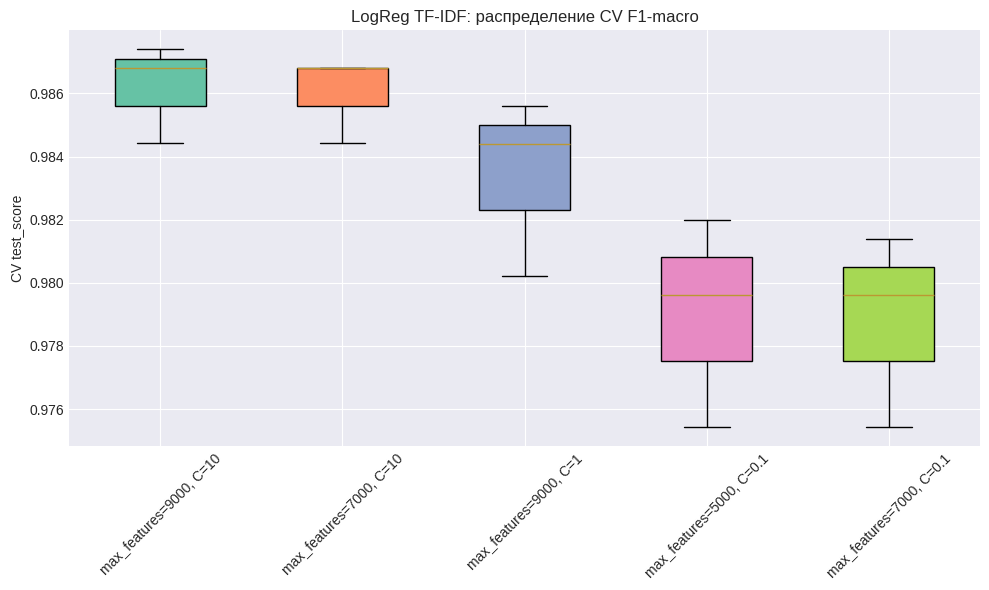

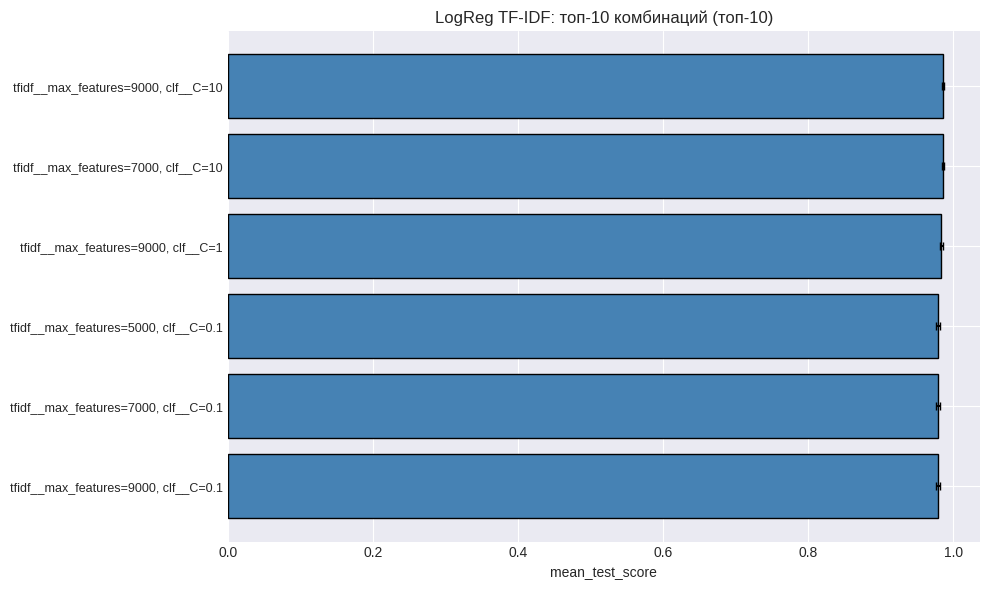

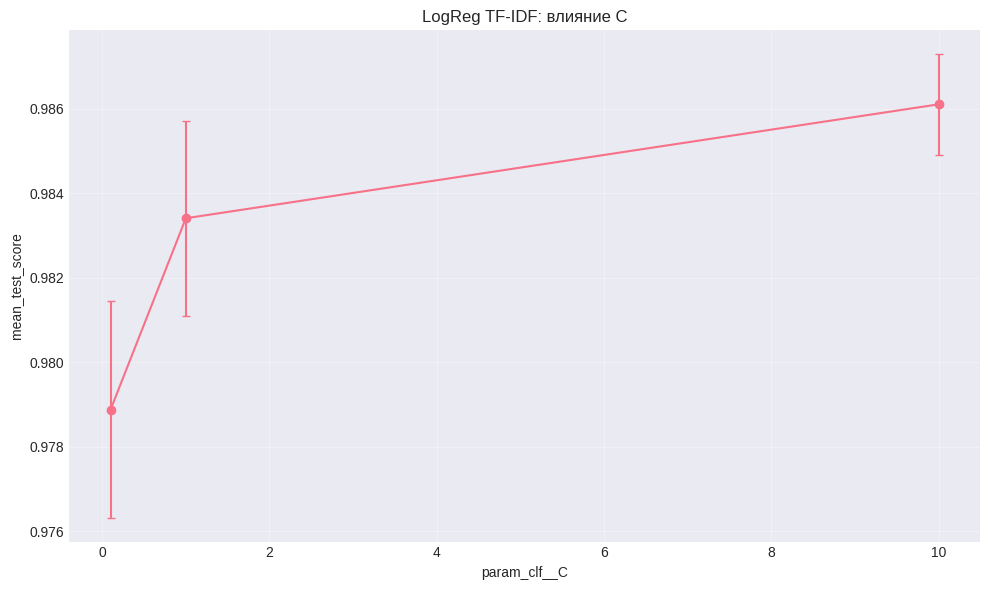

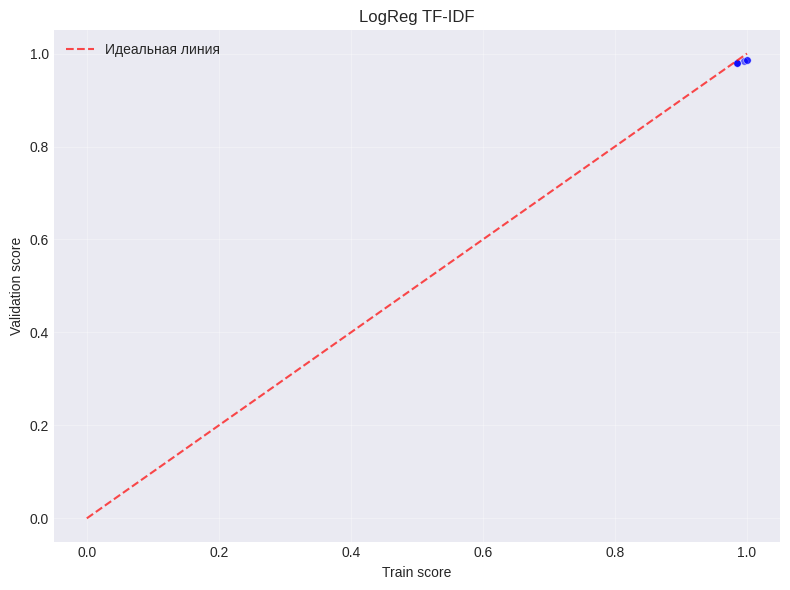

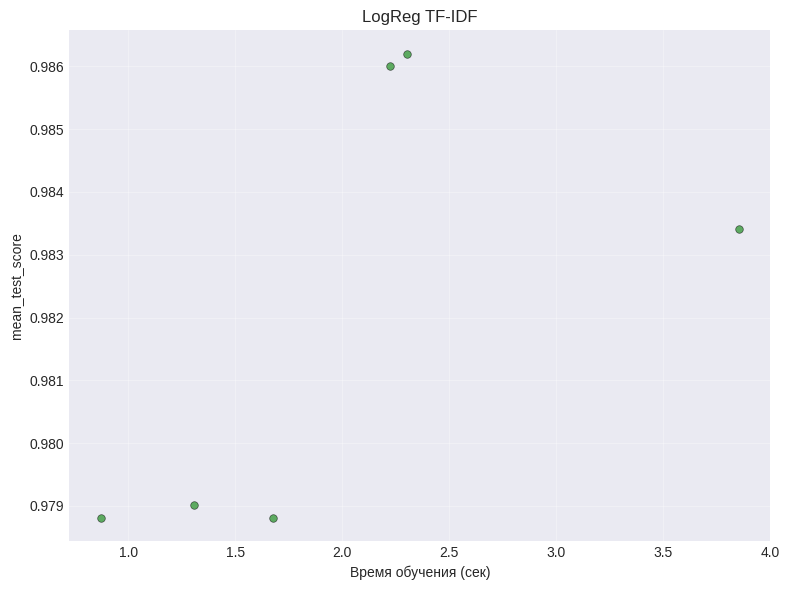


 Оценка на тестовой выборке...


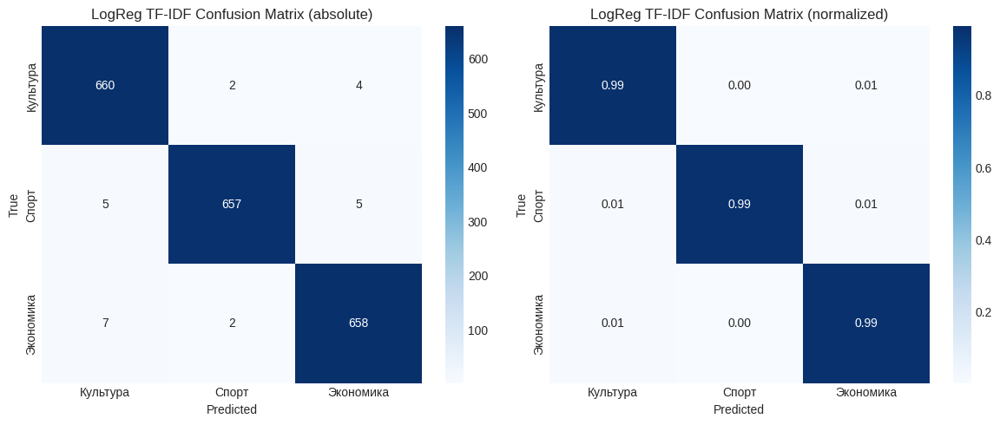

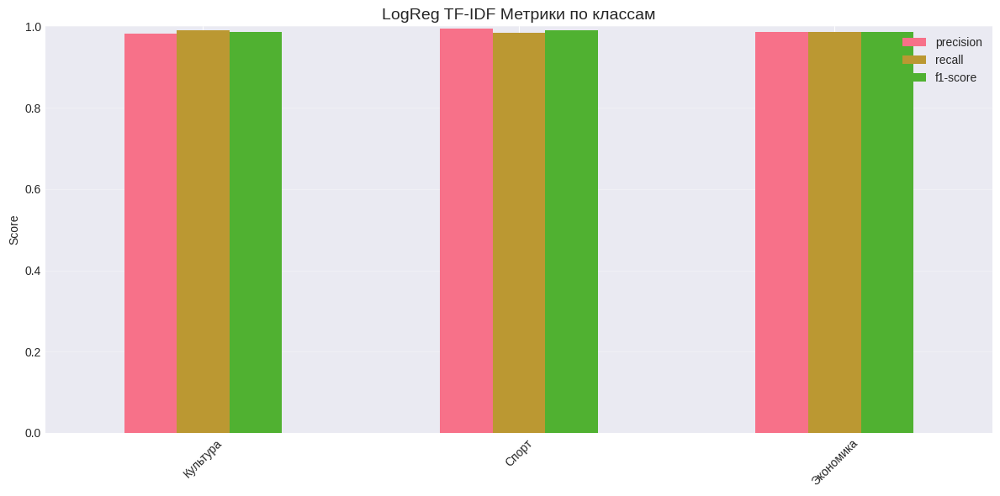

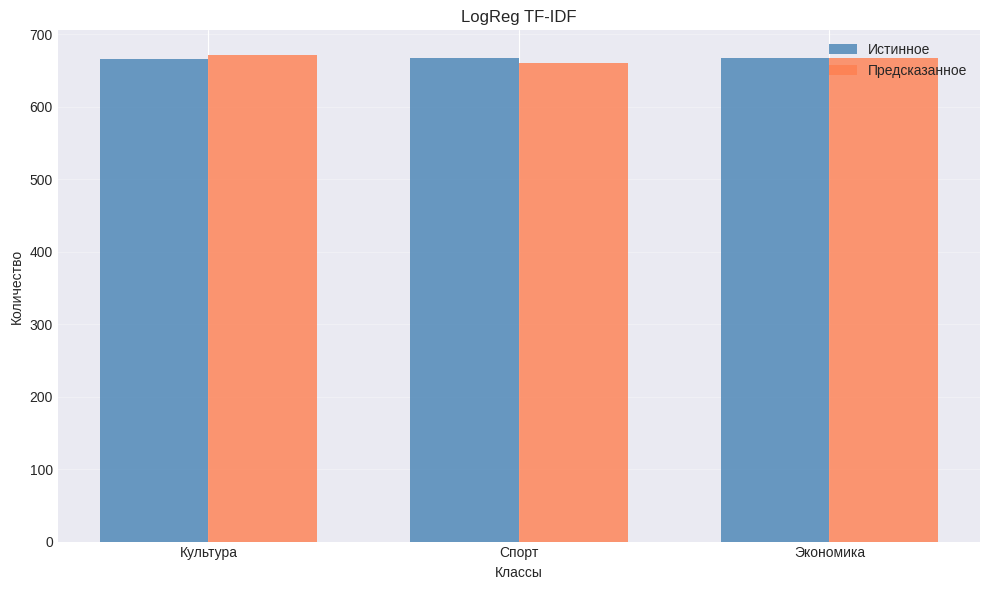


 Важность признаков...


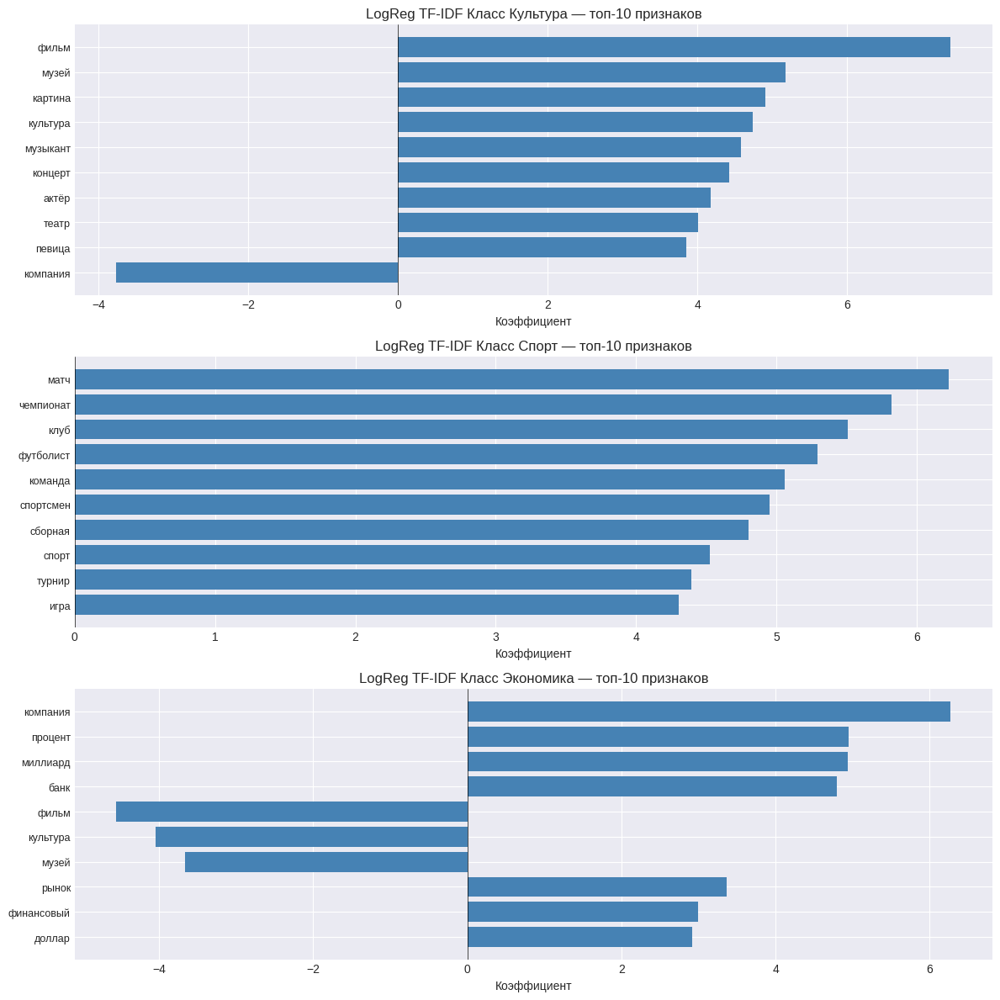


📉 Кривая обучения...


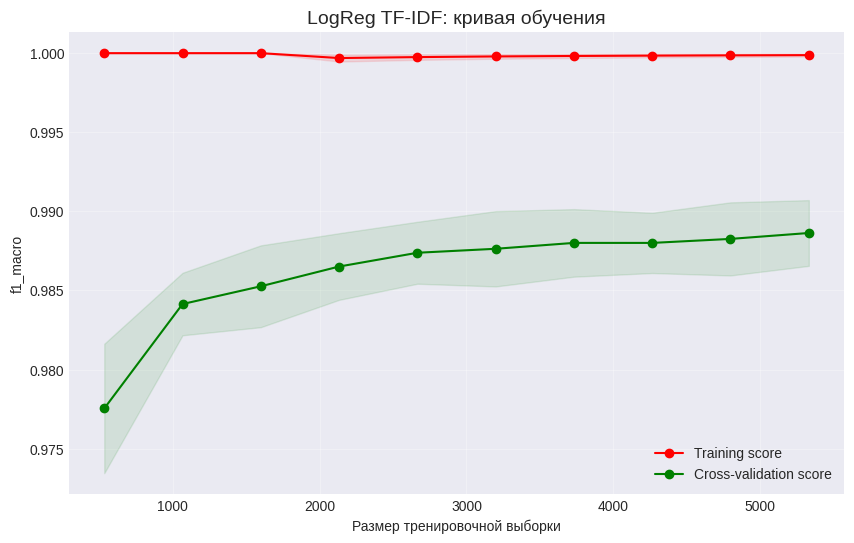

Train score (конец): 0.9999
Validation score (конец): 0.9886
Разница: 0.0112
✅  Модель хорошо обобщает

❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.965

2. Текст: строительство нулевой цикл здание второй сцена мариинский театр санкт петербург начаться май год заявить вица губернатор город александр вахмистр сообщать интерфакс ссылка пресс служба чиновник резуль...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.958

3. Текст: эстрадный певец иосиф кобзон скончаться продолжительный болезнь оставить ребёнок внук наследство стоимость миллиард рубль сообщать артист частность принадлежать участок площадь два гектар подмосковный...
   Истинный класс: Экономика, предсказанный: Культ

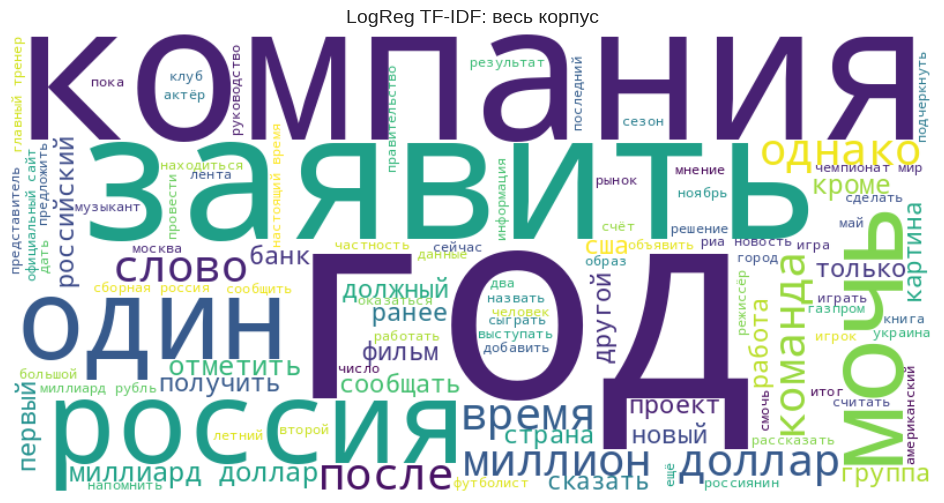

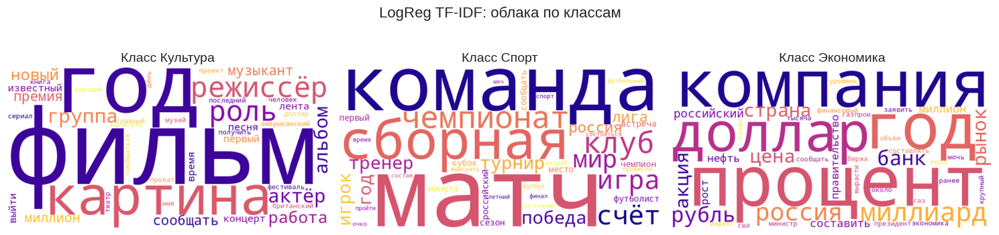


🧩 Визуализация признакового пространства...


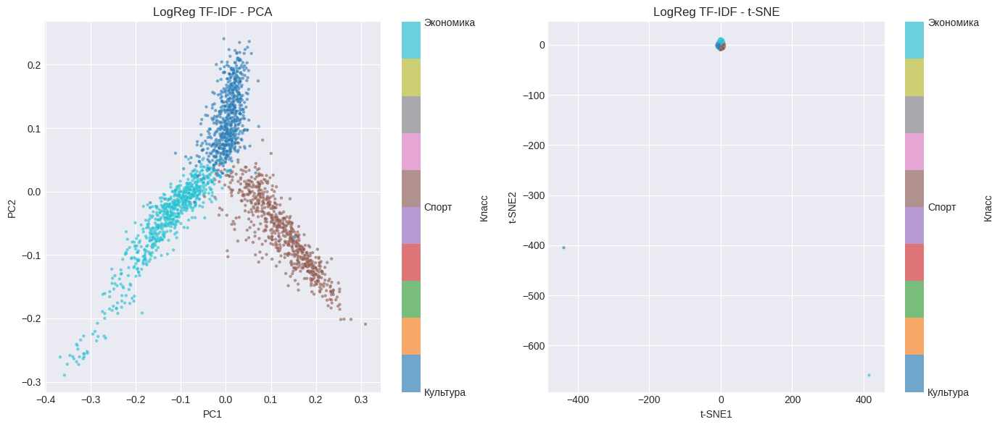


✅ Визуализация LogisticRegression завершена.


In [ ]:
# ============================================================
# 4. ВИЗУАЛИЗАЦИЯ LogisticRegression (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ LogisticRegression + TF-IDF")
print("="*60)

# Извлекаем объекты из results_lr
best_model = results_lr['model']
gs = results_lr['gs']
y_pred = results_lr['y_pred']
y_pred_proba = results_lr['y_pred_proba']
feature_names = results_lr['feature_names']
classes = results_lr['classes']

# ------------------------------------------------------------
# 1. АНАЛИЗ GRIDSEARCH
# ------------------------------------------------------------
print("\n Анализ GridSearchCV...")

# Тепловая карта – только если есть два числовых параметра
# В текущей сетке только C числовой, поэтому пропускаем
# Вместо этого показываем boxplot и bar chart

plot_gridsearch_boxplot(gs, top_n=5, metric='test_score',
                        title='LogReg TF-IDF: распределение CV F1-macro')

plot_gridsearch_top_params_bar(gs, top_n=10,
                               title='LogReg TF-IDF: топ-10 комбинаций')

# Влияние параметра C (с группировкой по stop_words, если есть)
if 'param_tfidf__stop_words' in gs.cv_results_:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__C',
                                     param_hue='param_tfidf__stop_words',
                                     show_std=True,
                                     title='LogReg TF-IDF: влияние C и стоп-слов')
else:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__C',
                                     show_std=True,
                                     title='LogReg TF-IDF: влияние C')

# Сравнение train/validation
plot_train_vs_validation_scatter(gs, title='LogReg TF-IDF')

# Производительность vs время
plot_performance_vs_time(gs,
                         metric='mean_test_score',
                         time_metric='mean_fit_time',
                         title='LogReg TF-IDF')

# ------------------------------------------------------------
# 2. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n Оценка на тестовой выборке...")

# Матрицы ошибок
plot_confusion_matrices(y_test, y_pred, classes,
                        title='LogReg TF-IDF')

# Метрики по классам
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='LogReg TF-IDF')

# Сравнение распределений
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='LogReg TF-IDF')

# ROC-кривая (для бинарной классификации)
if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='LogReg TF-IDF')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ
# ------------------------------------------------------------
print("\n Важность признаков...")

plot_feature_importance(best_model.named_steps['clf'],
                        feature_names,
                        classes=classes,
                        top_n=10,
                        title='LogReg TF-IDF')

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
print("\n📉 Кривая обучения...")

plot_learning_curve(best_model, X_train, y_train,
                    cv=3, scoring='f1_macro',
                    title='LogReg TF-IDF: кривая обучения')

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")

plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ
# ------------------------------------------------------------
print("\n☁️ Облака слов...")

# Общее облако
plot_wordcloud_general(X_train, max_words=100,
                       title='LogReg TF-IDF: весь корпус')

# Облака по классам
plot_wordclouds_by_class(X_train, y_train,
                         best_model.named_steps['tfidf'],
                         max_words=40,
                         title='LogReg TF-IDF: облака по классам')

# ------------------------------------------------------------
# 7. PCA / T-SNE
# ------------------------------------------------------------
print("\n🧩 Визуализация признакового пространства...")

# Получаем матрицу признаков для обучающей выборки
X_vec = best_model.named_steps['tfidf'].transform(X_train)

plot_pca_tsne(X_vec, y_train, sample_size=2000,
              title='LogReg TF-IDF')

print("\n✅ Визуализация LogisticRegression завершена.")
print("="*60)

2. ОБУЧЕНИЕИ И ОЦЕНКА SVM(SVC)

In [ ]:
# ============================================================
# 5. ОБУЧЕНИЕ SVM (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("SVM + TF-IDF")
print("="*60)

# ------------------------------------------------------------
# 1. Подвыборка для быстрого поиска — всего 3000 объектов
# ------------------------------------------------------------
print("\n Создаём подвыборку 3000 объектов для быстрого поиска...")
X_sample, _, y_sample, _ = train_test_split(
    X_train, y_train, train_size=3000, stratify=y_train, random_state=42
)

# ------------------------------------------------------------
# 2. Пайплайн ДЛЯ ПОИСКА — LinearSVC (без вероятностей)
# ------------------------------------------------------------
svm_pipeline_search = Pipeline([
    ('tfidf', TfidfVectorizer(
        lowercase=False,
        ngram_range=(1, 1),
        stop_words=russian_stop_words,
        max_features=3000,        # сокращаем словарь
        min_df=20,               # ещё больше режем редкие слова
        max_df=0.8,
        sublinear_tf=True
    )),
    ('clf', LinearSVC(
        class_weight='balanced',
        random_state=42,
        max_iter=2000,
        dual=False               # для разреженных матриц dual=False быстрее
    ))
])

# ------------------------------------------------------------
# 3. Распределение параметров — максимум 9 комбинаций
# ------------------------------------------------------------
param_dist_search = {
    'tfidf__max_features': [2000, 3000, 4000],
    'clf__C': [0.1, 1, 10]
}

print("\n Параметры RandomizedSearch (LinearSVC):")
print(f"   • Итераций: 6")
print(f"   • Кросс-валидация: 3 фолда")
print(f"   • Обучений моделей: {6 * 3} на подвыборке")
print(f"   ⏱️ Ожидаемое время: ~15–30 секунд")

# ------------------------------------------------------------
# 4. Запуск RandomizedSearch на подвыборке (LinearSVC)
# ------------------------------------------------------------
rs_svm_search = RandomizedSearchCV(
    svm_pipeline_search,
    param_dist_search,
    n_iter=6,
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=False   # экономим память и время
)

print("\n⏳ Поиск гиперпараметров на подвыборке (LinearSVC)...")
start_time = time.time()
rs_svm_search.fit(X_sample, y_sample)
end_search = time.time()
print(f"✅ Поиск завершён за {(end_search - start_time):.1f} секунд")

best_params_search = rs_svm_search.best_params_
print(f"\n🏆 Лучшие параметры (LinearSVC): {best_params_search}")

# ------------------------------------------------------------
# 5. Финальный пайплайн — SVC с вероятностями, на полных данных
# ------------------------------------------------------------
# Берём лучшие параметры TF-IDF из поиска
final_tfidf_params = {
    'lowercase': False,
    'ngram_range': (1, 1),
    'stop_words': russian_stop_words,
    'max_features': best_params_search['tfidf__max_features'],
    'min_df': 20,                     # оставляем то же значение
    'max_df': 0.8,
    'sublinear_tf': True
}

# Создаём финальный пайплайн с SVC(probability=True)
svm_pipeline_final = Pipeline([
    ('tfidf', TfidfVectorizer(**final_tfidf_params)),
    ('clf', SVC(
        kernel='linear',
        C=best_params_search['clf__C'],
        class_weight='balanced',
        probability=True,        # нужно только для ROC и predict_proba
        random_state=42,
        cache_size=1000,
        max_iter=5000
    ))
])

print("\n⏳ Обучение финальной модели на всех данных (SVC с вероятностями)...")
start_final = time.time()
svm_pipeline_final.fit(X_train, y_train)
end_final = time.time()
print(f"✅ Финальное обучение завершено за {(end_final - start_final)/60:.2f} минут")
print(f"✅ Общее время: {(end_final - start_time)/60:.2f} минут")

# ------------------------------------------------------------
# 6. Оценка на тесте
# ------------------------------------------------------------
best_model_svm = svm_pipeline_final
y_pred_svm = best_model_svm.predict(X_test)
y_pred_proba_svm = best_model_svm.predict_proba(X_test)

test_accuracy = accuracy_score(y_test, y_pred_svm)
test_precision = precision_score(y_test, y_pred_svm, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred_svm, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred_svm, average='macro', zero_division=0)

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ SVM (ФИНАЛЬНАЯ МОДЕЛЬ)")
print("="*60)
print(f"🏆 TF-IDF max_features: {final_tfidf_params['max_features']}")
print(f"🏆 C:                   {best_params_search['clf__C']}")
print(f"🎯 Тестовый F1 (macro): {test_f1:.4f}")
print(f"🎯 Тестовый Accuracy:   {test_accuracy:.4f}")
print(f"🎯 Precision (macro):   {test_precision:.4f}")
print(f"🎯 Recall (macro):      {test_recall:.4f}")

# ------------------------------------------------------------
# 7. Сохраняем результаты
# ------------------------------------------------------------
results_svm = {
    'name': 'SVM + TF-IDF (lightning)',
    'model': best_model_svm,
    'gs': rs_svm_search,
    'y_pred': y_pred_svm,
    'y_pred_proba': y_pred_proba_svm,
    'feature_names': best_model_svm.named_steps['tfidf'].get_feature_names_out(),
    'classes': best_model_svm.named_steps['clf'].classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': rs_svm_search.best_score_,
    'best_params': best_params_search,
    'training_time': end_final - start_time
}

print("\n Результаты сохранены в 'results_svm'")
joblib.dump(best_model_svm, 'best_svm_model.pkl')
print("✅ Модель сохранена как 'best_svm_model.pkl'")
print("="*60)


SVM + TF-IDF (МОЛНИЕНОСНАЯ ВЕРСИЯ)

 Создаём подвыборку 3000 объектов для быстрого поиска...

 Параметры RandomizedSearch (LinearSVC):
   • Итераций: 6
   • Кросс-валидация: 3 фолда
   • Обучений моделей: 18 на подвыборке
   ⏱️ Ожидаемое время: ~15–30 секунд

⏳ Поиск гиперпараметров на подвыборке (LinearSVC)...
Fitting 3 folds for each of 6 candidates, totalling 18 fits
✅ Поиск завершён за 7.3 секунд

🏆 Лучшие параметры (LinearSVC): {'tfidf__max_features': 4000, 'clf__C': 1}

⏳ Обучение финальной модели на всех данных (SVC с вероятностями)...
✅ Финальное обучение завершено за 1.44 минут
✅ Общее время: 1.56 минут

РЕЗУЛЬТАТЫ SVM (ФИНАЛЬНАЯ МОДЕЛЬ)
🏆 TF-IDF max_features: 4000
🏆 C:                   1
🎯 Тестовый F1 (macro): 0.9860
🎯 Тестовый Accuracy:   0.9860
🎯 Precision (macro):   0.9861
🎯 Recall (macro):      0.9860

 Результаты сохранены в 'results_svm'
✅ Модель сохранена как 'best_svm_model.pkl'


ВИЗУАЛИЗАЦИЯ SVM


ВИЗУАЛИЗАЦИЯ SVM + TF-IDF

 Анализ GridSearchCV...


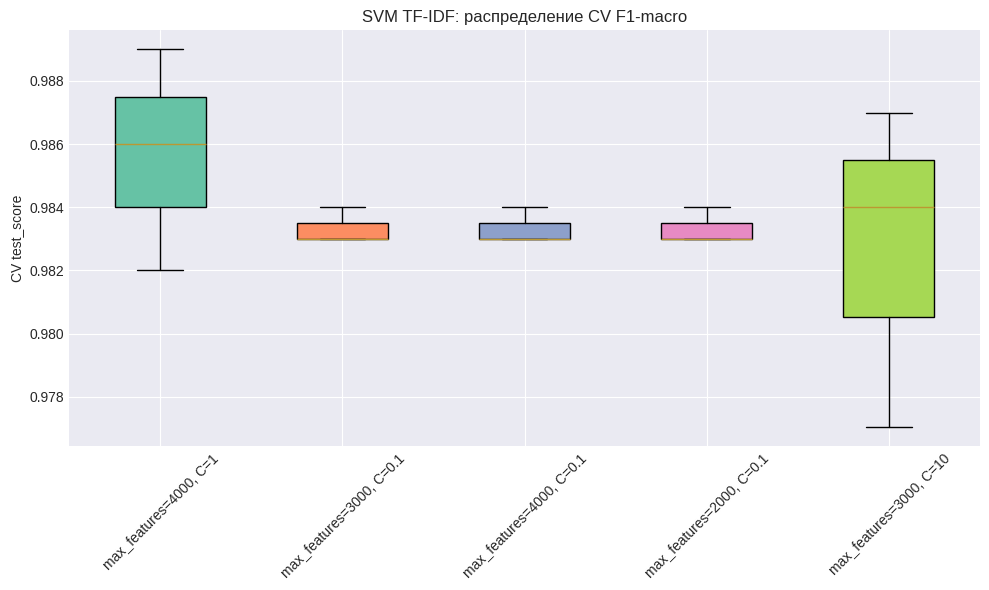

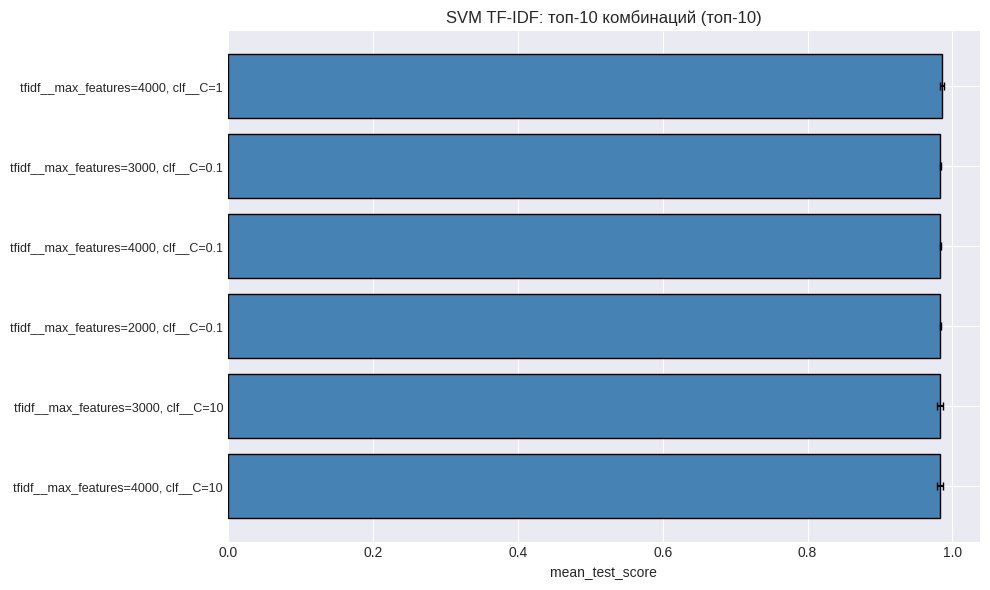

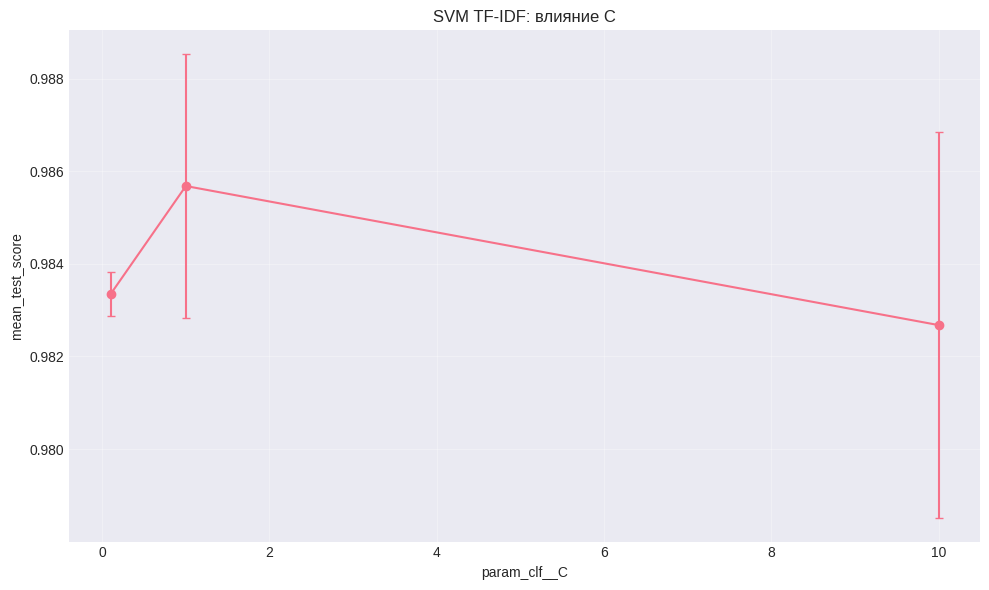

ℹ️ 'mean_train_score' отсутствует (return_train_score=False). Пропускаем scatter plot.


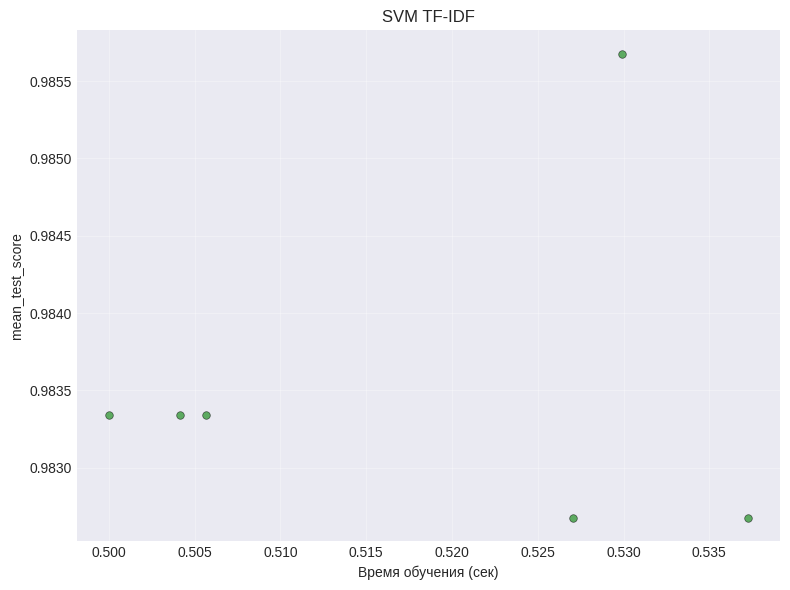


📈 Оценка на тестовой выборке...


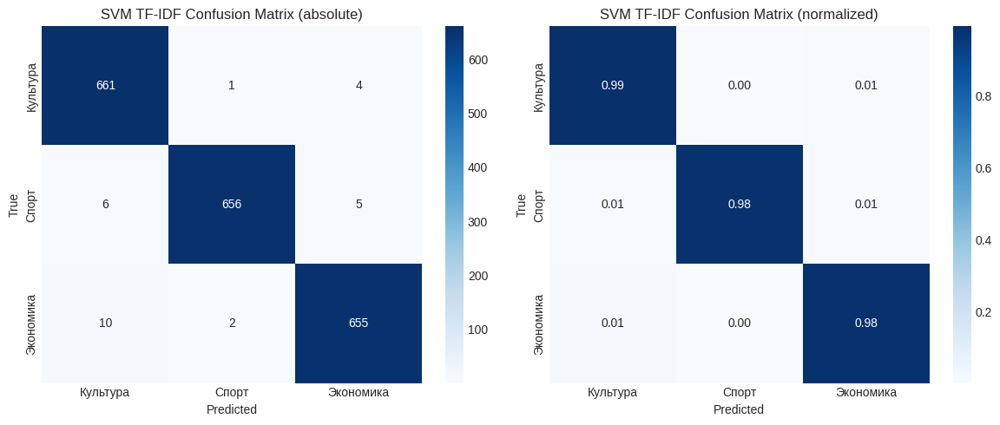

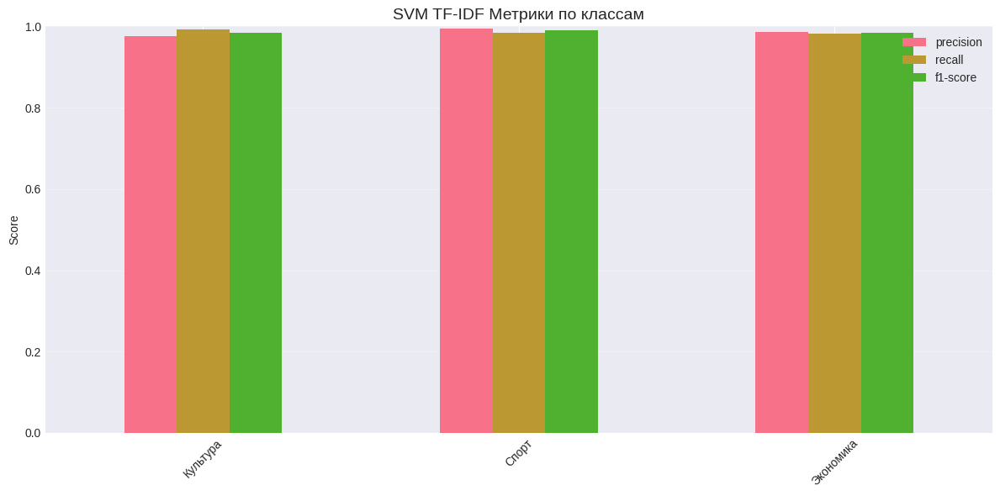

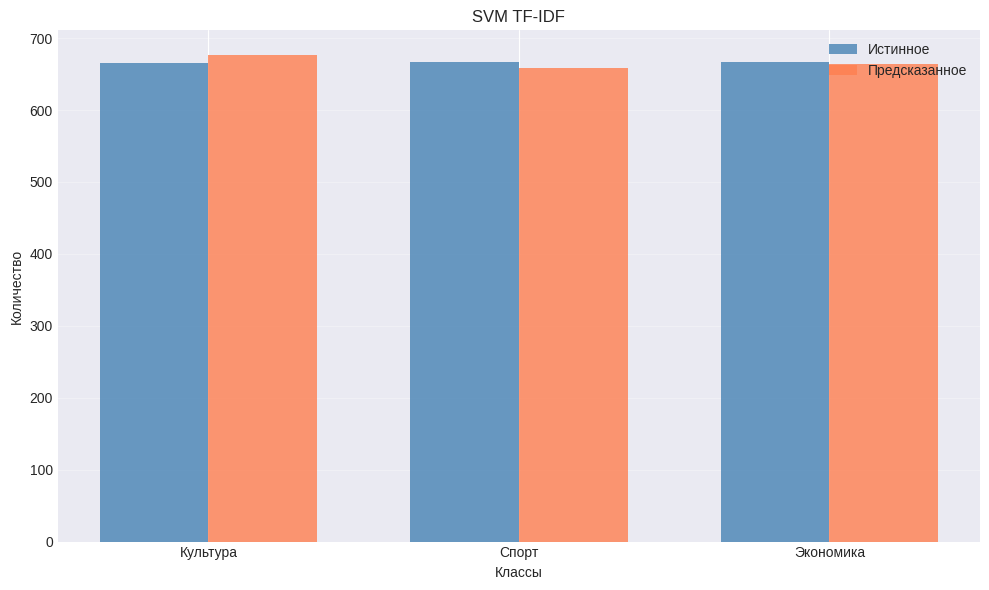


🔍 Важность признаков (только для линейного SVM)...


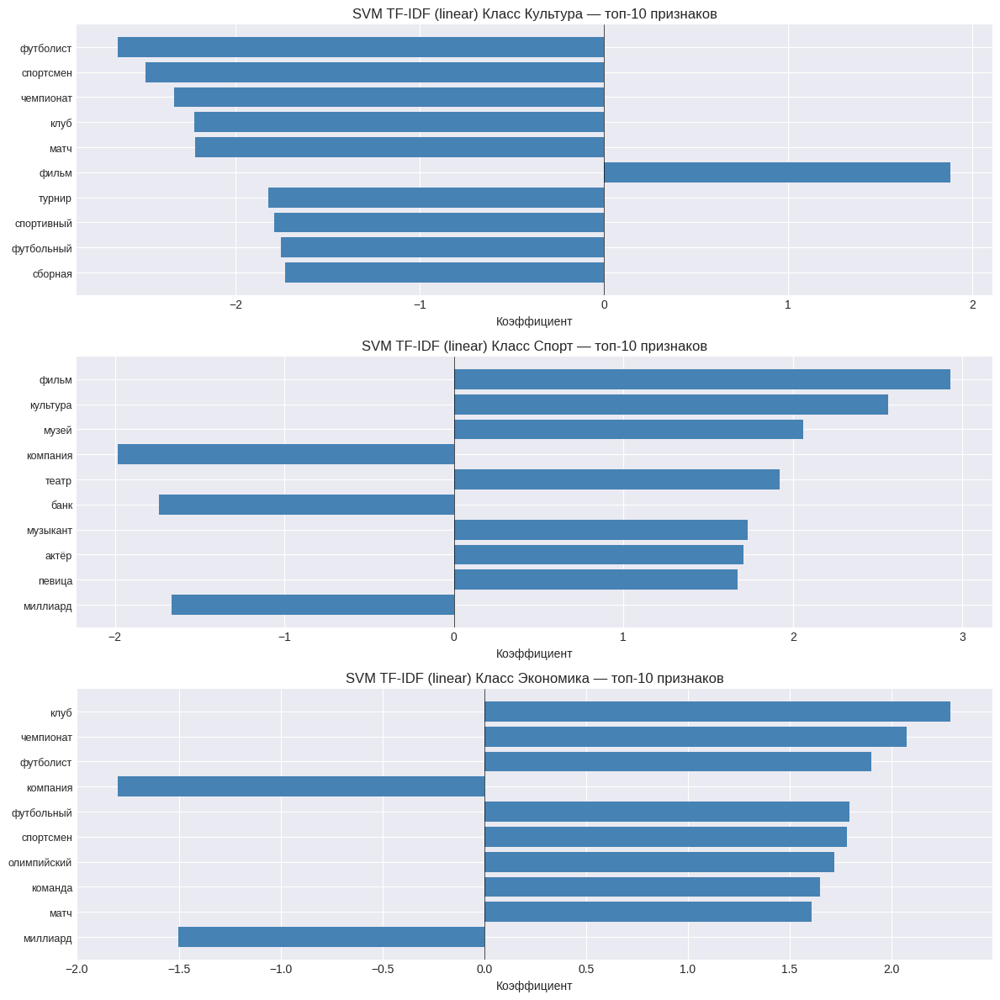


📉 Кривая обучения...


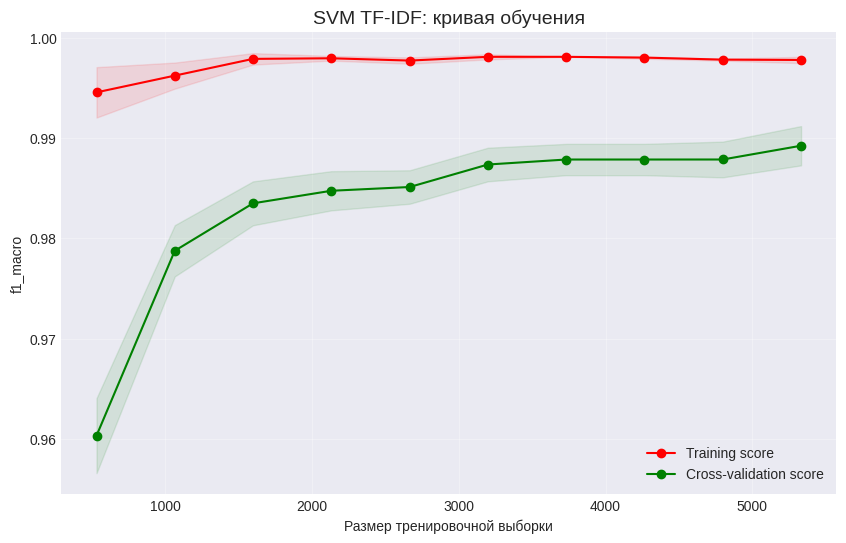

Train score (конец): 0.9978
Validation score (конец): 0.9893
Разница: 0.0086
✅  Модель хорошо обобщает

❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.998

2. Текст: строительство нулевой цикл здание второй сцена мариинский театр санкт петербург начаться май год заявить вица губернатор город александр вахмистр сообщать интерфакс ссылка пресс служба чиновник резуль...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.993

3. Текст: семикратный чемпион мир формула немец михаэль шумахер день исполниться год подарить день рождение вилла кассинелла ленный берег озеро комо север италия стоимость вилла построить год добраться только в...
   Истинный класс: Спорт, предсказанный: Культура


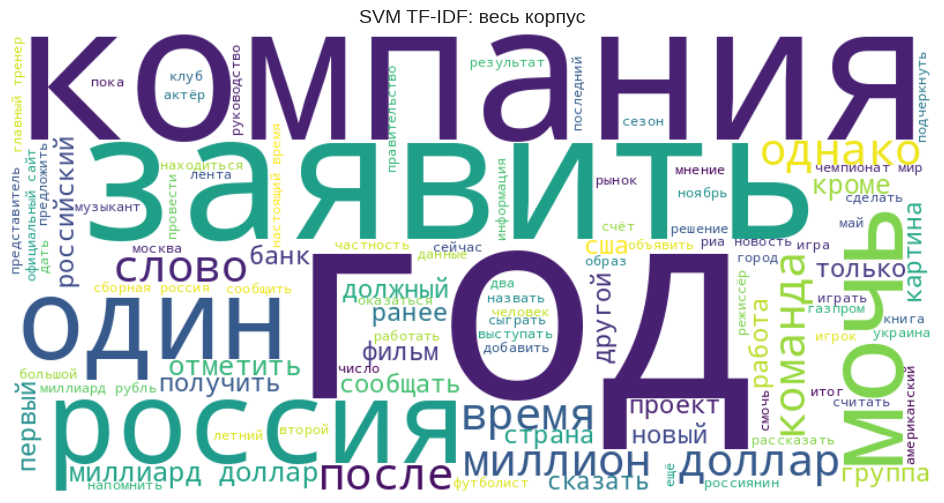

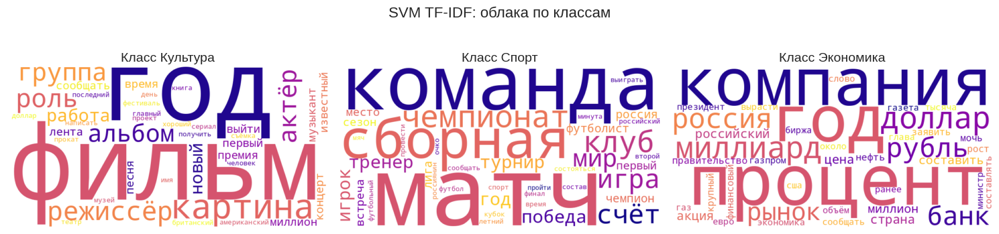


 Визуализация признакового пространства...


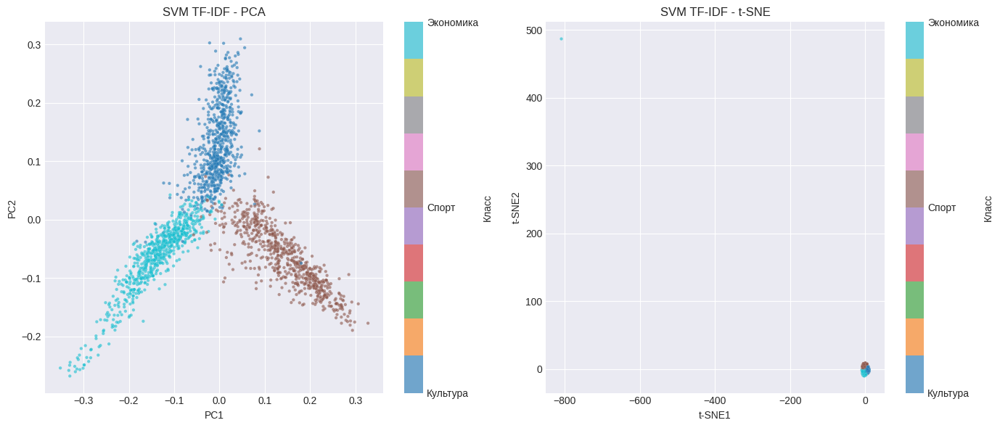


✅ Визуализация SVM завершена.


In [ ]:
# ============================================================
# 6. ВИЗУАЛИЗАЦИЯ SVM (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ SVM + TF-IDF")
print("="*60)

# Извлекаем объекты из results_svm
best_model = results_svm['model']
gs = results_svm['gs']
y_pred = results_svm['y_pred']
y_pred_proba = results_svm['y_pred_proba']
feature_names = results_svm['feature_names']
classes = results_svm['classes']

# ------------------------------------------------------------
# 1. АНАЛИЗ GRIDSEARCH
# ------------------------------------------------------------
print("\n Анализ GridSearchCV...")

# Boxplot топ-5 комбинаций
plot_gridsearch_boxplot(gs, top_n=5, metric='test_score',
                        title='SVM TF-IDF: распределение CV F1-macro')

# Топ-10 комбинаций (bar chart)
plot_gridsearch_top_params_bar(gs, top_n=10,
                               title='SVM TF-IDF: топ-10 комбинаций')

# Влияние параметра C (с группировкой по ядру)
if 'param_clf__kernel' in gs.cv_results_:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__C',
                                     param_hue='param_clf__kernel',
                                     show_std=True,
                                     title='SVM TF-IDF: влияние C и kernel')
else:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__C',
                                     show_std=True,
                                     title='SVM TF-IDF: влияние C')

# Сравнение train/validation
plot_train_vs_validation_scatter(gs, title='SVM TF-IDF')

# Производительность vs время
plot_performance_vs_time(gs,
                         metric='mean_test_score',
                         time_metric='mean_fit_time',
                         title='SVM TF-IDF')

# ------------------------------------------------------------
# 2. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

# Матрицы ошибок
plot_confusion_matrices(y_test, y_pred, classes,
                        title='SVM TF-IDF')

# Метрики по классам
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='SVM TF-IDF')

# Сравнение распределений
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='SVM TF-IDF')

# ROC-кривая (для бинарной классификации)
if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='SVM TF-IDF')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (только для линейного ядра)
# ------------------------------------------------------------
print("\n🔍 Важность признаков (только для линейного SVM)...")

# Проверяем, является ли лучшая модель линейной
clf = best_model.named_steps['clf']
if clf.kernel == 'linear':
    plot_feature_importance(clf,
                            feature_names,
                            classes=classes,
                            top_n=10,
                            title='SVM TF-IDF (linear)')
else:
    print("   ⚠️ Лучшая модель использует нелинейное ядро – визуализация коэффициентов недоступна.")

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
print("\n📉 Кривая обучения...")

plot_learning_curve(best_model, X_train, y_train,
                    cv=3, scoring='f1_macro',
                    title='SVM TF-IDF: кривая обучения')

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")

plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ
# ------------------------------------------------------------
print("\n☁️ Облака слов...")

# Общее облако
plot_wordcloud_general(X_train, max_words=100,
                       title='SVM TF-IDF: весь корпус')

# Облака по классам
plot_wordclouds_by_class(X_train, y_train,
                         best_model.named_steps['tfidf'],
                         max_words=40,
                         title='SVM TF-IDF: облака по классам')

# ------------------------------------------------------------
# 7. PCA / T-SNE
# ------------------------------------------------------------
print("\n Визуализация признакового пространства...")

X_vec = best_model.named_steps['tfidf'].transform(X_train)
plot_pca_tsne(X_vec, y_train, sample_size=2000,
              title='SVM TF-IDF')

print("\n✅ Визуализация SVM завершена.")
print("="*60)

3. RFC

3.1. ОБУЧЕНИЕ И ОЦЕНКА RANDOM FOREST (TF-IDF)

In [ ]:
# ============================================================
# 7. ОБУЧЕНИЕ RANDOM FOREST (TF-IDF)
# ============================================================
print("\n" + "="*60)
print("RANDOM FOREST + TF-IDF")
print("="*60)

# --- 1. Пайплайн с фиксированными TF-IDF параметрами (из опыта LogReg) ---
rf_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(
        lowercase=False,
        ngram_range=(1, 1),                # только униграммы
        stop_words=None,                   # будет перебираться
        max_features=10000,                 # можно 7000–10000
        min_df=5,                           # увеличили
        max_df=0.8,                          # уменьшили
        sublinear_tf=True
    )),
    ('clf', RandomForestClassifier(
        random_state=42,
        n_jobs=-1,
        class_weight='balanced'
    ))
])

# --- 2. Сокращённое пространство параметров ---
rf_param_dist = {
    'tfidf__stop_words': [None, russian_stop_words],
    'tfidf__max_features': [7000, 10000],          # два значения
    'clf__n_estimators': randint(150, 250),
    'clf__max_depth': [None, 20, 30],
    'clf__min_samples_split': randint(5, 15),
    'clf__min_samples_leaf': randint(2, 8),
    'clf__max_features': ['sqrt', 'log2'],
    'clf__bootstrap': [True, False]
}

# --- 3. Подсчёт комбинаций (для информации) ---
total_space = np.prod([len(v) if isinstance(v, list) else 20 for v in rf_param_dist.values()])
print(f"\n📊 Параметры RandomizedSearch:")
print(f"   • Общий размер пространства: ~{total_space} комбинаций")
print(f"   • Итераций: 10")
print(f"   • Кросс-валидация: 3 фолда")
print(f"   • Обучений моделей: {10 * 3}")
print(f"   ⏱️ Ожидаемое время: ~15–25 минут")

# --- 4. Запуск RandomizedSearchCV ---
rf_random = RandomizedSearchCV(
    rf_pipeline,
    rf_param_dist,
    n_iter=10,
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

print("\n⏳ Начинаем подбор гиперпараметров Random Forest...")
start_time = time.time()
rf_random.fit(X_train, y_train)
end_time = time.time()
print(f"✅ Обучение завершено за {(end_time - start_time)/60:.2f} минут")

# 5. Лучшая модель и оценка на тесте
# ------------------------------------------------------------
best_model_rf = rf_random.best_estimator_
y_pred_rf = best_model_rf.predict(X_test)
y_pred_proba_rf = best_model_rf.predict_proba(X_test)

# Метрики
test_accuracy = accuracy_score(y_test, y_pred_rf)
test_precision = precision_score(y_test, y_pred_rf, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred_rf, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred_rf, average='macro', zero_division=0)
cv_f1 = rf_random.best_score_

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ RANDOM FOREST")
print("="*60)
print(f"🏆 Лучшие параметры:          {rf_random.best_params_}")
print(f"📈 Лучший CV F1 (macro):      {cv_f1:.4f}")
print(f"🎯 Тестовый Accuracy:         {test_accuracy:.4f}")
print(f"🎯 Тестовый Precision (macro): {test_precision:.4f}")
print(f"🎯 Тестовый Recall (macro):    {test_recall:.4f}")
print(f"🎯 Тестовый F1 (macro):        {test_f1:.4f}")

# ------------------------------------------------------------
# 6. Сохраняем результаты для сравнения
# ------------------------------------------------------------
results_rf = {
    'name': 'RandomForest + TF-IDF',
    'model': best_model_rf,
    'gs': rf_random,                    # RandomizedSearchCV объект
    'y_pred': y_pred_rf,
    'y_pred_proba': y_pred_proba_rf,
    'feature_names': best_model_rf.named_steps['tfidf'].get_feature_names_out(),
    'classes': best_model_rf.named_steps['clf'].classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': cv_f1,
    'best_params': rf_random.best_params_,
    'training_time': end_time - start_time
}

print("\n💾 Результаты сохранены в словарь 'results_rf'")
print("="*60)

# Опционально: сохраняем модель
joblib.dump(best_model_rf, 'best_random_forest.pkl')
print("✅ Модель сохранена как 'best_random_forest.pkl'")


RANDOM FOREST + TF-IDF

📊 Параметры RandomizedSearch:
   • Общий размер пространства: ~384000 комбинаций
   • Итераций: 10
   • Кросс-валидация: 3 фолда
   • Обучений моделей: 30
   ⏱️ Ожидаемое время: ~15–25 минут

⏳ Начинаем подбор гиперпараметров Random Forest...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
✅ Обучение завершено за 2.90 минут

РЕЗУЛЬТАТЫ RANDOM FOREST
🏆 Лучшие параметры:          {'clf__bootstrap': True, 'clf__max_depth': None, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 4, 'clf__min_samples_split': 14, 'clf__n_estimators': 241, 'tfidf__max_features': 10000, 'tfidf__stop_words': ['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 

3.2. Визуализация Random Forest


ВИЗУАЛИЗАЦИЯ RandomForest + TF-IDF

 Анализ результатов RandomizedSearch...


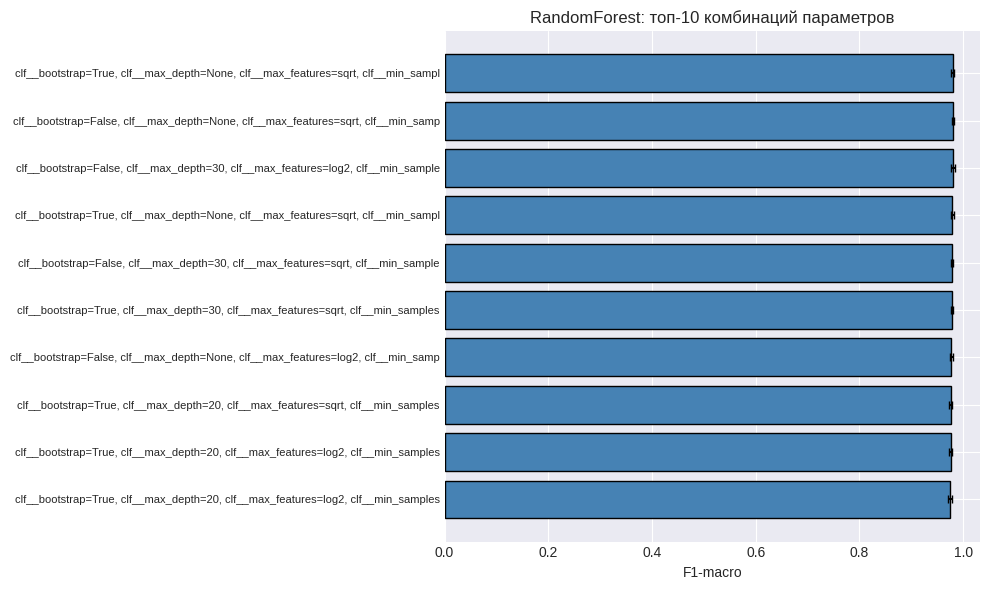

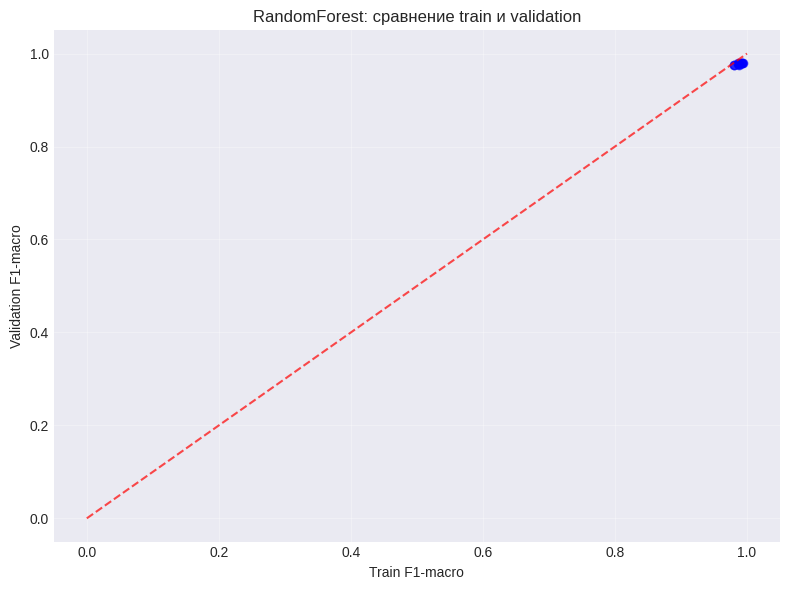

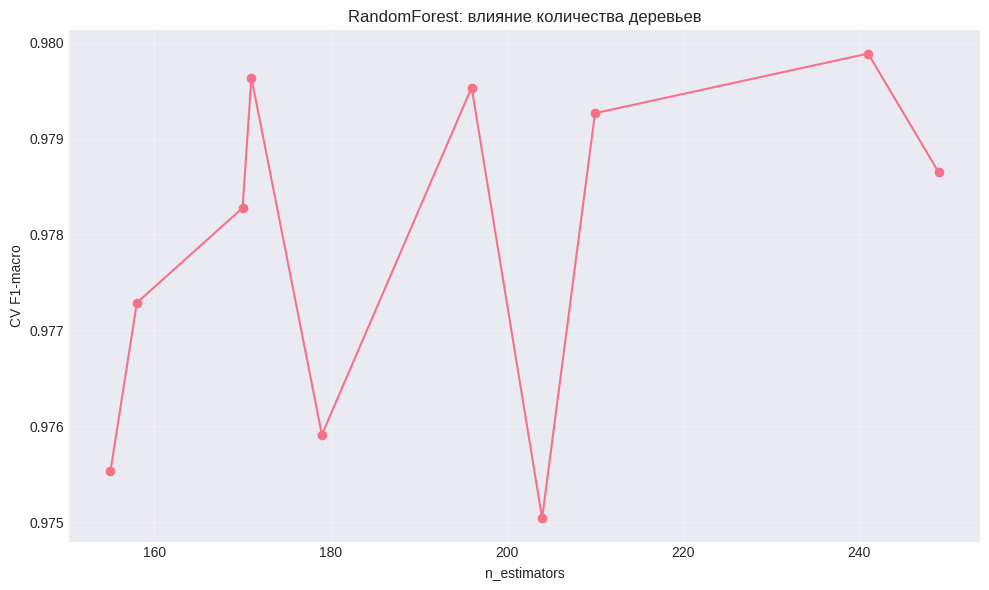


📈 Оценка на тестовой выборке...


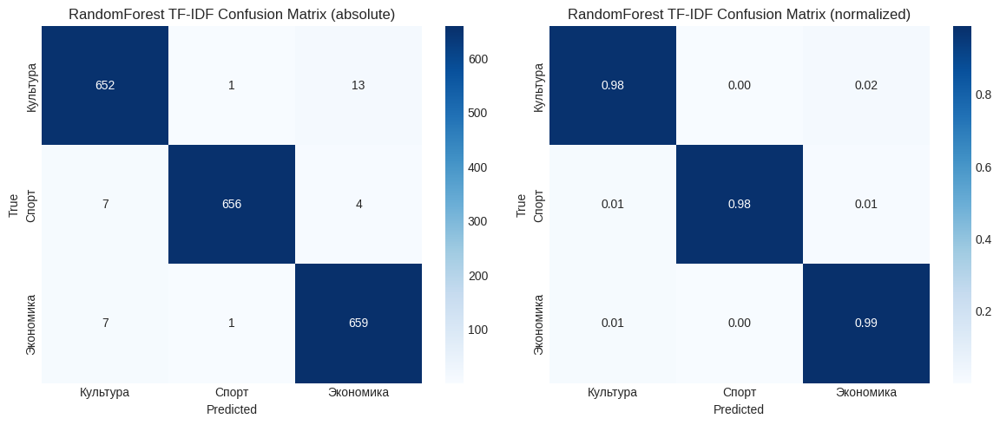

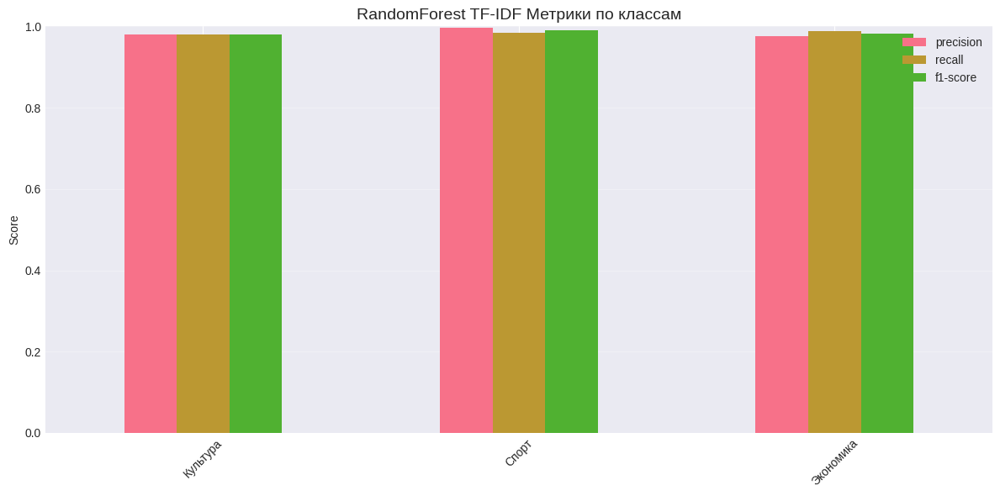

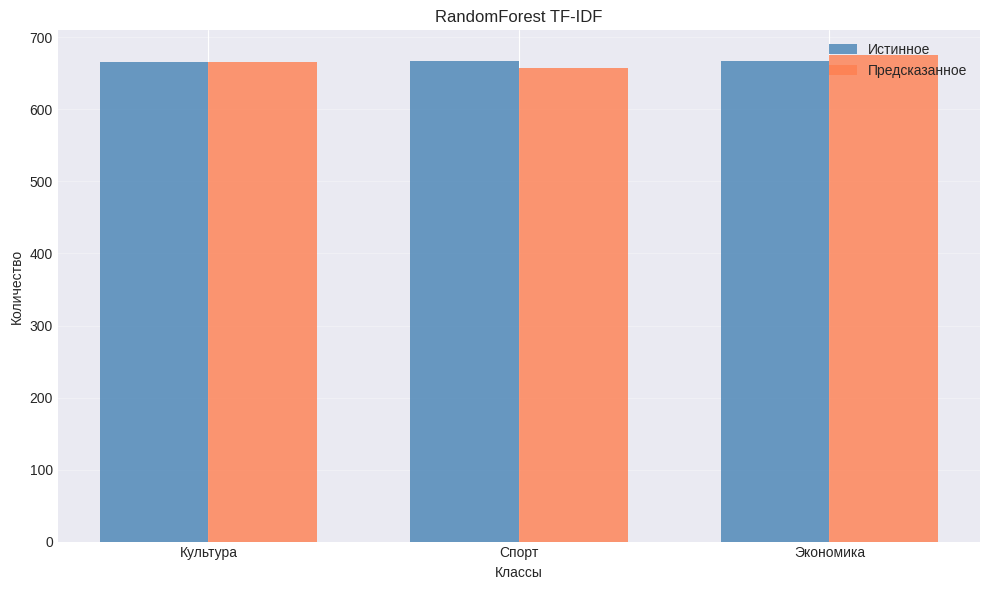


🔍 Важность признаков...


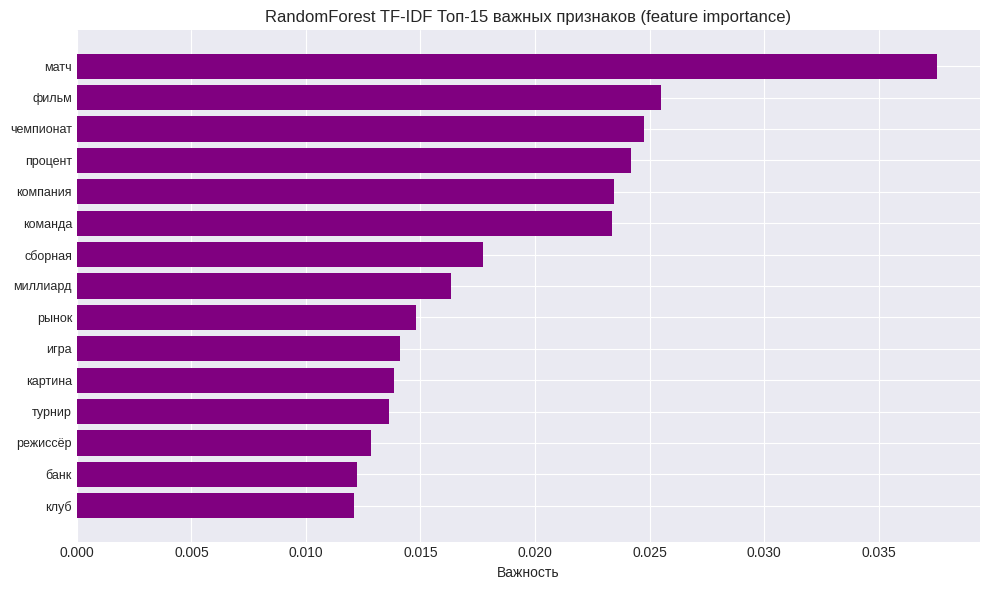


📉 Кривая обучения...


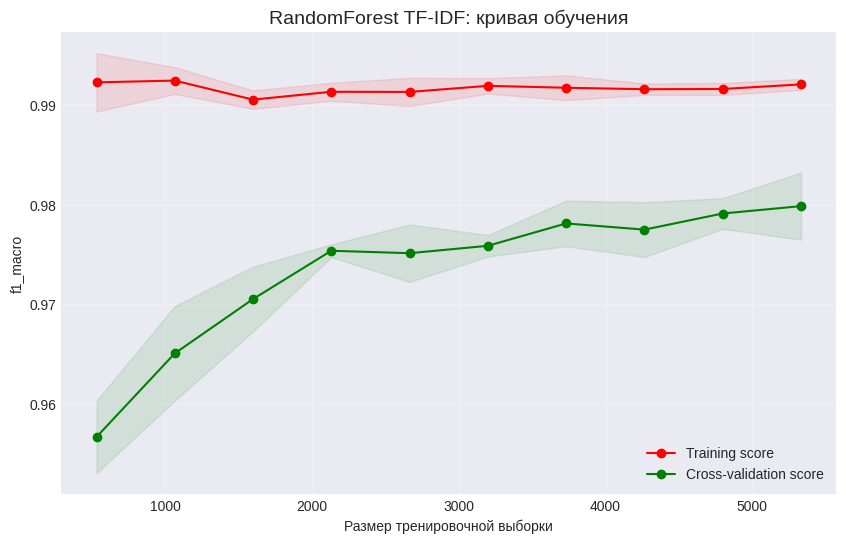

Train score (конец): 0.9921
Validation score (конец): 0.9799
Разница: 0.0122
✅  Модель хорошо обобщает

❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: семикратный чемпион мир формула немец михаэль шумахер день исполниться год подарить день рождение вилла кассинелла ленный берег озеро комо север италия стоимость вилла построить год добраться только в...
   Истинный класс: Спорт, предсказанный: Культура
   Уверенность: 0.704

2. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.681

3. Текст: боец смешанный единоборство американец джефф монсон продекламировать стих бывший министр экономический развитие россия алексей улюкаева следствие обвинить получение взятка особо крупный размер видео р...
   Истинный класс: Спорт, предсказанный: Экономика
   

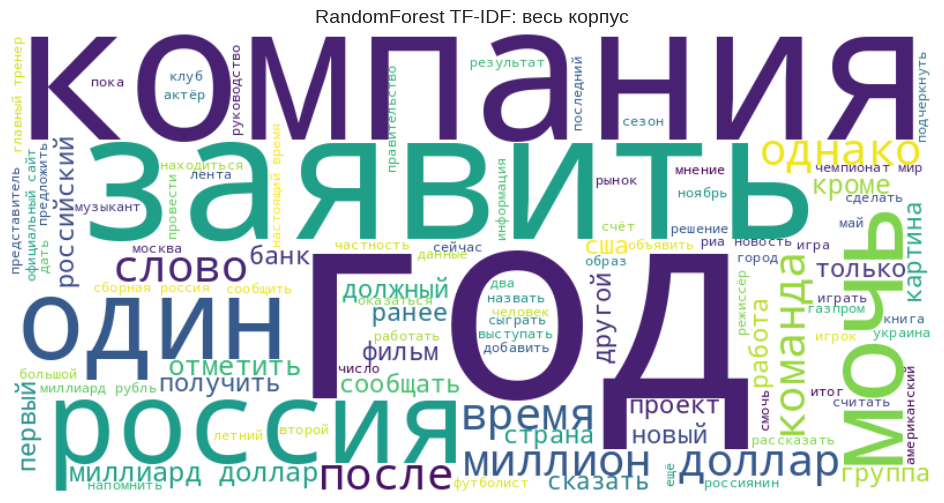

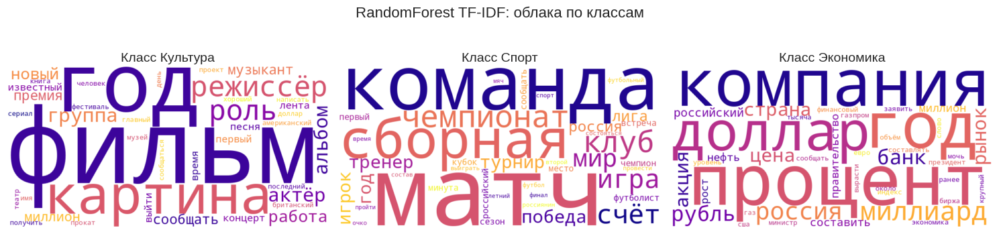


🧩 Визуализация признакового пространства...


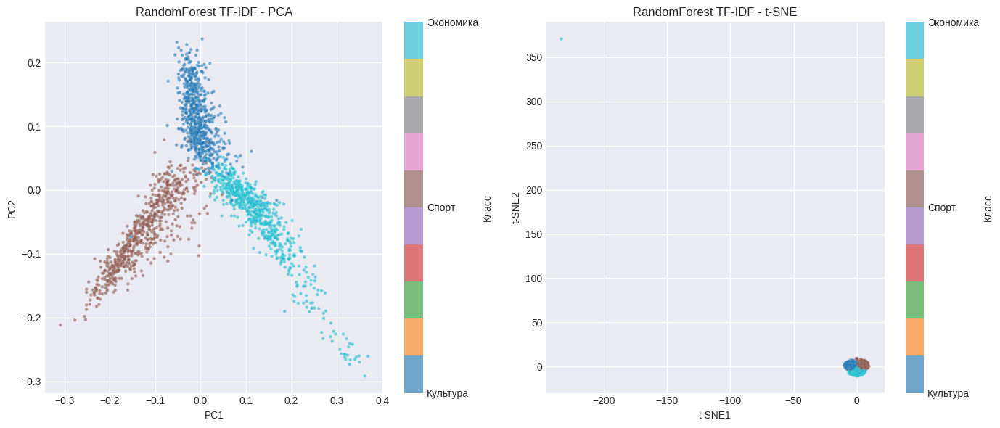


✅ Визуализация RandomForest завершена.


In [ ]:
# ============================================================
# 8. ВИЗУАЛИЗАЦИЯ RANDOM FOREST (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ RandomForest + TF-IDF")
print("="*60)

# Извлекаем объекты из results_rf
best_model = results_rf['model']
gs = results_rf['gs']                 # RandomizedSearchCV объект
y_pred = results_rf['y_pred']
y_pred_proba = results_rf['y_pred_proba']
feature_names = results_rf['feature_names']
classes = results_rf['classes']

# ------------------------------------------------------------
# 1. АНАЛИЗ РЕЗУЛЬТАТОВ ПОИСКА (RandomizedSearch)
# ------------------------------------------------------------
print("\n Анализ результатов RandomizedSearch...")

# Для RandomizedSearchCV тоже можно использовать часть функций,
# но они ожидают GridSearchCV. Адаптируем вручную.

# Топ-10 комбинаций (bar chart)
results_df = pd.DataFrame(gs.cv_results_)
results_df = results_df.sort_values('mean_test_score', ascending=False)

# Горизонтальный bar chart для топ-10
top10 = results_df.head(10)
params_str = []
for params in top10['params']:
    s = ', '.join([f"{k}={v}" for k, v in params.items() if 'tfidf' in k or 'clf__' in k])
    params_str.append(s[:80])

plt.figure(figsize=(10, 6))
y_pos = np.arange(len(params_str))
plt.barh(y_pos, top10['mean_test_score'].values, xerr=top10['std_test_score'].values,
         capsize=3, color='steelblue', edgecolor='black')
plt.yticks(y_pos, params_str, fontsize=8)
plt.xlabel('F1-macro')
plt.title('RandomForest: топ-10 комбинаций параметров')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Scatter plot train vs validation
plt.figure(figsize=(8, 6))
plt.scatter(results_df['mean_train_score'], results_df['mean_test_score'], alpha=0.6, c='blue')
plt.plot([0, 1], [0, 1], 'r--', alpha=0.7)
plt.xlabel('Train F1-macro')
plt.ylabel('Validation F1-macro')
plt.title('RandomForest: сравнение train и validation')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Влияние количества деревьев (если есть в результатах)
if 'param_clf__n_estimators' in results_df.columns:
    plt.figure(figsize=(10, 6))
    # Группируем по n_estimators и усредняем
    grouped = results_df.groupby('param_clf__n_estimators')['mean_test_score'].mean().reset_index()
    plt.plot(grouped['param_clf__n_estimators'], grouped['mean_test_score'], marker='o')
    plt.xlabel('n_estimators')
    plt.ylabel('CV F1-macro')
    plt.title('RandomForest: влияние количества деревьев')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 2. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

plot_confusion_matrices(y_test, y_pred, classes,
                        title='RandomForest TF-IDF')

plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='RandomForest TF-IDF')

plot_true_vs_pred_distribution(y_test, y_pred,
                               title='RandomForest TF-IDF')

if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='RandomForest TF-IDF')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (feature importances)
# ------------------------------------------------------------
print("\n🔍 Важность признаков...")

plot_feature_importance(best_model.named_steps['clf'],
                        feature_names,
                        top_n=15,               # можно больше для леса
                        title='RandomForest TF-IDF')

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
print("\n📉 Кривая обучения...")

plot_learning_curve(best_model, X_train, y_train,
                    cv=3, scoring='f1_macro',
                    title='RandomForest TF-IDF: кривая обучения')

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")

plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ
# ------------------------------------------------------------
print("\n☁️ Облака слов...")

plot_wordcloud_general(X_train, max_words=100,
                       title='RandomForest TF-IDF: весь корпус')

plot_wordclouds_by_class(X_train, y_train,
                         best_model.named_steps['tfidf'],
                         max_words=40,
                         title='RandomForest TF-IDF: облака по классам')

# ------------------------------------------------------------
# 7. PCA / T-SNE
# ------------------------------------------------------------
print("\n🧩 Визуализация признакового пространства...")

X_vec = best_model.named_steps['tfidf'].transform(X_train)
plot_pca_tsne(X_vec, y_train, sample_size=2000,
              title='RandomForest TF-IDF')

print("\n✅ Визуализация RandomForest завершена.")
print("="*60)

4. ОБУЧЕНИЕ Multinomial Naive Bayes (TF-IDF)

4.1.ОБУЧЕНИЕ И ОЦЕНКА MultinomialNB

In [ ]:
# ============================================================
# 9. ОБУЧЕНИЕ MULTINOMIAL NAIVE BAYES (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("MULTINOMIAL NAIVE BAYES + TF-IDF (ОПТИМИЗИРОВАНО)")
print("="*60)

# ------------------------------------------------------------
# 1. Пайплайн с фиксированными разумными параметрами TF-IDF
# ------------------------------------------------------------
nb_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(
        lowercase=False,
        ngram_range=(1, 2),          # будем перебирать
        stop_words=None,              # будем перебирать
        max_features=15000,           # будем перебирать
        min_df=2,                     # фиксируем
        max_df=0.95,                   # фиксируем
        sublinear_tf=True               # фиксируем (обычно полезно)
    )),
    ('clf', MultinomialNB())
])

# ------------------------------------------------------------
# 2. Уменьшенное пространство поиска
# ------------------------------------------------------------
param_dist = {
    'tfidf__stop_words': [None, russian_stop_words],
    'tfidf__ngram_range': [(1, 1), (1, 2)],
    'tfidf__max_features': [10000, 15000, 20000],
    'clf__alpha': [0.01, 0.1, 0.5, 1.0, 2.0]
}

# ------------------------------------------------------------
# 3. Поиск на подвыборке (5000 объектов)
# ------------------------------------------------------------
X_sample, _, y_sample, _ = train_test_split(
    X_train, y_train, train_size=5000, stratify=y_train, random_state=42
)

rs_nb = RandomizedSearchCV(
    nb_pipeline,
    param_dist,
    n_iter=30,                        # 30 случайных комбинаций
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

print("\n⏳ Поиск на подвыборке (5000 объектов)...")
start_time = time.time()
rs_nb.fit(X_sample, y_sample)
print(f"✅ Поиск завершён за {(time.time() - start_time)/60:.2f} минут")

best_params = rs_nb.best_params_
print(f"🏆 Лучшие параметры (найденные на подвыборке): {best_params}")

# ------------------------------------------------------------
# 4. Финальное обучение на всех данных
# ------------------------------------------------------------
print("\n⏳ Обучение финальной модели на всех данных...")
final_model = nb_pipeline.set_params(**best_params)
final_model.fit(X_train, y_train)
end_time = time.time()
print(f"✅ Финальное обучение завершено за {(end_time - start_time)/60:.2f} минут")

# ------------------------------------------------------------
# 5. Оценка на тестовой выборке
# ------------------------------------------------------------
y_pred_nb = final_model.predict(X_test)
y_pred_proba_nb = final_model.predict_proba(X_test)

# Метрики
test_accuracy = accuracy_score(y_test, y_pred_nb)
test_precision = precision_score(y_test, y_pred_nb, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred_nb, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred_nb, average='macro', zero_division=0)
cv_f1 = rs_nb.best_score_  # лучший score на подвыборке

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ MULTINOMIAL NAIVE BAYES")
print("="*60)
print(f"🏆 Лучшие параметры:          {best_params}")
print(f"📈 Лучший CV F1 (macro) на подвыборке: {cv_f1:.4f}")
print(f"🎯 Тестовый Accuracy:         {test_accuracy:.4f}")
print(f"🎯 Тестовый Precision (macro): {test_precision:.4f}")
print(f"🎯 Тестовый Recall (macro):    {test_recall:.4f}")
print(f"🎯 Тестовый F1 (macro):        {test_f1:.4f}")

# ------------------------------------------------------------
# 6. Сохраняем результаты для сравнения
# ------------------------------------------------------------
results_nb = {
    'name': 'MultinomialNB + TF-IDF',
    'model': final_model,
    'gs': rs_nb,                      # объект поиска
    'y_pred': y_pred_nb,
    'y_pred_proba': y_pred_proba_nb,
    'feature_names': final_model.named_steps['tfidf'].get_feature_names_out(),
    'classes': final_model.named_steps['clf'].classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': cv_f1,
    'best_params': best_params,
    'training_time': end_time - start_time
}

print("\n Результаты сохранены в словарь 'results_nb'")
print("="*60)

# Сохраняем модель
joblib.dump(final_model, 'best_multinomial_nb.pkl')
print("✅ Модель сохранена как 'best_multinomial_nb.pkl'")


MULTINOMIAL NAIVE BAYES + TF-IDF (ОПТИМИЗИРОВАНО)

⏳ Поиск на подвыборке (5000 объектов)...
Fitting 3 folds for each of 30 candidates, totalling 90 fits
✅ Поиск завершён за 2.88 минут
🏆 Лучшие параметры (найденные на подвыборке): {'tfidf__stop_words': ['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы

4.2. Визуализация MultinomialNB


ВИЗУАЛИЗАЦИЯ MultinomialNB + TF-IDF

📊 Анализ GridSearchCV...


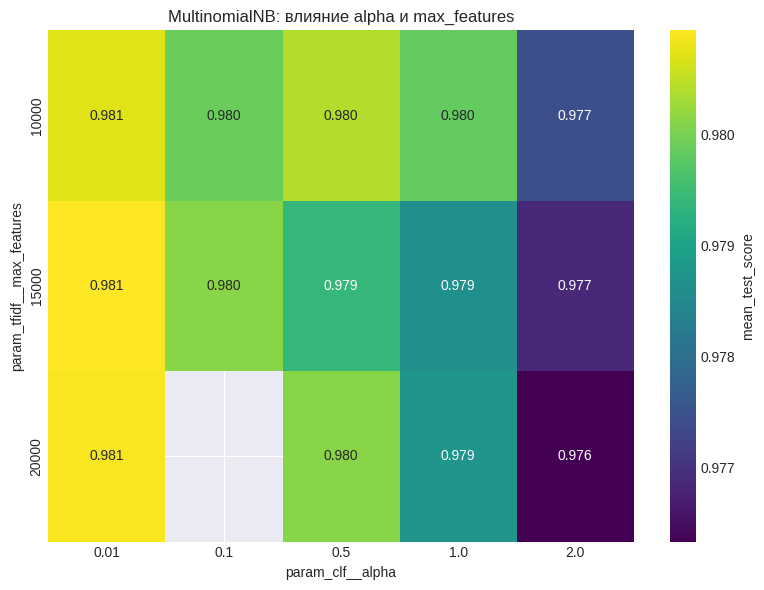

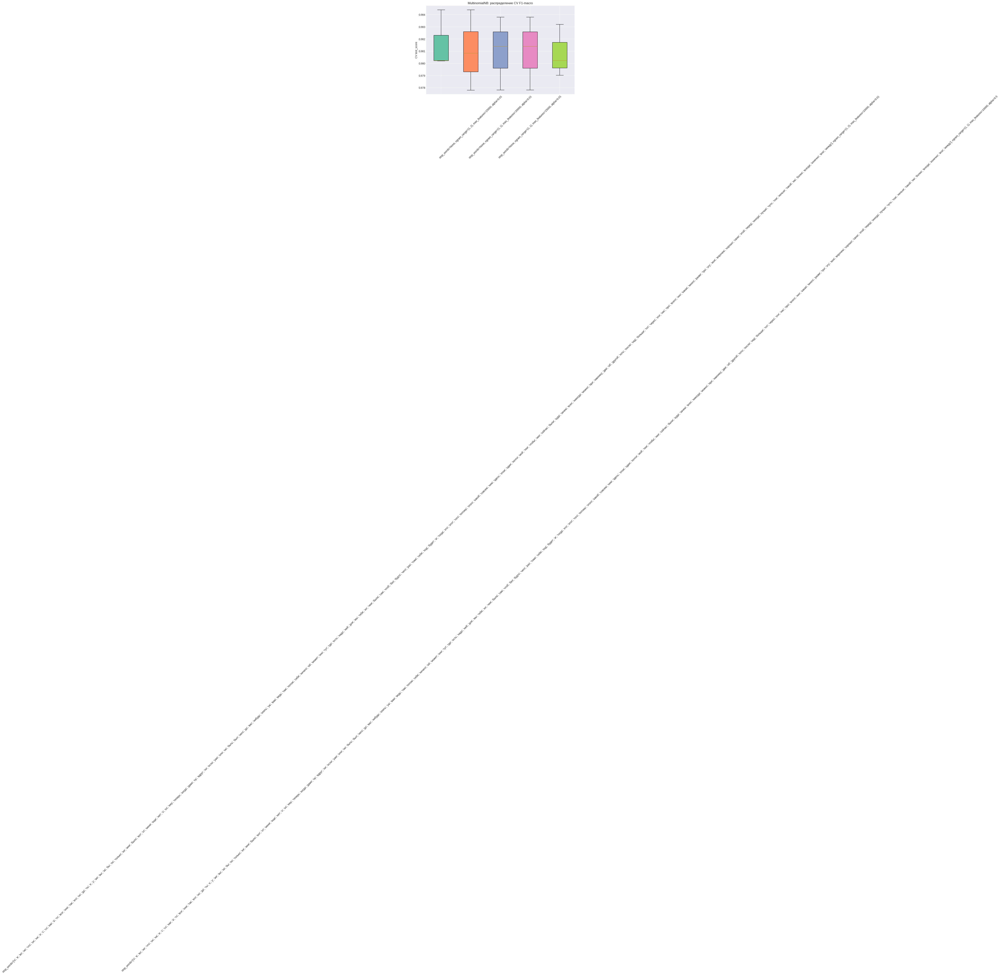

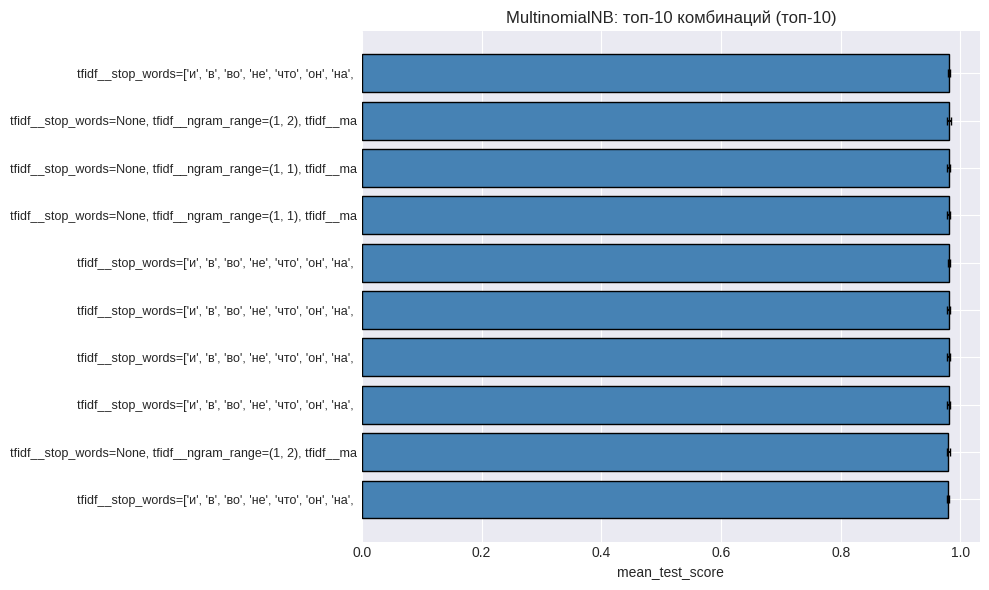

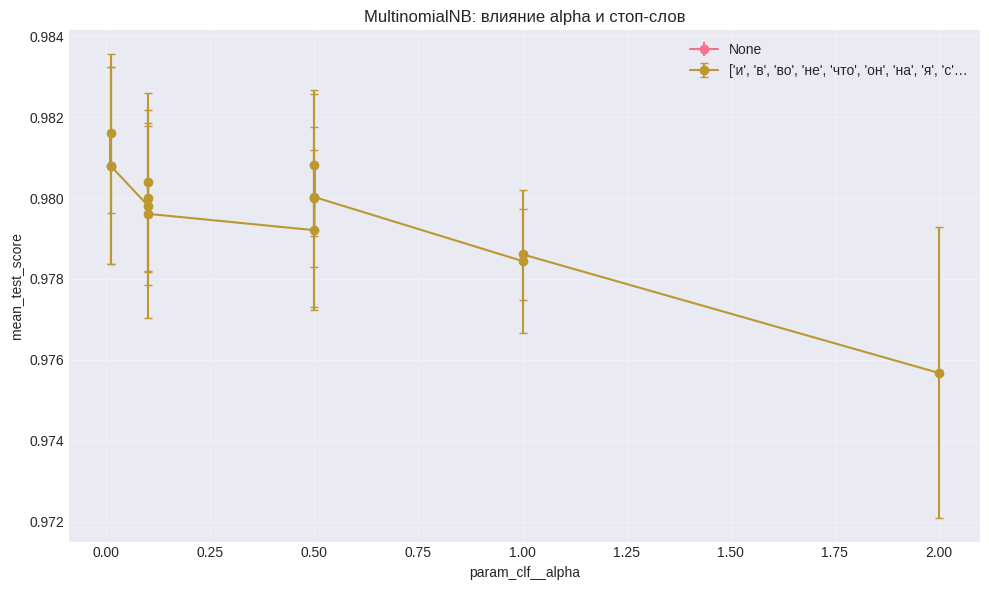

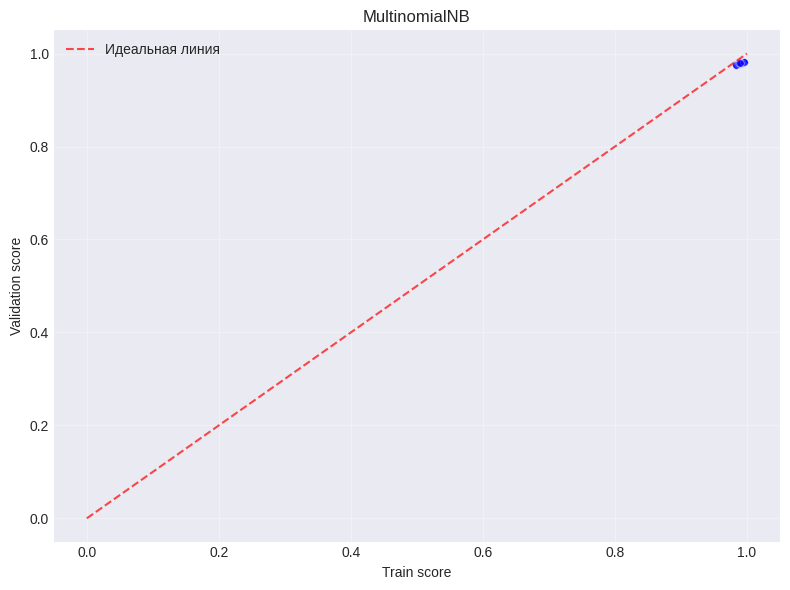

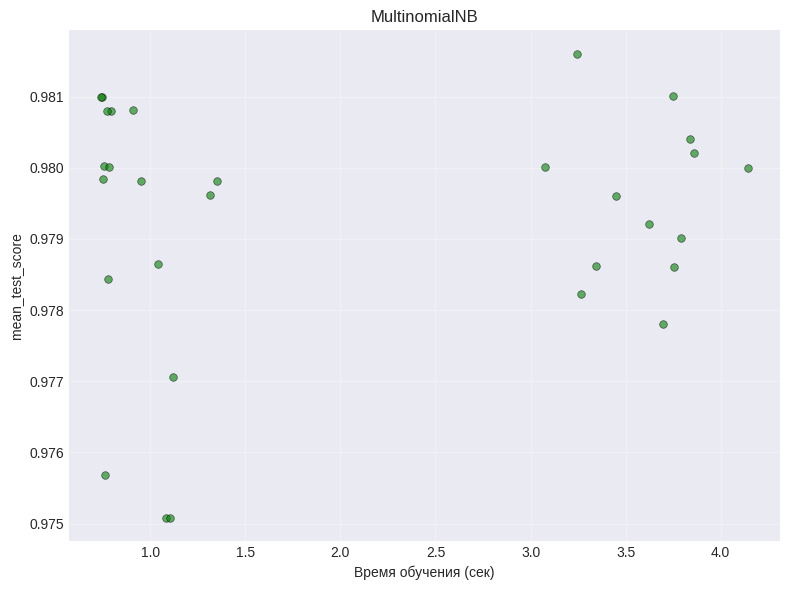


📈 Оценка на тестовой выборке...


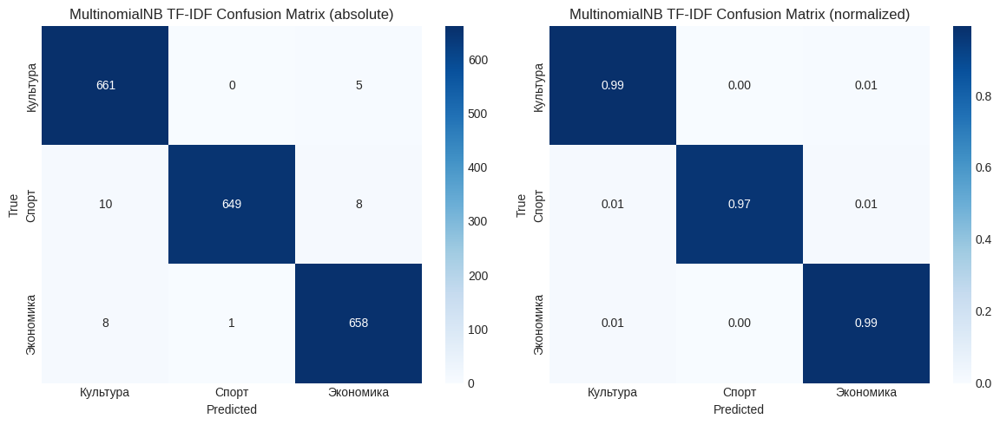

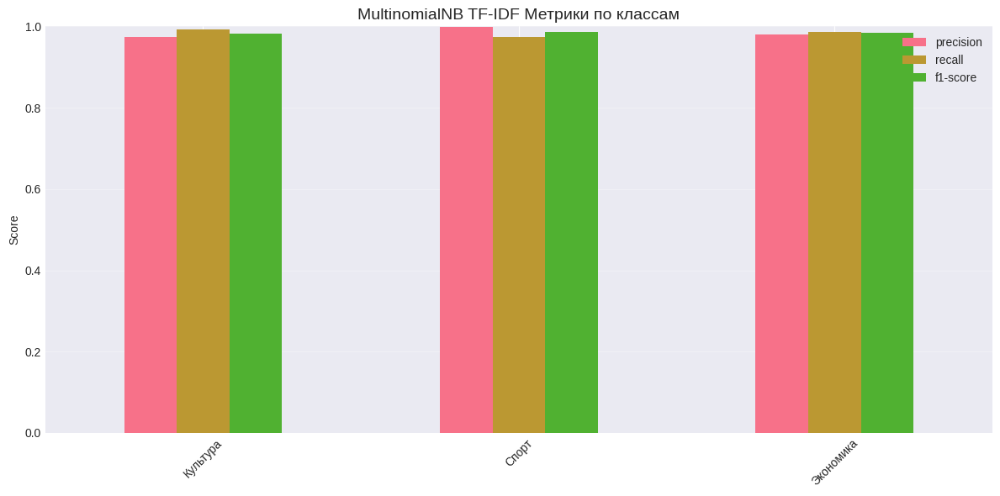

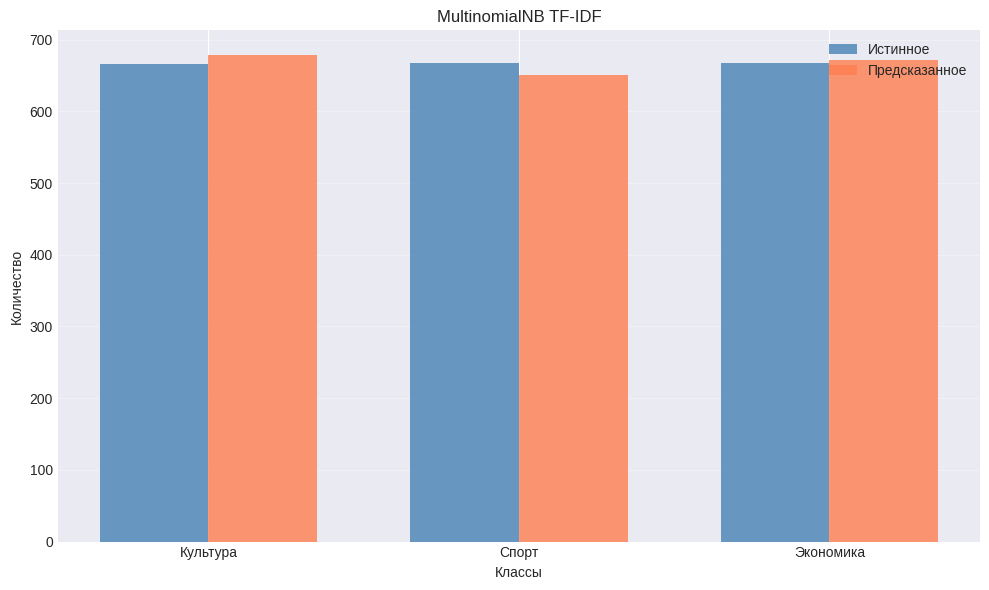


🔍 Важность признаков (для MultinomialNB не отображается)

📉 Кривая обучения...


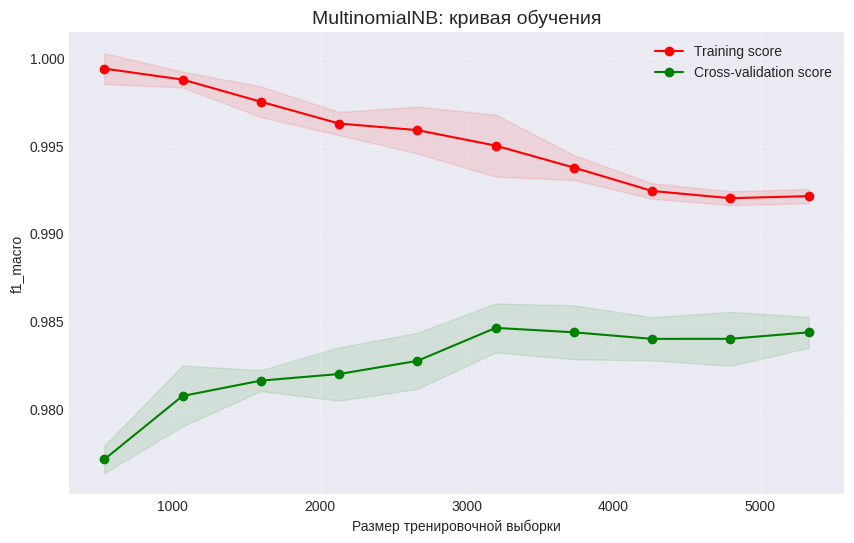

Train score (конец): 0.9921
Validation score (конец): 0.9844
Разница: 0.0077
✅  Модель хорошо обобщает

❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: эстрадный певец иосиф кобзон скончаться продолжительный болезнь оставить ребёнок внук наследство стоимость миллиард рубль сообщать артист частность принадлежать участок площадь два гектар подмосковный...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 1.000

2. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.999

3. Текст: строительство нулевой цикл здание второй сцена мариинский театр санкт петербург начаться май год заявить вица губернатор город александр вахмистр сообщать интерфакс ссылка пресс служба чиновник резуль...
   Истинный класс: Экономика, предсказанный: Культ

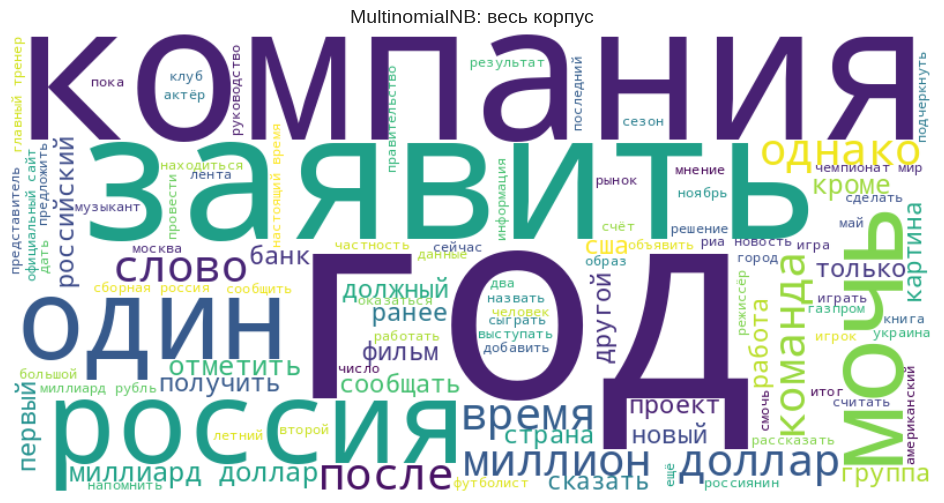

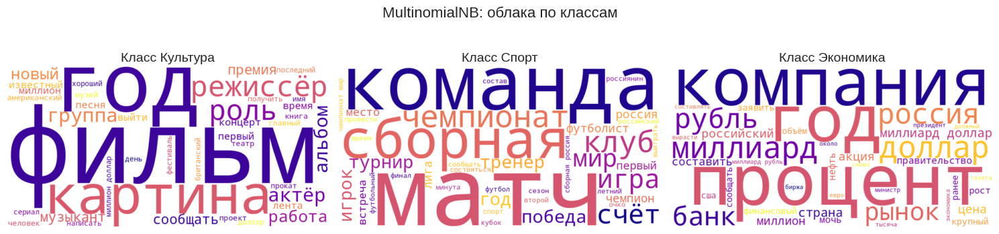


 Визуализация признакового пространства...


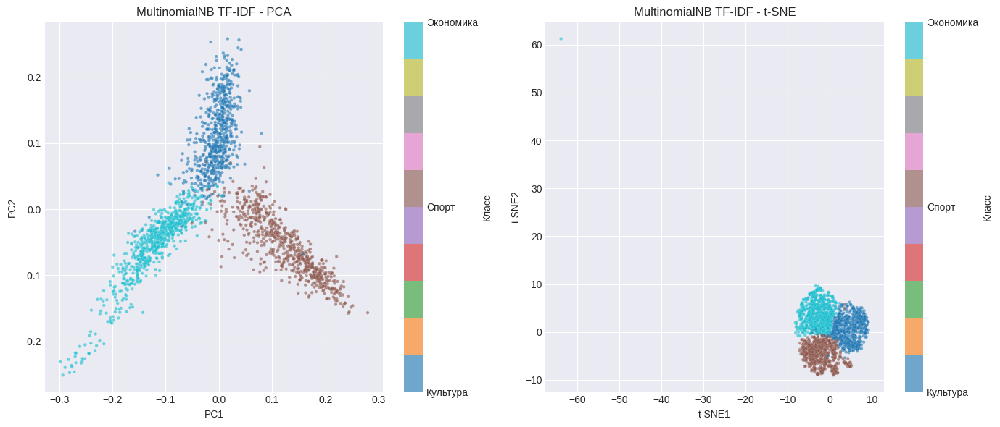


✅ Визуализация MultinomialNB завершена.


In [ ]:
# ============================================================
# 10. ВИЗУАЛИЗАЦИЯ MULTINOMIAL NAIVE BAYES (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ MultinomialNB + TF-IDF")
print("="*60)

# Извлекаем объекты из results_nb
best_model = results_nb['model']
gs = results_nb['gs']
y_pred = results_nb['y_pred']
y_pred_proba = results_nb['y_pred_proba']
feature_names = results_nb['feature_names']
classes = results_nb['classes']

# ------------------------------------------------------------
# 1. АНАЛИЗ GRIDSEARCH
# ------------------------------------------------------------
print("\n📊 Анализ GridSearchCV...")

# Тепловая карта для alpha и max_features (если оба числовые)
if 'param_clf__alpha' in gs.cv_results_ and 'param_tfidf__max_features' in gs.cv_results_:
    plot_gridsearch_heatmap(gs,
                            param_x='param_clf__alpha',
                            param_y='param_tfidf__max_features',
                            title='MultinomialNB: влияние alpha и max_features')

plot_gridsearch_boxplot(gs, top_n=5, metric='test_score',
                        title='MultinomialNB: распределение CV F1-macro')

plot_gridsearch_top_params_bar(gs, top_n=10,
                               title='MultinomialNB: топ-10 комбинаций')

# Влияние alpha (с группировкой по stop_words)
if 'param_tfidf__stop_words' in gs.cv_results_:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__alpha',
                                     param_hue='param_tfidf__stop_words',
                                     show_std=True,
                                     title='MultinomialNB: влияние alpha и стоп-слов')
else:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__alpha',
                                     show_std=True,
                                     title='MultinomialNB: влияние alpha')

plot_train_vs_validation_scatter(gs, title='MultinomialNB')
plot_performance_vs_time(gs, title='MultinomialNB')

# ------------------------------------------------------------
# 2. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

plot_confusion_matrices(y_test, y_pred, classes,
                        title='MultinomialNB TF-IDF')
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='MultinomialNB TF-IDF')
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='MultinomialNB TF-IDF')

if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='MultinomialNB TF-IDF')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (Naive Bayes не имеет coef_, пропускаем)
# ------------------------------------------------------------
print("\n🔍 Важность признаков (для MultinomialNB не отображается)")

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
print("\n📉 Кривая обучения...")
plot_learning_curve(best_model, X_train, y_train,
                    cv=3, scoring='f1_macro',
                    title='MultinomialNB: кривая обучения')

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")
plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ
# ------------------------------------------------------------
print("\n☁️ Облака слов...")
plot_wordcloud_general(X_train, max_words=100,
                       title='MultinomialNB: весь корпус')
plot_wordclouds_by_class(X_train, y_train,
                         best_model.named_steps['tfidf'],
                         max_words=40,
                         title='MultinomialNB: облака по классам')

# ------------------------------------------------------------
# 7. PCA / T-SNE
# ------------------------------------------------------------
print("\n Визуализация признакового пространства...")
X_vec = best_model.named_steps['tfidf'].transform(X_train)
plot_pca_tsne(X_vec, y_train, sample_size=2000,
              title='MultinomialNB TF-IDF')

print("\n✅ Визуализация MultinomialNB завершена.")
print("="*60)

5. ОБУЧЕНИЕ KNN (TF-IDF)

5.1. ОБУЧЕНИЕ И ОЦЕНКА KNN

In [ ]:
# ============================================================
# 11. ОБУЧЕНИЕ K-NEAREST NEIGHBORS (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("K-NEAREST NEIGHBORS + TF-IDF (ОПТИМИЗИРОВАННАЯ ВЕРСИЯ)")
print("="*60)

# ------------------------------------------------------------
# 1. Пайплайн с фиксированными параметрами TF-IDF
# ------------------------------------------------------------
knn_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(
        lowercase=False,
        ngram_range=(1, 1),               # только униграммы
        stop_words=russian_stop_words,     # фиксируем стоп-слова
        max_features=7000,                 # уменьшаем словарь
        min_df=5,                           # игнорируем редкие слова
        max_df=0.8,                          # игнорируем слишком частотные
        sublinear_tf=True
    )),
    ('clf', KNeighborsClassifier(n_jobs=-1))
])

# ------------------------------------------------------------
# 2. Подвыборка для быстрого поиска параметров
# ------------------------------------------------------------
print("\n Создаём подвыборку 5000 объектов для поиска...")
X_sample, _, y_sample, _ = train_test_split(
    X_train, y_train, train_size=5000, stratify=y_train, random_state=42
)

# ------------------------------------------------------------
# 3. Распределение параметров для RandomizedSearchCV
# ------------------------------------------------------------
param_dist = {
    'tfidf__max_features': [5000, 6000, 7000],
    'clf__n_neighbors': [3, 5, 7, 9, 11],
    'clf__weights': ['uniform', 'distance'],
    'clf__metric': ['cosine', 'euclidean']   # оставим две основные
}

# Количество итераций
n_iter_search = 15
total_combinations = np.prod([len(v) if isinstance(v, list) else 1 for v in param_dist.values()])
print(f"\n📊 Параметры RandomizedSearch:")
print(f"   • Размер пространства: ~{total_combinations} комбинаций")
print(f"   • Итераций: {n_iter_search}")
print(f"   • Кросс-валидация: 3 фолда")
print(f"   • Обучений на подвыборке: {n_iter_search * 3}")
print(f"   ⏱️  Ожидаемое время: ~30–60 секунд")

# ------------------------------------------------------------
# 4. Запуск RandomizedSearchCV на подвыборке
# ------------------------------------------------------------
rs_knn = RandomizedSearchCV(
    knn_pipeline,
    param_dist,
    n_iter=n_iter_search,
    scoring='f1_macro',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42,
    return_train_score=True
)

print("\n⏳ Поиск гиперпараметров KNN на подвыборке...")
start_time = time.time()
rs_knn.fit(X_sample, y_sample)
end_search = time.time()
print(f"✅ Поиск завершён за {(end_search - start_time):.1f} секунд")
print(f"🏆 Лучшие параметры (на подвыборке): {rs_knn.best_params_}")

# ------------------------------------------------------------
# 5. Финальное обучение на всех данных
# ------------------------------------------------------------
print("\n⏳ Обучение финальной модели на всех данных...")
best_params = rs_knn.best_params_
final_model = knn_pipeline.set_params(**best_params)
final_model.fit(X_train, y_train)
end_time = time.time()
print(f"✅ Финальное обучение завершено за {(end_time - end_search):.1f} секунд")
print(f"✅ Общее время: {(end_time - start_time):.1f} секунд")

# ------------------------------------------------------------
# 6. Оценка на тесте
# ------------------------------------------------------------
y_pred = final_model.predict(X_test)
y_pred_proba = final_model.predict_proba(X_test)

test_accuracy = accuracy_score(y_test, y_pred)
test_precision = precision_score(y_test, y_pred, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ KNN (ФИНАЛЬНАЯ МОДЕЛЬ)")
print("="*60)
print(f"🏆 Лучшие параметры:          {best_params}")
print(f"📈 Лучший CV F1 (macro):      {rs_knn.best_score_:.4f}")
print(f"🎯 Тестовый F1 (macro):       {test_f1:.4f}")
print(f"🎯 Тестовый Accuracy:         {test_accuracy:.4f}")
print(f"🎯 Precision (macro):         {test_precision:.4f}")
print(f"🎯 Recall (macro):            {test_recall:.4f}")

# ------------------------------------------------------------
# 7. Сохраняем результаты
# ------------------------------------------------------------
results_knn = {
    'name': 'KNN + TF-IDF (optimized)',
    'model': final_model,
    'gs': rs_knn,
    'y_pred': y_pred,
    'y_pred_proba': y_pred_proba,
    'feature_names': final_model.named_steps['tfidf'].get_feature_names_out(),
    'classes': final_model.named_steps['clf'].classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': rs_knn.best_score_,
    'best_params': best_params,
    'training_time': end_time - start_time
}

print("\n Результаты сохранены в словарь 'results_knn'")
joblib.dump(final_model, 'best_knn.pkl')
print("✅ Модель сохранена как 'best_knn.pkl'")
print("="*60)


K-NEAREST NEIGHBORS + TF-IDF (ОПТИМИЗИРОВАННАЯ ВЕРСИЯ)

 Создаём подвыборку 5000 объектов для поиска...

📊 Параметры RandomizedSearch:
   • Размер пространства: ~60 комбинаций
   • Итераций: 15
   • Кросс-валидация: 3 фолда
   • Обучений на подвыборке: 45
   ⏱️  Ожидаемое время: ~30–60 секунд

⏳ Поиск гиперпараметров KNN на подвыборке...
Fitting 3 folds for each of 15 candidates, totalling 45 fits
✅ Поиск завершён за 101.2 секунд
🏆 Лучшие параметры (на подвыборке): {'tfidf__max_features': 5000, 'clf__weights': 'uniform', 'clf__n_neighbors': 11, 'clf__metric': 'euclidean'}

⏳ Обучение финальной модели на всех данных...
✅ Финальное обучение завершено за 1.0 секунд
✅ Общее время: 102.3 секунд

РЕЗУЛЬТАТЫ KNN (ФИНАЛЬНАЯ МОДЕЛЬ)
🏆 Лучшие параметры:          {'tfidf__max_features': 5000, 'clf__weights': 'uniform', 'clf__n_neighbors': 11, 'clf__metric': 'euclidean'}
📈 Лучший CV F1 (macro):      0.9816
🎯 Тестовый F1 (macro):       0.9800
🎯 Тестовый Accuracy:         0.9800
🎯 Precision (macro)

5.2. ВИЗУАЛИЗАЦИЯ KNN


ВИЗУАЛИЗАЦИЯ KNN + TF-IDF

📊 Анализ GridSearchCV...


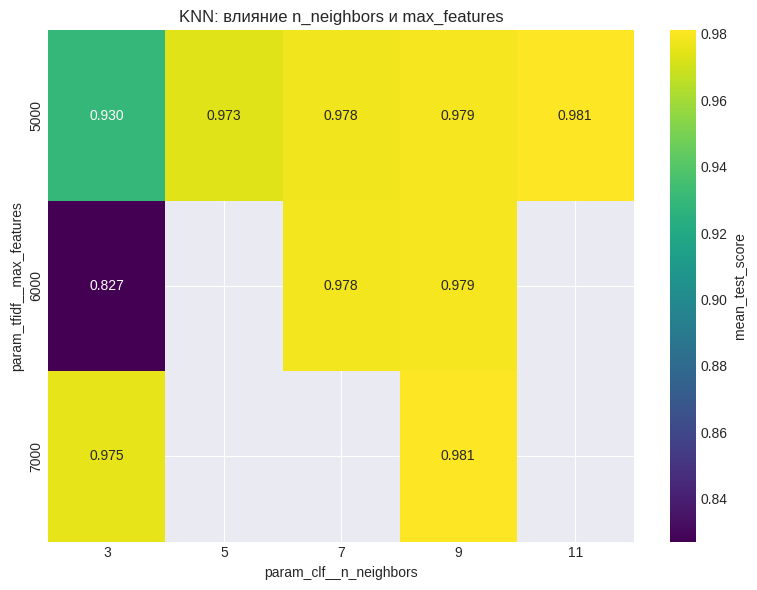

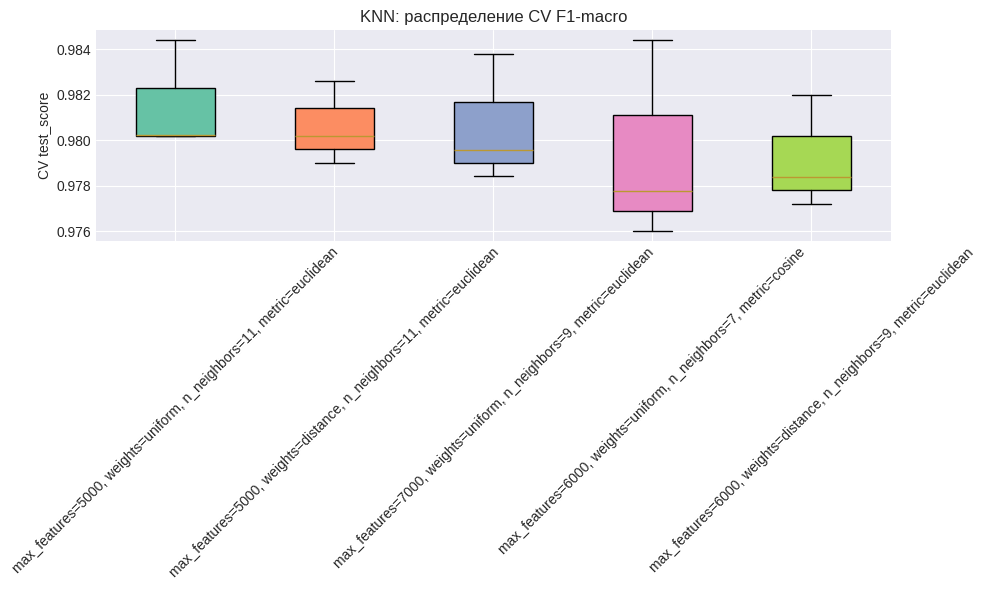

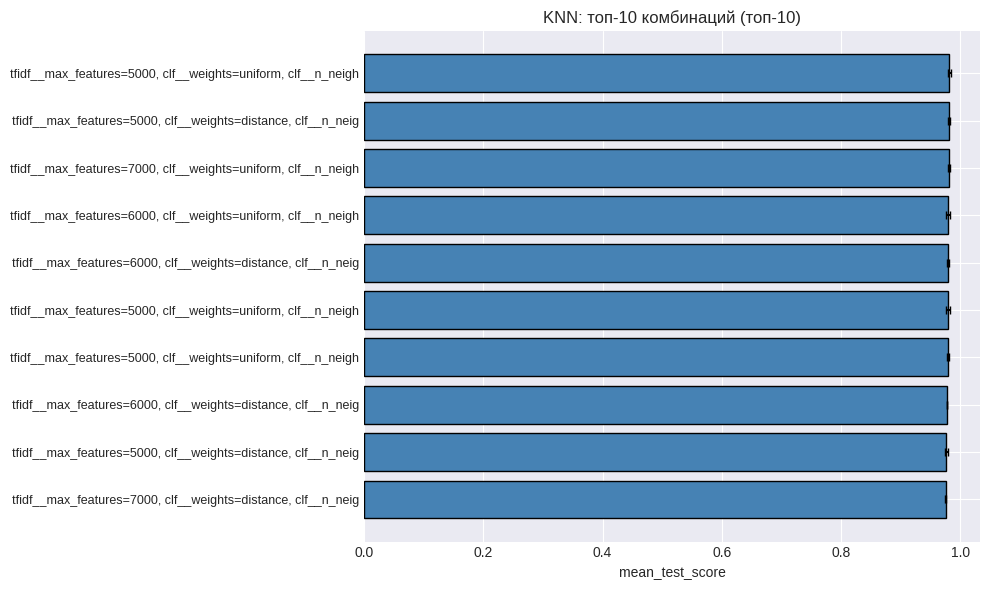

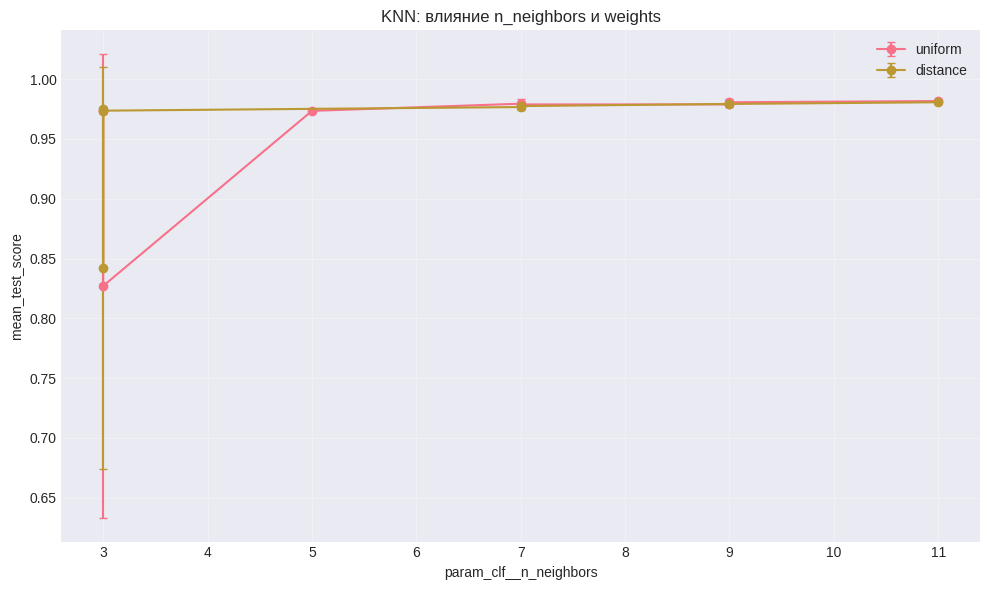

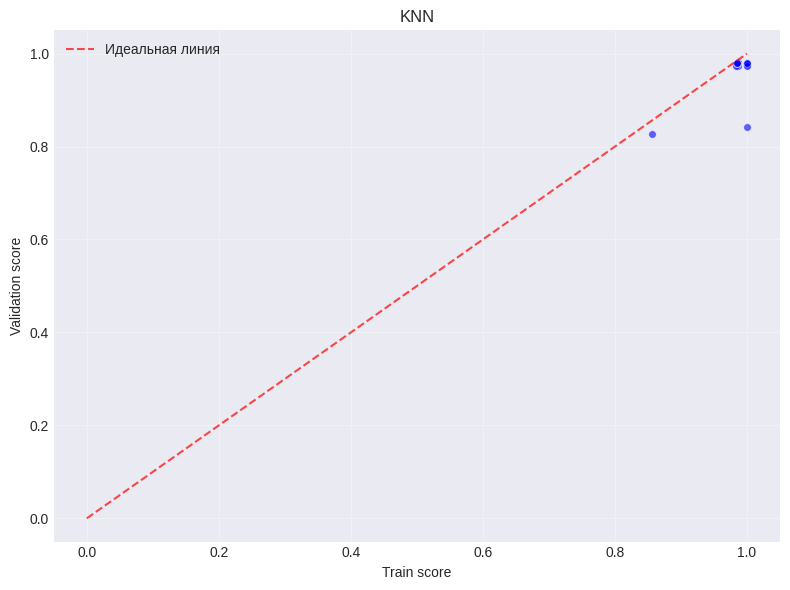

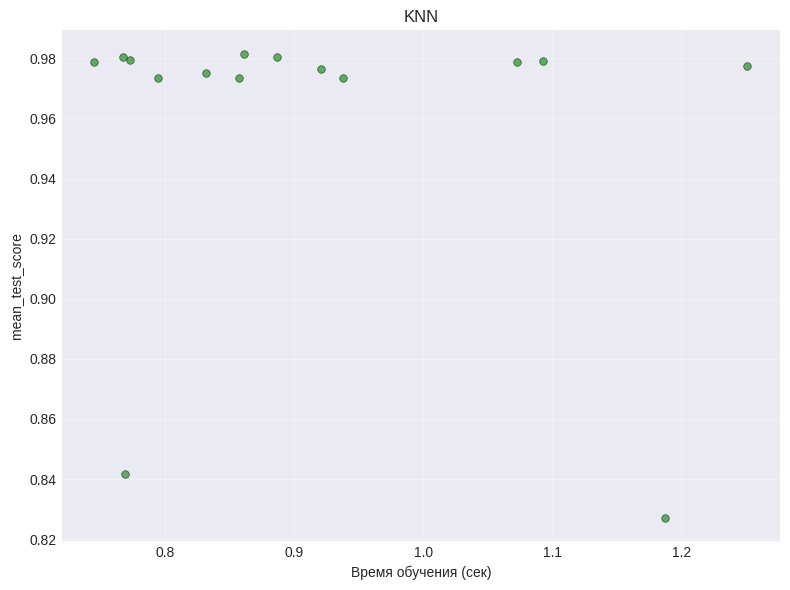


📈 Оценка на тестовой выборке...


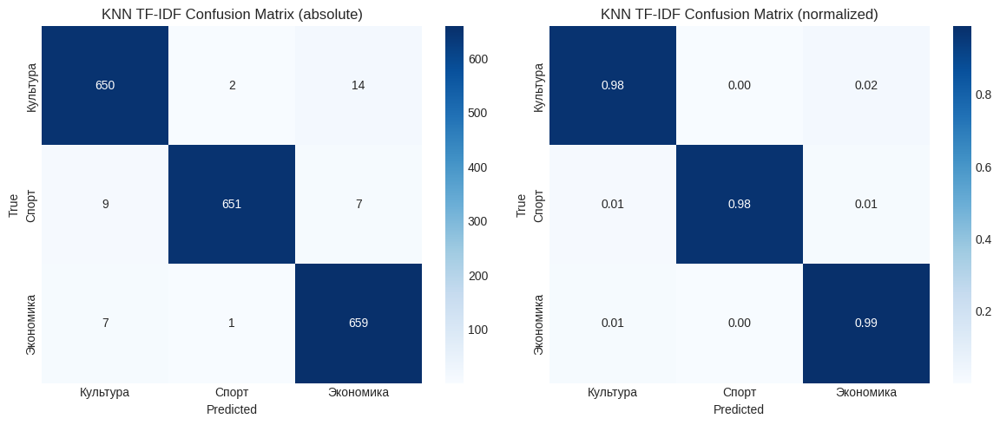

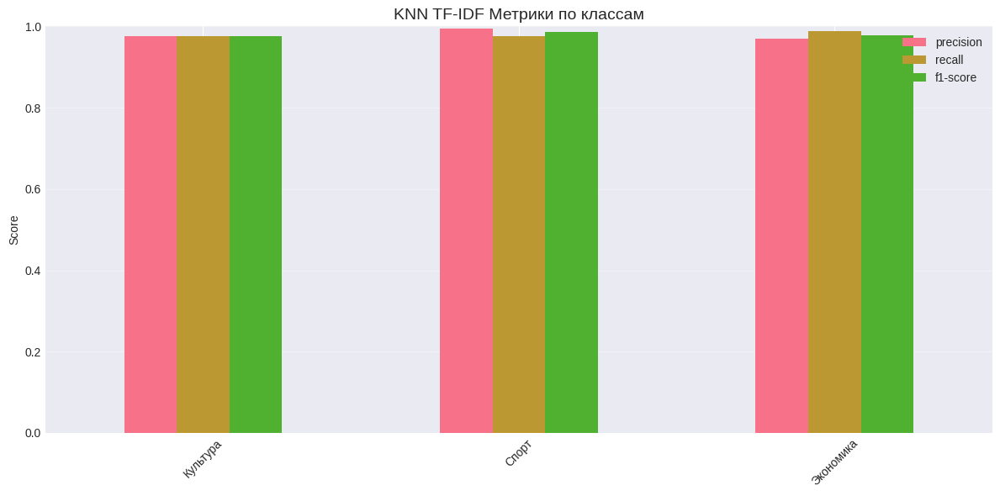

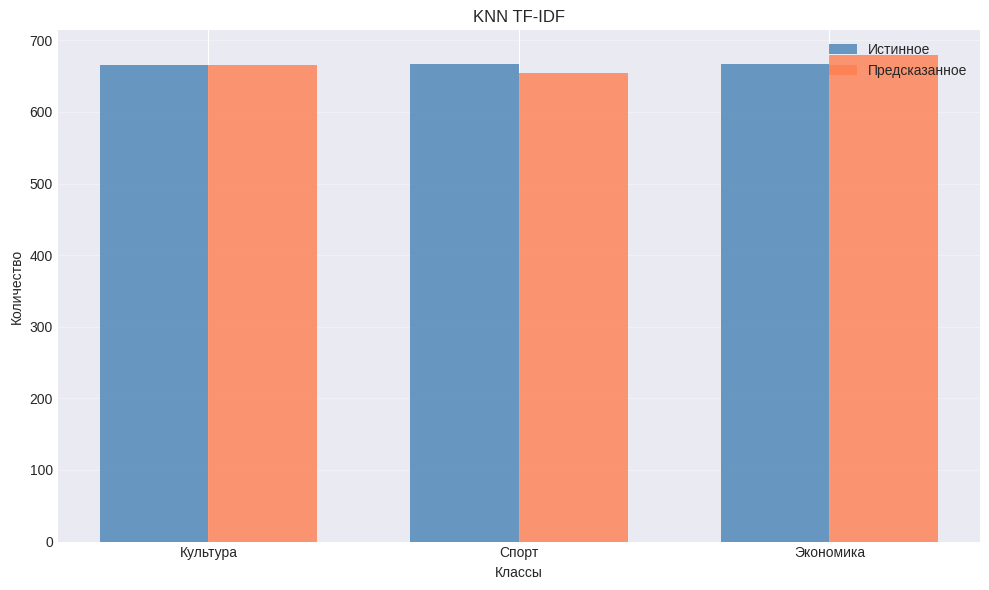


🔍 Важность признаков (для KNN недоступна)

📉 Кривая обучения...


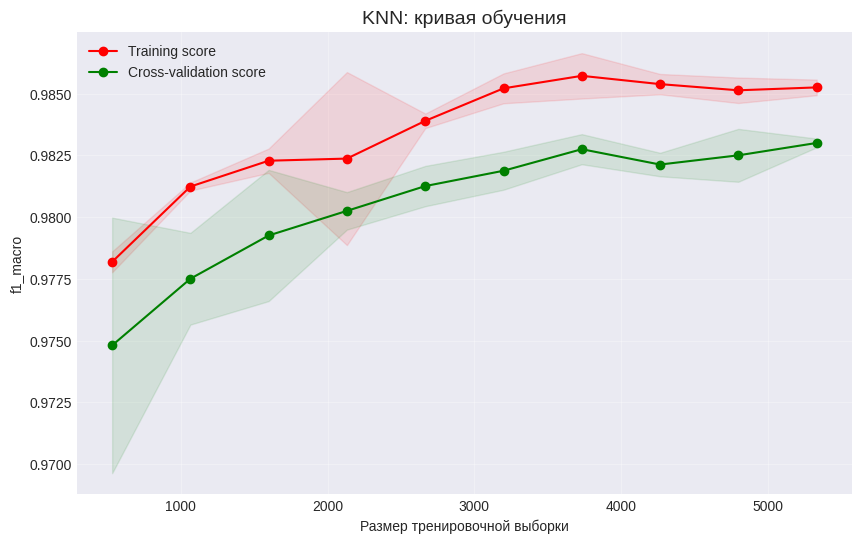

Train score (конец): 0.9853
Validation score (конец): 0.9830
Разница: 0.0023
✅  Модель хорошо обобщает

❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.909

2. Текст: американский актёр кифер сазерленд исполнять главный роль сериал жертва мошенничество сообщать финансовый потеря составить тысяча доллар год финансовый советник кифер сазерленд обратиться некто майкл ...
   Истинный класс: Культура, предсказанный: Экономика
   Уверенность: 0.909

3. Текст: российский государственный цирковой компания росгосцирк подать иск арбитражный суд москва взыскание долг уволиться дрессировщик сергей нестеров мстислав запашный сообщать интерфакс общий сумма долг ор...
   Истинный класс: Культура, предсказанный: Эконом

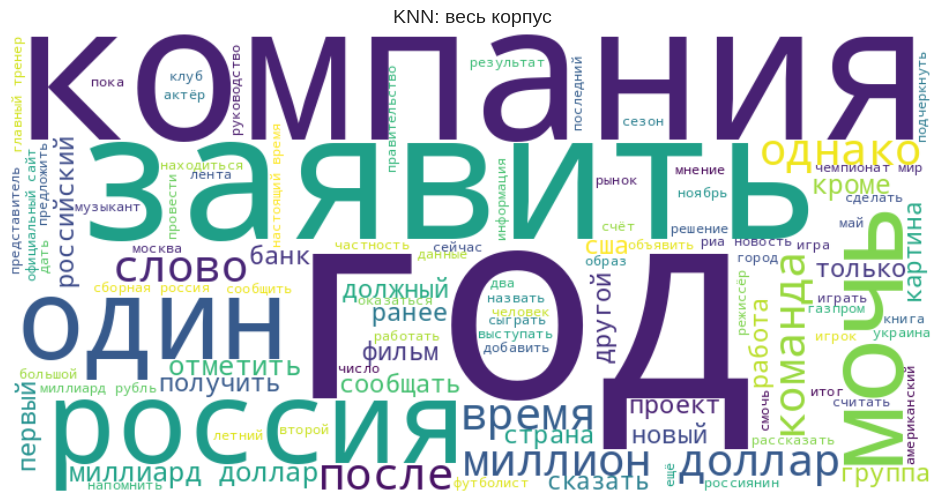

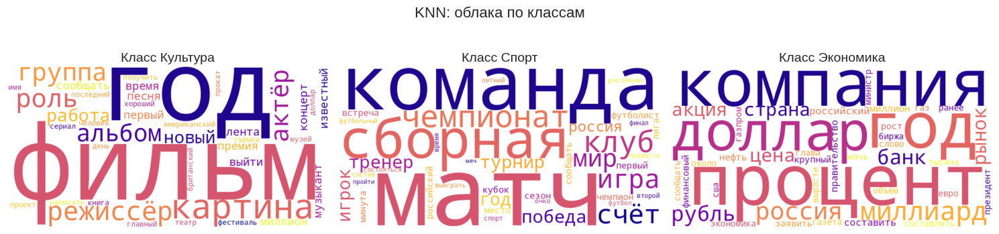


 Визуализация признакового пространства...


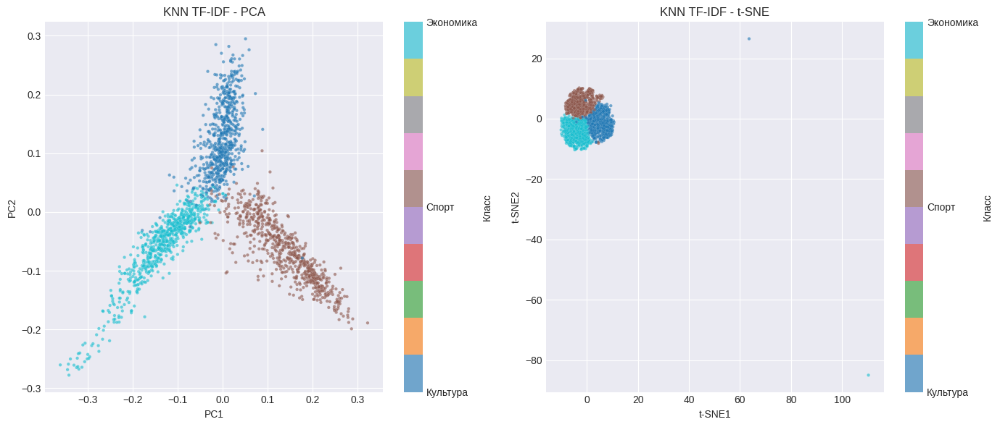


✅ Визуализация KNN завершена.


In [ ]:
# ============================================================
# 12. ВИЗУАЛИЗАЦИЯ KNN (TF-IDF)
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ KNN + TF-IDF")
print("="*60)

# Извлекаем объекты из results_knn
best_model = results_knn['model']
gs = results_knn['gs']
y_pred = results_knn['y_pred']
y_pred_proba = results_knn['y_pred_proba']
feature_names = results_knn['feature_names']
classes = results_knn['classes']

# ------------------------------------------------------------
# 1. АНАЛИЗ GRIDSEARCH
# ------------------------------------------------------------
print("\n📊 Анализ GridSearchCV...")

# Тепловая карта для n_neighbors и max_features (если доступны)
if 'param_clf__n_neighbors' in gs.cv_results_ and 'param_tfidf__max_features' in gs.cv_results_:
    plot_gridsearch_heatmap(gs,
                            param_x='param_clf__n_neighbors',
                            param_y='param_tfidf__max_features',
                            title='KNN: влияние n_neighbors и max_features')

plot_gridsearch_boxplot(gs, top_n=5, metric='test_score',
                        title='KNN: распределение CV F1-macro')

plot_gridsearch_top_params_bar(gs, top_n=10,
                               title='KNN: топ-10 комбинаций')

# Влияние n_neighbors (с группировкой по weights)
if 'param_clf__weights' in gs.cv_results_:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__n_neighbors',
                                     param_hue='param_clf__weights',
                                     show_std=True,
                                     title='KNN: влияние n_neighbors и weights')
else:
    plot_gridsearch_parameter_impact(gs,
                                     param_x='param_clf__n_neighbors',
                                     show_std=True,
                                     title='KNN: влияние n_neighbors')

plot_train_vs_validation_scatter(gs, title='KNN')
plot_performance_vs_time(gs, title='KNN')

# ------------------------------------------------------------
# 2. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

plot_confusion_matrices(y_test, y_pred, classes,
                        title='KNN TF-IDF')
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='KNN TF-IDF')
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='KNN TF-IDF')

if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='KNN TF-IDF')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (KNN не имеет, пропускаем)
# ------------------------------------------------------------
print("\n🔍 Важность признаков (для KNN недоступна)")

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
print("\n📉 Кривая обучения...")
plot_learning_curve(best_model, X_train, y_train,
                    cv=3, scoring='f1_macro',
                    title='KNN: кривая обучения')

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")
plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ
# ------------------------------------------------------------
print("\n☁️ Облака слов...")
plot_wordcloud_general(X_train, max_words=100,
                       title='KNN: весь корпус')
plot_wordclouds_by_class(X_train, y_train,
                         best_model.named_steps['tfidf'],
                         max_words=40,
                         title='KNN: облака по классам')

# ------------------------------------------------------------
# 7. PCA / T-SNE
# ------------------------------------------------------------
print("\n Визуализация признакового пространства...")
X_vec = best_model.named_steps['tfidf'].transform(X_train)
plot_pca_tsne(X_vec, y_train, sample_size=2000,
              title='KNN TF-IDF')

print("\n✅ Визуализация KNN завершена.")
print("="*60)

6. ФИНАЛЬНОЕ СРАВНЕНИЕ МОДЕЛЕЙ


📊 ФИНАЛЬНОЕ СРАВНЕНИЕ МОДЕЛЕЙ

📋 СВОДНАЯ ТАБЛИЦА МЕТРИК
----------------------------------------------------------------------------------------------------
                                 Модель Test F1 (macro) Test Precision (macro) Test Recall (macro) Test Accuracy CV F1 (macro) Train-Val Разрыв Время обучения (мин)
LogisticRegression + TF-IDF (optimized)          0.9875                 0.9875              0.9875        0.9875        0.9862           0.0136                 0.77
               SVM + TF-IDF (lightning)          0.9860                 0.9861              0.9860        0.9860        0.9857              nan                 1.56
                 MultinomialNB + TF-IDF          0.9840                 0.9842              0.9840        0.9840        0.9816           0.0118                 2.97
                  RandomForest + TF-IDF          0.9835                 0.9836              0.9835        0.9835        0.9799           0.0128                 2.90
               KN

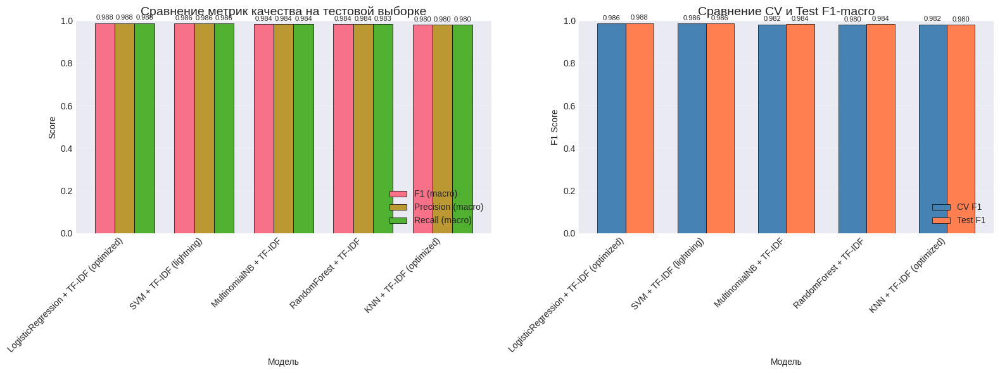

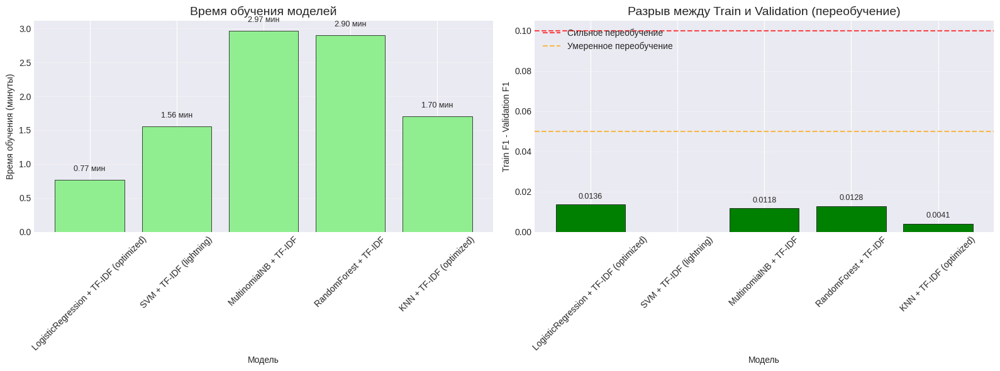

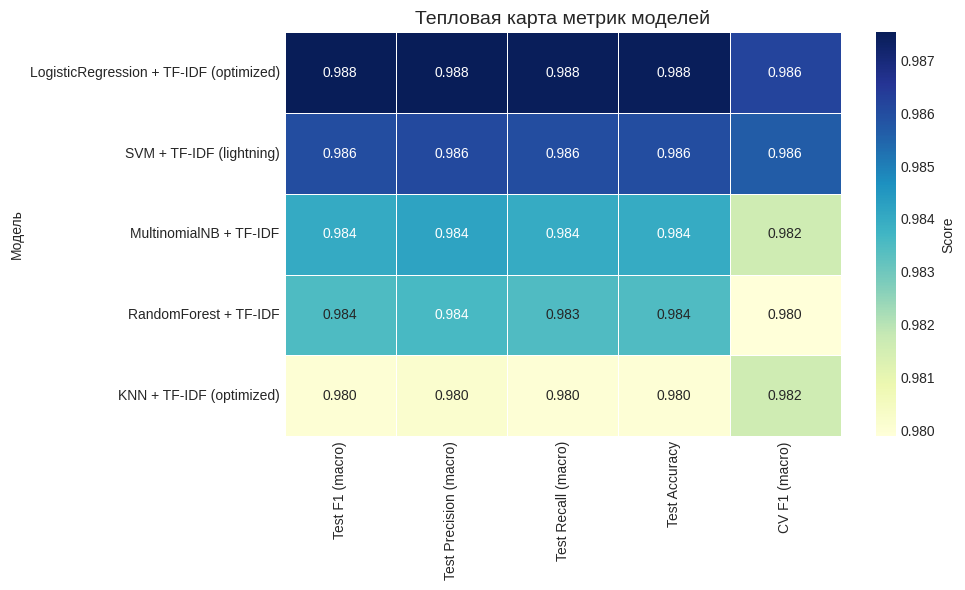


🏆 ЛУЧШАЯ МОДЕЛЬ ПО ИТОГАМ ЭКСПЕРИМЕНТА
   Модель: LogisticRegression + TF-IDF (optimized)
   Test F1-macro: 0.9875038877179271
   Test Accuracy: 0.9875
   Время обучения: 0.7664021333058675 мин
\ Сводная таблица сохранена как 'models_comparison.csv'
✅ Финальное сравнение завершено!


In [ ]:
# ============================================================
# 13. ФИНАЛЬНОЕ СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ
# ============================================================

print("\n" + "="*60)
print("📊 ФИНАЛЬНОЕ СРАВНЕНИЕ МОДЕЛЕЙ")
print("="*60)

# ------------------------------------------------------------
# 1. Собираем все результаты в единый список
# ------------------------------------------------------------
all_results = [
    results_lr,
    results_svm,
    results_rf,
    results_nb,
    results_knn
]

# ------------------------------------------------------------
# 2. Создаём сводный DataFrame
# ------------------------------------------------------------

comparison_data = []
for res in all_results:
    # Безопасно извлекаем разницу train/validation, если доступно
    if ('gs' in res and res['gs'] is not None
        and hasattr(res['gs'], 'cv_results_')
        and 'mean_train_score' in res['gs'].cv_results_
        and 'mean_test_score' in res['gs'].cv_results_):
        gs = res['gs']
        best_idx = gs.best_index_
        train_score = gs.cv_results_['mean_train_score'][best_idx]
        val_score = gs.cv_results_['mean_test_score'][best_idx]
        overfit_gap = train_score - val_score
    else:
        overfit_gap = np.nan

    comparison_data.append({
        'Модель': res['name'],
        'Test F1 (macro)': res['test_f1'],
        'Test Precision (macro)': res['test_precision'],
        'Test Recall (macro)': res['test_recall'],
        'Test Accuracy': res['test_accuracy'],
        'CV F1 (macro)': res['cv_score'],
        'Train-Val Разрыв': overfit_gap,
        'Время обучения (мин)': res['training_time'] / 60
    })

df_comparison = pd.DataFrame(comparison_data)
df_comparison = df_comparison.sort_values('Test F1 (macro)', ascending=False).reset_index(drop=True)

# ------------------------------------------------------------
# 3. Выводим таблицу с форматированием
# ------------------------------------------------------------
print("\n📋 СВОДНАЯ ТАБЛИЦА МЕТРИК")
print("-" * 100)

# Форматируем числовые колонки
display_cols = ['Модель', 'Test F1 (macro)', 'Test Precision (macro)',
                'Test Recall (macro)', 'Test Accuracy', 'CV F1 (macro)',
                'Train-Val Разрыв', 'Время обучения (мин)']

df_display = df_comparison[display_cols].copy()
for col in df_display.columns[1:]:
    if col == 'Время обучения (мин)':
        df_display[col] = df_display[col].apply(lambda x: f'{x:.2f}')
    else:
        df_display[col] = df_display[col].apply(lambda x: f'{x:.4f}')

print(df_display.to_string(index=False))
print("-" * 100)

# ------------------------------------------------------------
# 4. Визуализация 1: Сравнение F1, Precision, Recall
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# График 1: F1, Precision, Recall для каждой модели
metrics = ['Test F1 (macro)', 'Test Precision (macro)', 'Test Recall (macro)']
x = np.arange(len(df_comparison))
width = 0.25

for i, metric in enumerate(metrics):
    values = df_comparison[metric].values
    axes[0].bar(x + (i - 1) * width, values, width, label=metric.replace('Test ', ''),
                edgecolor='black', linewidth=0.5)

axes[0].set_xlabel('Модель')
axes[0].set_ylabel('Score')
axes[0].set_title('Сравнение метрик качества на тестовой выборке', fontsize=14)
axes[0].set_xticks(x)
axes[0].set_xticklabels(df_comparison['Модель'], rotation=45, ha='right')
axes[0].legend(loc='lower right')
axes[0].set_ylim(0, 1)
axes[0].grid(axis='y', alpha=0.3)

# Добавляем значения на столбцы
for i, metric in enumerate(metrics):
    for j, v in enumerate(df_comparison[metric].values):
        axes[0].text(j + (i - 1) * width, v + 0.01, f'{v:.3f}',
                     ha='center', va='bottom', fontsize=8)

# График 2: Сравнение CV F1 и Test F1
ax2 = axes[1]
x2 = np.arange(len(df_comparison))
width2 = 0.35

ax2.bar(x2 - width2/2, df_comparison['CV F1 (macro)'].values, width2,
        label='CV F1', color='steelblue', edgecolor='black', linewidth=0.5)
ax2.bar(x2 + width2/2, df_comparison['Test F1 (macro)'].values, width2,
        label='Test F1', color='coral', edgecolor='black', linewidth=0.5)

ax2.set_xlabel('Модель')
ax2.set_ylabel('F1 Score')
ax2.set_title('Сравнение CV и Test F1-macro', fontsize=14)
ax2.set_xticks(x2)
ax2.set_xticklabels(df_comparison['Модель'], rotation=45, ha='right')
ax2.legend(loc='lower right')
ax2.set_ylim(0, 1)
ax2.grid(axis='y', alpha=0.3)

# Добавляем значения
for i, v in enumerate(df_comparison['CV F1 (macro)'].values):
    ax2.text(i - width2/2, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)
for i, v in enumerate(df_comparison['Test F1 (macro)'].values):
    ax2.text(i + width2/2, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. Визуализация 2: Время обучения и разрыв train-val
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# График 3: Время обучения
ax3 = axes[0]
times = df_comparison['Время обучения (мин)'].values
bars3 = ax3.bar(df_comparison['Модель'], times, color='lightgreen',
                edgecolor='black', linewidth=0.5)
ax3.set_xlabel('Модель')
ax3.set_ylabel('Время обучения (минуты)')
ax3.set_title('Время обучения моделей', fontsize=14)
ax3.tick_params(axis='x', rotation=45)
ax3.grid(axis='y', alpha=0.3)

# Добавляем значения
for bar, v in zip(bars3, times):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
             f'{v:.2f} мин', ha='center', va='bottom', fontsize=9)

# График 4: Разрыв между Train и Validation (переобучение)
ax4 = axes[1]
gaps = df_comparison['Train-Val Разрыв'].values
colors = ['red' if g > 0.1 else 'orange' if g > 0.05 else 'green' for g in gaps]
bars4 = ax4.bar(df_comparison['Модель'], gaps, color=colors, edgecolor='black', linewidth=0.5)
ax4.set_xlabel('Модель')
ax4.set_ylabel('Train F1 - Validation F1')
ax4.set_title('Разрыв между Train и Validation (переобучение)', fontsize=14)
ax4.tick_params(axis='x', rotation=45)
ax4.axhline(y=0.1, color='red', linestyle='--', alpha=0.7, label='Сильное переобучение')
ax4.axhline(y=0.05, color='orange', linestyle='--', alpha=0.7, label='Умеренное переобучение')
ax4.legend(loc='upper left')
ax4.grid(axis='y', alpha=0.3)

# Добавляем значения
for bar, v in zip(bars4, gaps):
    ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
             f'{v:.4f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Визуализация 3: Тепловая карта метрик
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))
metric_cols = ['Test F1 (macro)', 'Test Precision (macro)',
               'Test Recall (macro)', 'Test Accuracy', 'CV F1 (macro)']
heatmap_data = df_comparison.set_index('Модель')[metric_cols].astype(float)

sns.heatmap(heatmap_data, annot=True, fmt='.3f', cmap='YlGnBu',
            cbar_kws={'label': 'Score'}, linewidths=0.5, linecolor='white')
plt.title('Тепловая карта метрик моделей', fontsize=14)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Вывод лучшей модели
# ------------------------------------------------------------
best_model_row = df_comparison.loc[df_comparison['Test F1 (macro)'].idxmax()]
best_model_name = best_model_row['Модель']
best_f1 = best_model_row['Test F1 (macro)']

print("\n" + "="*60)
print("🏆 ЛУЧШАЯ МОДЕЛЬ ПО ИТОГАМ ЭКСПЕРИМЕНТА")
print("="*60)
print(f"   Модель: {best_model_name}")
print(f"   Test F1-macro: {best_f1}")
print(f"   Test Accuracy: {best_model_row['Test Accuracy']}")
print(f"   Время обучения: {best_model_row['Время обучения (мин)']} мин")
print("="*60)

# ------------------------------------------------------------
# 8. Сохраняем сводную таблицу в CSV
# ------------------------------------------------------------
df_comparison.to_csv('models_comparison.csv', index=False, encoding='utf-8-sig')
print("\ Сводная таблица сохранена как 'models_comparison.csv'")
print("✅ Финальное сравнение завершено!")
print("="*60)

ГЛУБОКОЕ ОБУЧЕНИЕ. SentenceTransformers

In [ ]:
# ============================================================
# 14. ОБУЧЕНИЕ SentenceTransformers + Logistic Regression
# ============================================================

print("\n" + "="*60)
print("SENTENCE TRANSFORMERS + LOGISTIC REGRESSION")
print("="*60)

# Загрузка модели (лёгкая многоязычная)
model_name = 'distiluse-base-multilingual-cased'
print(f"\n⏳ Загрузка модели {model_name}...")
start_load = time.time()
transformer = SentenceTransformer(model_name)
print(f"✅ Модель загружена за {(time.time()-start_load)/60:.2f} мин")

# Преобразование текстов в эмбеддинги
print("\n⏳ Преобразование текстов в эмбеддинги...")
start_emb = time.time()
X_train_emb = transformer.encode(X_train.tolist(), show_progress_bar=True, batch_size=32)
X_test_emb = transformer.encode(X_test.tolist(), show_progress_bar=True, batch_size=32)
print(f"✅ Преобразование завершено за {(time.time()-start_emb)/60:.2f} мин")
print(f"   Форма X_train: {X_train_emb.shape}, X_test: {X_test_emb.shape}")

# Обучение логистической регрессии
print("\n⏳ Обучение классификатора...")
clf = LogisticRegression(max_iter=1000, class_weight='balanced', n_jobs=-1, random_state=42, C=1.0)
clf.fit(X_train_emb, y_train)
print("✅ Классификатор обучен")

# Оценка
y_pred = clf.predict(X_test_emb)
y_pred_proba = clf.predict_proba(X_test_emb)

test_f1 = f1_score(y_test, y_pred, average='macro')
test_accuracy = accuracy_score(y_test, y_pred)
test_precision = precision_score(y_test, y_pred, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred, average='macro', zero_division=0)
cv_f1 = cross_val_score(clf, X_train_emb, y_train, cv=3, scoring='f1_macro', n_jobs=-1).mean()

print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ SENTENCE TRANSFORMERS + LR")
print("="*60)
print(f"🏆 Модель:                {model_name}")
print(f"📈 CV F1 (macro):         {cv_f1:.4f}")
print(f"🎯 Тестовый F1 (macro):   {test_f1:.4f}")
print(f"🎯 Тестовый Accuracy:     {test_accuracy:.4f}")
print(f"🎯 Precision (macro):     {test_precision:.4f}")
print(f"🎯 Recall (macro):        {test_recall:.4f}")

# Сохраняем результаты в том же формате, что и другие модели
results_st = {
    'name': f'SentenceTransformers + LR ({model_name})',
    'model': clf,
    'embedding_model': model_name,
    'y_pred': y_pred,
    'y_pred_proba': y_pred_proba,
    'feature_names': [f'dim_{i}' for i in range(X_train_emb.shape[1])],
    'classes': clf.classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': cv_f1,
    'best_params': {'C': 1.0, 'model': model_name},
    'training_time': time.time() - start_load,
    'X_train_emb': X_train_emb,
    'X_test_emb': X_test_emb,
}

print("\n💾 Результаты сохранены в словарь 'results_st'")
joblib.dump(clf, 'sentence_transformer_lr.pkl')
print("✅ Модель сохранена как 'sentence_transformer_lr.pkl'")
print("="*60)


SENTENCE TRANSFORMERS + LOGISTIC REGRESSION

⏳ Загрузка модели distiluse-base-multilingual-cased...


modules.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/539M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/100 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

✅ Модель загружена за 0.22 мин

⏳ Преобразование текстов в эмбеддинги...


Batches:   0%|          | 0/250 [00:00<?, ?it/s]

Batches:   0%|          | 0/63 [00:00<?, ?it/s]

✅ Преобразование завершено за 31.32 мин
   Форма X_train: (7999, 512), X_test: (2000, 512)

⏳ Обучение классификатора...
✅ Классификатор обучен

РЕЗУЛЬТАТЫ SENTENCE TRANSFORMERS + LR
🏆 Модель:                distiluse-base-multilingual-cased
📈 CV F1 (macro):         0.9814
🎯 Тестовый F1 (macro):   0.9820
🎯 Тестовый Accuracy:     0.9820
🎯 Precision (macro):     0.9822
🎯 Recall (macro):        0.9820

💾 Результаты сохранены в словарь 'results_st'
✅ Модель сохранена как 'sentence_transformer_lr.pkl'


ВИЗУАЛИЗАЦИЯ SentenceTransformers


ВИЗУАЛИЗАЦИЯ SentenceTransformers + LR

📈 Оценка на тестовой выборке...


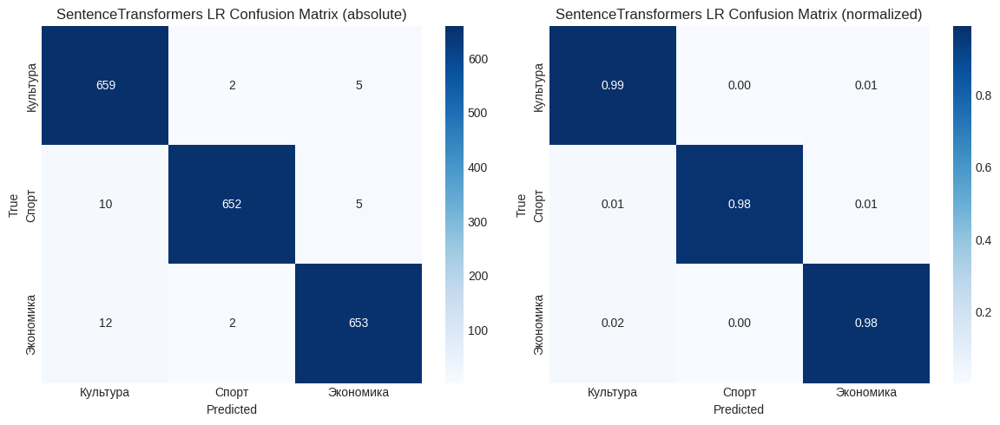

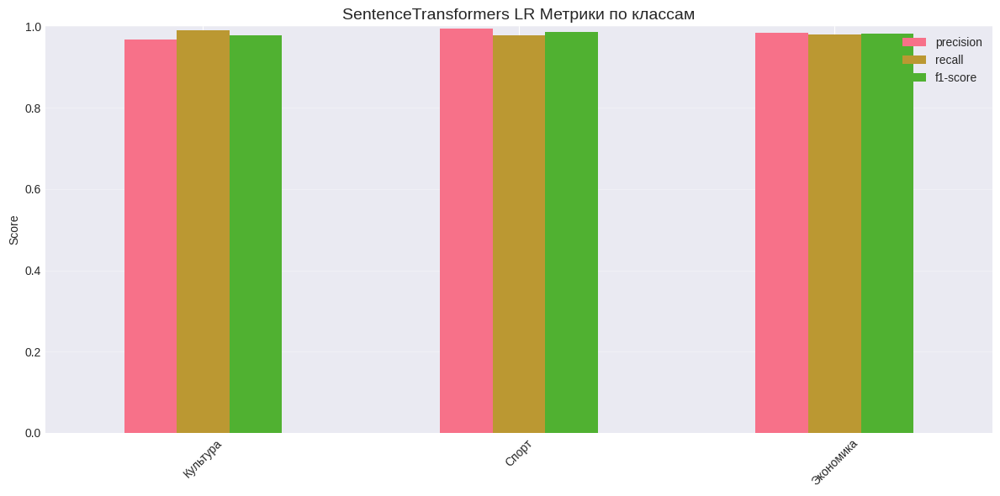

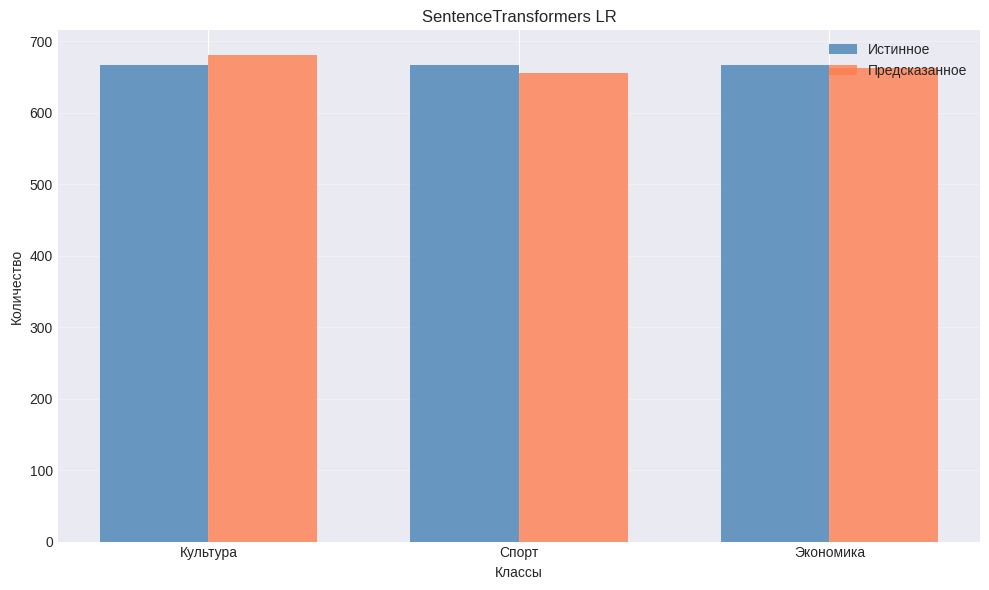

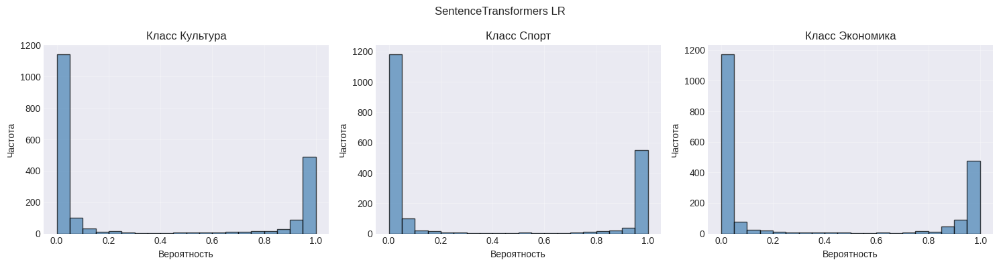


🔍 Важность признаков (коэффициенты линейной модели)...


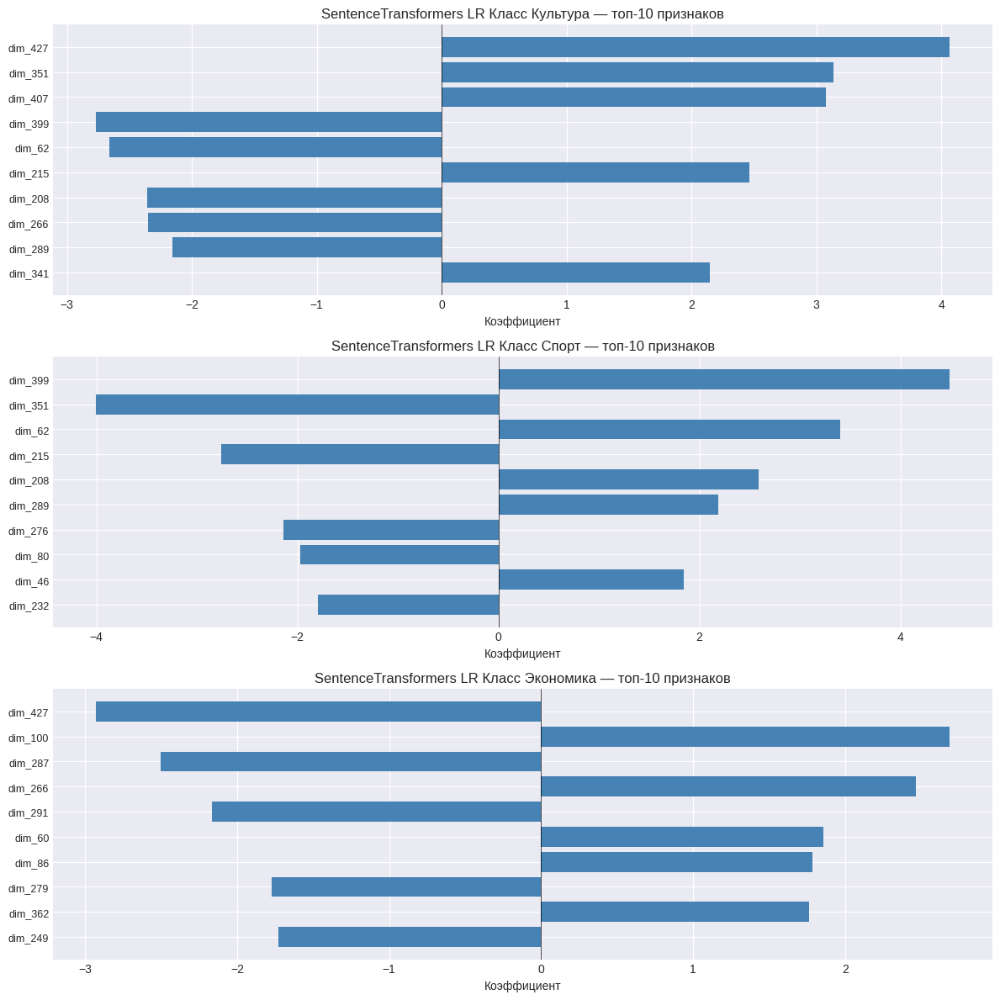


❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.998

2. Текст: эстрадный певец иосиф кобзон скончаться продолжительный болезнь оставить ребёнок внук наследство стоимость миллиард рубль сообщать артист частность принадлежать участок площадь два гектар подмосковный...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 0.988

3. Текст: бывший первый ракетка мир мария шарапов выступить качество исполнительный продюсер сериал канал главный героиня сериал звезда теннис биография перекликаться биография шарапов фильм посвятить жизнь тен...
   Истинный класс: Спорт, предсказанный: Культура
   Уверенность: 0.947

4. Текст: картина художник энди уорхол дэмиена хёрстый последний десять год раст

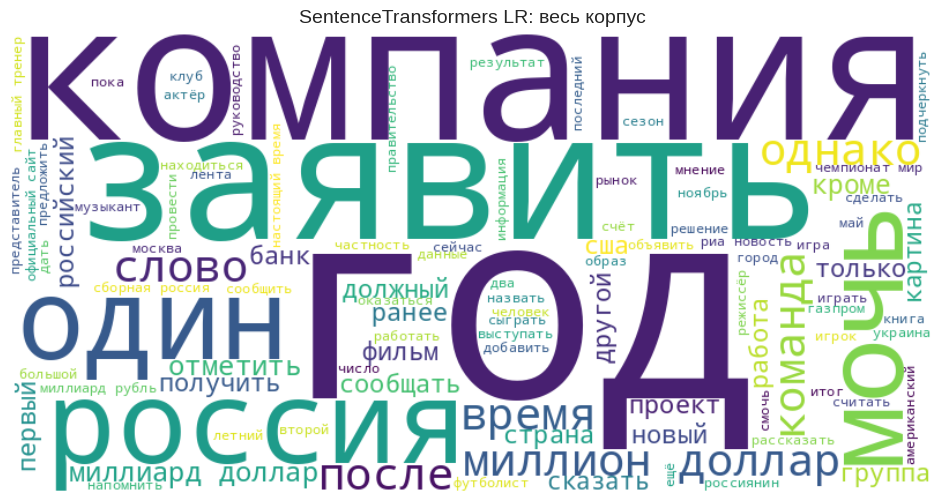


 Визуализация пространства эмбеддингов...


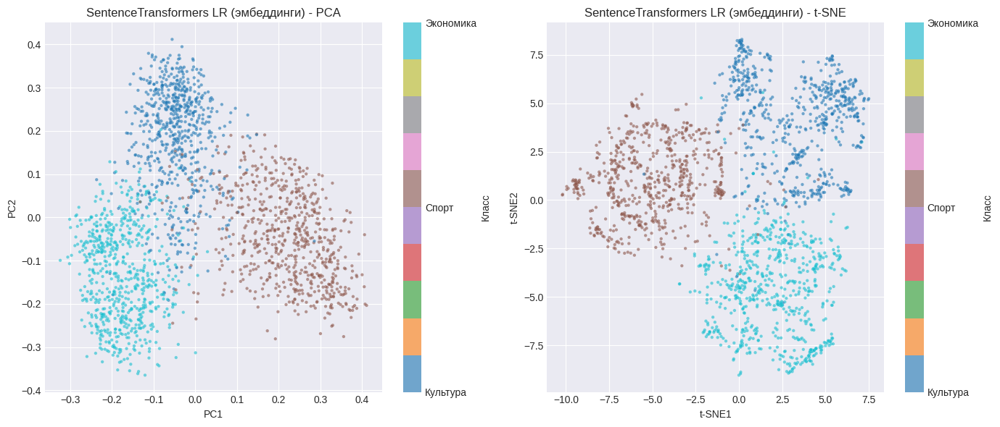


✅ Визуализация SentenceTransformers завершена.


In [ ]:
# ============================================================
# 15. ВИЗУАЛИЗАЦИЯ SentenceTransformers + LogisticRegression
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ SentenceTransformers + LR")
print("="*60)

# Извлекаем объекты из results_st
best_model = results_st['model']
y_pred = results_st['y_pred']
y_pred_proba = results_st['y_pred_proba']
classes = results_st['classes']
feature_names = results_st['feature_names']
X_train_emb = results_st['X_train_emb']
X_test_emb = results_st['X_test_emb']

# ------------------------------------------------------------
# 1. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

plot_confusion_matrices(y_test, y_pred, classes,
                        title='SentenceTransformers LR')
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='SentenceTransformers LR')
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='SentenceTransformers LR')

if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='SentenceTransformers LR')

# ------------------------------------------------------------
# 2. ГИСТОГРАММЫ ПРЕДСКАЗАННЫХ ВЕРОЯТНОСТЕЙ
# ------------------------------------------------------------
plot_prediction_probabilities(y_pred_proba, classes,
                              title='SentenceTransformers LR')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (коэффициенты модели на эмбеддингах)
# ------------------------------------------------------------
print("\n🔍 Важность признаков (коэффициенты линейной модели)...")
plot_feature_importance(best_model,
                        feature_names,
                        classes=classes,
                        top_n=10,
                        title='SentenceTransformers LR')

# ------------------------------------------------------------
# 4. КРИВАЯ ОБУЧЕНИЯ
# ------------------------------------------------------------
# Для LR на эмбеддингах кривая обучения не даст новой информации

# ------------------------------------------------------------
# 5. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")
plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 6. ОБЛАКА СЛОВ (общее облако для всего корпуса, опционально)
# ------------------------------------------------------------
print("\n☁️ Облако слов...")
plot_wordcloud_general(X_train, max_words=100,
                       title='SentenceTransformers LR: весь корпус')

# ------------------------------------------------------------
# 7. PCA / T-SNE визуализация эмбеддингов
# ------------------------------------------------------------
print("\n Визуализация пространства эмбеддингов...")
plot_pca_tsne(X_train_emb, y_train, sample_size=2000,
              title='SentenceTransformers LR (эмбеддинги)')

print("\n✅ Визуализация SentenceTransformers завершена.")
print("="*60)

2. ОБУЧЕНИЕ RUBERT (TF-IDF + ТРАНСФОРМЕР)

In [ ]:
# ============================================================
# 16. ОБУЧЕНИЕ RUBERT (Feature Extraction) — с прогресс-баром
# ============================================================

print("\n" + "="*60)
print("RUBERT (контекстуальные эмбеддинги + LogisticRegression)")
print("="*60)

# ------------------------------------------------------------
# 1. Конфигурация: выбираем модель
# ------------------------------------------------------------
MODEL_NAME = "cointegrated/rubert-tiny"  # для скорости
# MODEL_NAME = "DeepPavlov/rubert-base-cased"  # ~700 МБ, требует GPU

print(f"\n Загрузка токенизатора и модели: {MODEL_NAME}")

# ------------------------------------------------------------
# 2. Загрузка токенизатора и модели
# ------------------------------------------------------------
start_load = time.time()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Используется устройство: {device}")

tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME)
model = AutoModel.from_pretrained(MODEL_NAME).to(device)
model.eval()
print(f"✅ Модель загружена за {(time.time() - start_load)/60:.2f} мин")
print(f"   Параметры модели: {sum(p.numel() for p in model.parameters()):,}")
print(f"   Размерность эмбеддингов: {model.config.hidden_size}")

# ------------------------------------------------------------
# 3. Функция извлечения эмбеддингов (CLS-pooling) с tqdm
# ------------------------------------------------------------
@torch.no_grad()
def get_bert_embedding(texts, batch_size=32, desc="Извлечение эмбеддингов"):
    """Преобразует список текстов в матрицу эмбеддингов [CLS] токена с прогресс-баром."""
    embeddings = []
    total_batches = (len(texts) + batch_size - 1) // batch_size
    for i in tqdm(range(0, len(texts), batch_size), desc=desc, unit="batch"):
        batch_texts = texts[i:i+batch_size]
        inputs = tokenizer(
            batch_texts,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        ).to(device)

        outputs = model(**inputs)
        cls_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()
        embeddings.append(cls_embeddings)

    return np.vstack(embeddings)

# ------------------------------------------------------------
# 4. Преобразование текстов в эмбеддинги (с прогресс-баром)
# ------------------------------------------------------------
print("\n⏳ Извлечение эмбеддингов для обучающей выборки...")
start_emb = time.time()
X_train_bert = get_bert_embedding(
    X_train.tolist() if hasattr(X_train, 'tolist') else list(X_train),
    desc="Train"
)
print(f"✅ Обучающая выборка: {X_train_bert.shape} за {(time.time() - start_emb)/60:.2f} мин")

print("\n⏳ Извлечение эмбеддингов для тестовой выборки...")
start_emb_test = time.time()
X_test_bert = get_bert_embedding(
    X_test.tolist() if hasattr(X_test, 'tolist') else list(X_test),
    desc="Test"
)
print(f"✅ Тестовая выборка: {X_test_bert.shape} за {(time.time() - start_emb_test)/60:.2f} мин")

# ------------------------------------------------------------
# 5. Обучение классификатора на BERT-эмбеддингах
# ------------------------------------------------------------
print("\n⏳ Обучение LogisticRegression на BERT-эмбеддингах...")
start_clf = time.time()
bert_classifier = LogisticRegression(
    max_iter=1000,
    class_weight='balanced',
    n_jobs=-1,
    random_state=42,
    C=1.0
)
bert_classifier.fit(X_train_bert, y_train)
end_clf = time.time()
print(f"✅ Классификатор обучен за {(end_clf - start_clf)/60:.2f} мин")

# ------------------------------------------------------------
# 6. Предсказания и оценка
# ------------------------------------------------------------
y_pred_bert = bert_classifier.predict(X_test_bert)
y_pred_proba_bert = bert_classifier.predict_proba(X_test_bert)

test_accuracy = accuracy_score(y_test, y_pred_bert)
test_precision = precision_score(y_test, y_pred_bert, average='macro', zero_division=0)
test_recall = recall_score(y_test, y_pred_bert, average='macro', zero_division=0)
test_f1 = f1_score(y_test, y_pred_bert, average='macro', zero_division=0)

cv_f1 = cross_val_score(bert_classifier, X_train_bert, y_train,
                        cv=3, scoring='f1_macro', n_jobs=-1).mean()

print("\n" + "="*60)
print(f"РЕЗУЛЬТАТЫ {MODEL_NAME}")
print("="*60)
print(f"🏆 Модель:               {MODEL_NAME}")
print(f"📈 CV F1 (macro):        {cv_f1:.4f}")
print(f"🎯 Тестовый F1 (macro):  {test_f1:.4f}")
print(f"🎯 Тестовый Accuracy:    {test_accuracy:.4f}")
print(f"🎯 Precision (macro):    {test_precision:.4f}")
print(f"🎯 Recall (macro):       {test_recall:.4f}")
print(f"⏱️  Общее время:         {(time.time() - start_load)/60:.2f} мин")

# ------------------------------------------------------------
# 7. Сохраняем результаты (включая эмбеддинги для визуализации)
# ------------------------------------------------------------
results_bert = {
    'name': f'ruBERT-tiny + LR',
    'model': bert_classifier,
    'embedding_model': MODEL_NAME,
    'tokenizer': tokenizer,
    'bert_model': model,
    'y_pred': y_pred_bert,
    'y_pred_proba': y_pred_proba_bert,
    'feature_names': [f'bert_dim_{i}' for i in range(X_train_bert.shape[1])],
    'classes': bert_classifier.classes_,
    'test_accuracy': test_accuracy,
    'test_precision': test_precision,
    'test_recall': test_recall,
    'test_f1': test_f1,
    'cv_score': cv_f1,
    'best_params': {'model': MODEL_NAME, 'C': 1.0, 'max_length': 128},
    'training_time': time.time() - start_load,
    'X_train_emb': X_train_bert,   # <-- для визуализации
    'X_test_emb': X_test_bert      # <-- для визуализации
}

print("\n💾 Результаты сохранены в словарь 'results_bert'")
joblib.dump(bert_classifier, 'rubert_lr_model.pkl')
print("✅ Модель сохранена как 'rubert_lr_model.pkl'")
print("="*60)


RUBERT (контекстуальные эмбеддинги + LogisticRegression)

 Загрузка токенизатора и модели: cointegrated/rubert-tiny
Используется устройство: cpu


config.json:   0%|          | 0.00/632 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/47.7M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/55 [00:00<?, ?it/s]

BertModel LOAD REPORT from: cointegrated/rubert-tiny
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
bert.embeddings.position_ids               | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


✅ Модель загружена за 0.05 мин
   Параметры модели: 11,784,168
   Размерность эмбеддингов: 312

⏳ Извлечение эмбеддингов для обучающей выборки...


Train: 100%|██████████| 250/250 [02:03<00:00,  2.03batch/s]


✅ Обучающая выборка: (7999, 312) за 2.06 мин

⏳ Извлечение эмбеддингов для тестовой выборки...


Test: 100%|██████████| 63/63 [00:30<00:00,  2.07batch/s]


✅ Тестовая выборка: (2000, 312) за 0.51 мин

⏳ Обучение LogisticRegression на BERT-эмбеддингах...
✅ Классификатор обучен за 0.05 мин

РЕЗУЛЬТАТЫ cointegrated/rubert-tiny
🏆 Модель:               cointegrated/rubert-tiny
📈 CV F1 (macro):        0.9606
🎯 Тестовый F1 (macro):  0.9595
🎯 Тестовый Accuracy:    0.9595
🎯 Precision (macro):    0.9597
🎯 Recall (macro):       0.9595
⏱️  Общее время:         2.72 мин

💾 Результаты сохранены в словарь 'results_bert'
✅ Модель сохранена как 'rubert_lr_model.pkl'


ВИЗУАЛИЗАЦИЯ RUBERT


ВИЗУАЛИЗАЦИЯ ruBERT + LR

📈 Оценка на тестовой выборке...


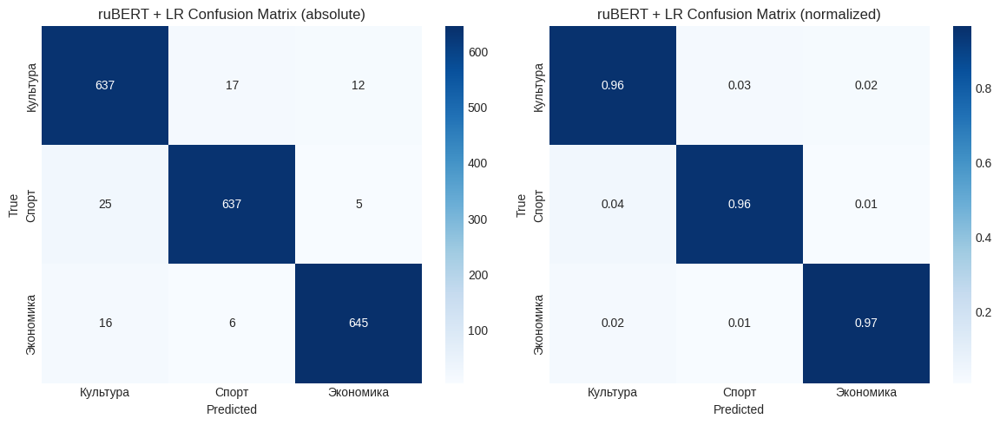

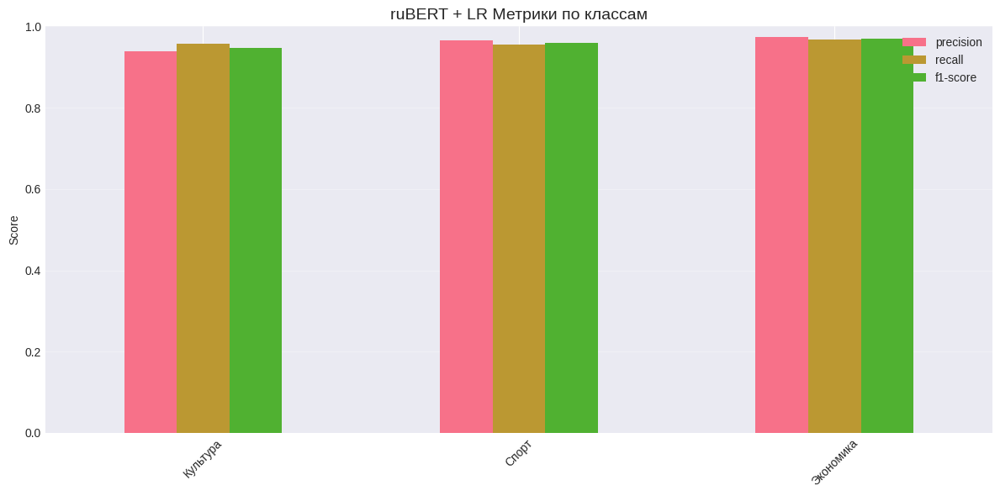

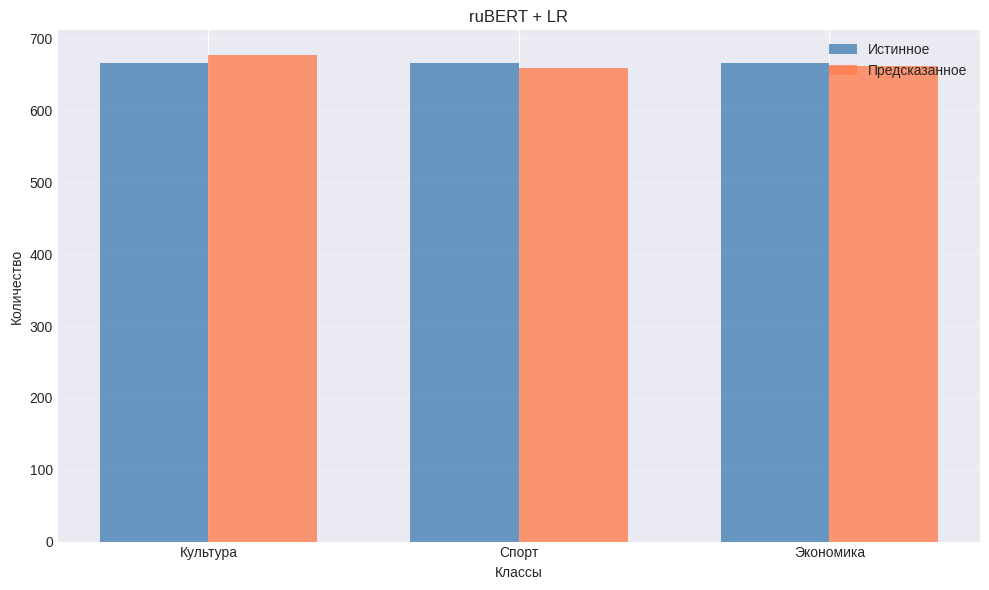

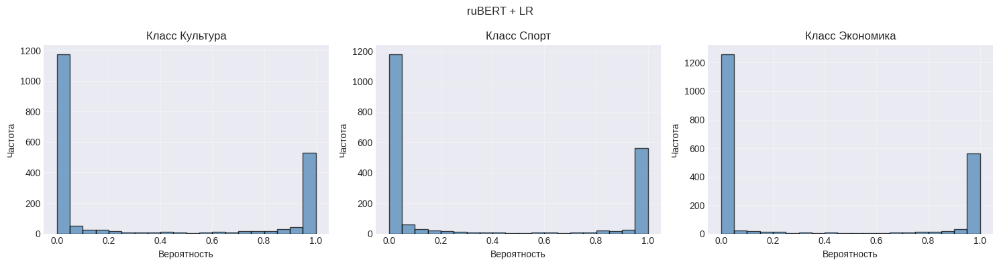


🔍 Важность признаков (коэффициенты линейной модели)...


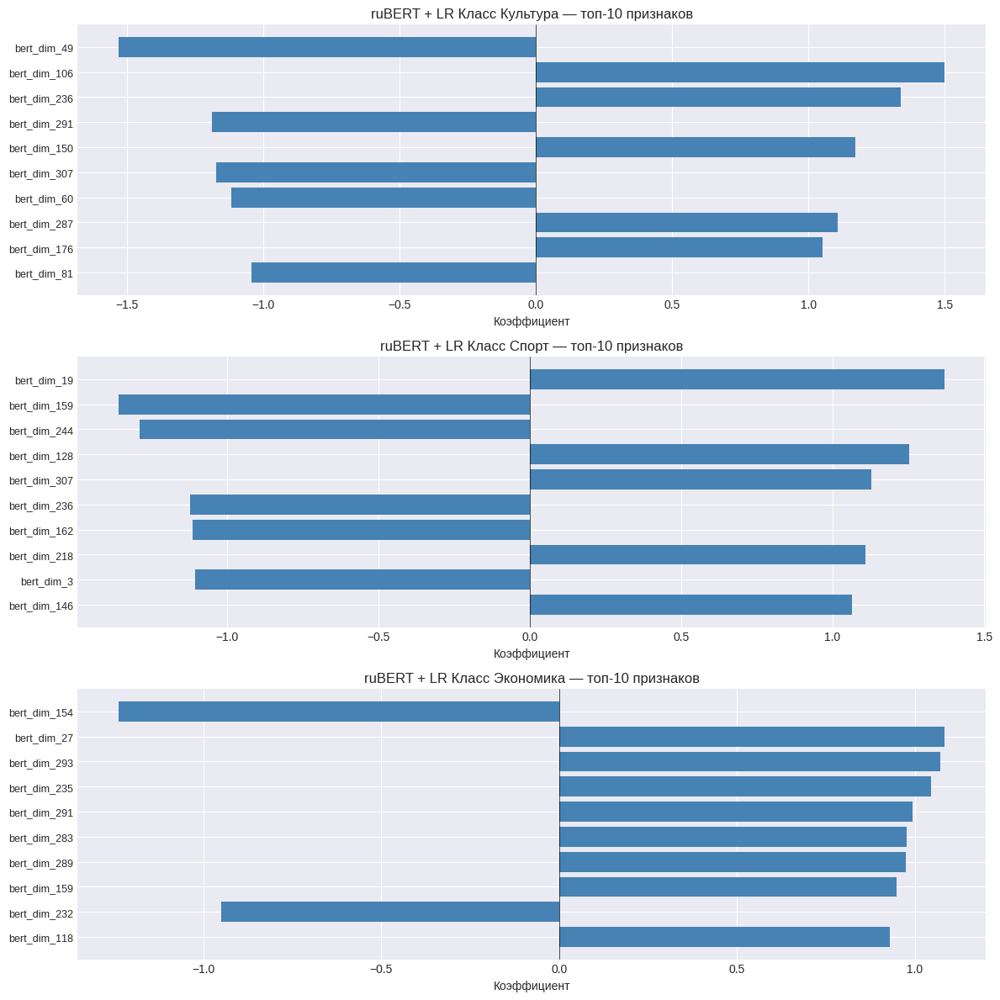


❌ Анализ ошибок...

ТОП-5 САМЫХ УВЕРЕННЫХ ОШИБОК

1. Текст: скульптура рабочий колхозница построить театр киноцентр заявить префект северо восточный административный округ москва ирина рабер сообщать интерфакс постамент скульптура планироваться разместить теат...
   Истинный класс: Экономика, предсказанный: Культура
   Уверенность: 1.000

2. Текст: два российский компания рвс бфг медиа продакшн собираться финансировать остановить стадия производство отечественный кино телепроект сведение коммерсант принадлежащий афк система компания рвс выделить...
   Истинный класс: Культура, предсказанный: Экономика
   Уверенность: 0.998

3. Текст: буддист раскритиковать форвард мадридский реал криштиану роналда фотография скульптура будда выложить португалец страница фото изобразить роналда поставить нога статуя подпись фотография гласить добры...
   Истинный класс: Спорт, предсказанный: Культура
   Уверенность: 0.996

4. Текст: бывший первый ракетка мир мария шарапов выступить качество исполнитель

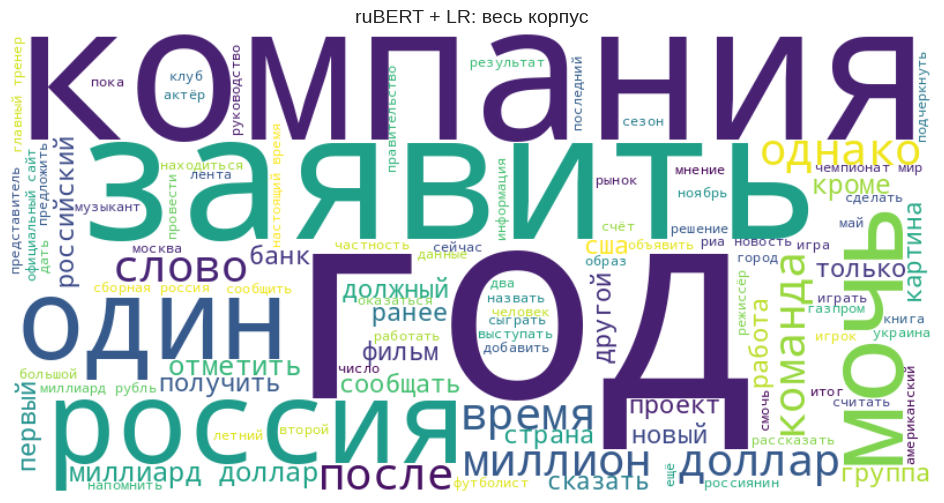


 Визуализация пространства эмбеддингов...


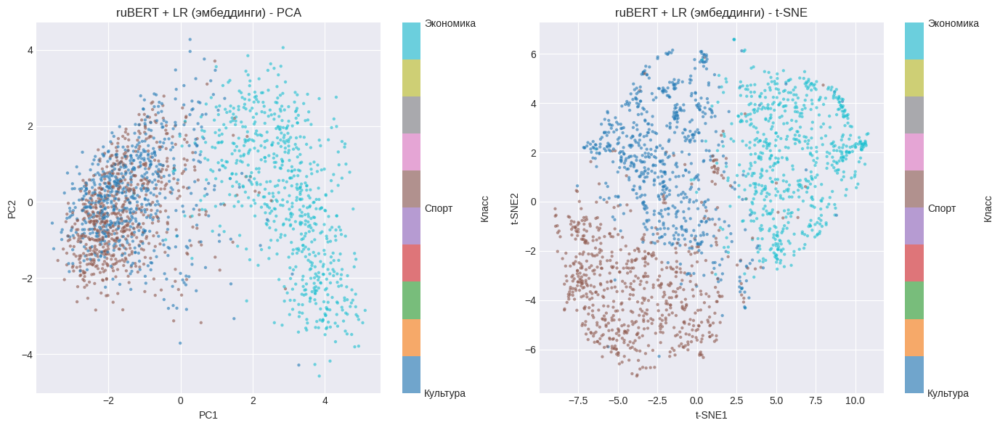


✅ Визуализация ruBERT завершена.


In [ ]:
# ============================================================
# 17. ВИЗУАЛИЗАЦИЯ ruBERT + LogisticRegression
# ============================================================

print("\n" + "="*60)
print("ВИЗУАЛИЗАЦИЯ ruBERT + LR")
print("="*60)

# Извлекаем объекты из results_bert
best_model = results_bert['model']
y_pred = results_bert['y_pred']
y_pred_proba = results_bert['y_pred_proba']
classes = results_bert['classes']
feature_names = results_bert['feature_names']
X_train_emb = results_bert['X_train_emb']
X_test_emb = results_bert['X_test_emb']

# ------------------------------------------------------------
# 1. ОЦЕНКА НА ТЕСТОВОЙ ВЫБОРКЕ
# ------------------------------------------------------------
print("\n📈 Оценка на тестовой выборке...")

plot_confusion_matrices(y_test, y_pred, classes,
                        title='ruBERT + LR')
plot_classification_metrics_report(y_test, y_pred, classes,
                                   title='ruBERT + LR')
plot_true_vs_pred_distribution(y_test, y_pred,
                               title='ruBERT + LR')

if len(classes) == 2:
    plot_roc_curve_multiclass(y_test, y_pred_proba, classes,
                              title='ruBERT + LR')

# ------------------------------------------------------------
# 2. ГИСТОГРАММЫ ПРЕДСКАЗАННЫХ ВЕРОЯТНОСТЕЙ
# ------------------------------------------------------------
plot_prediction_probabilities(y_pred_proba, classes,
                              title='ruBERT + LR')

# ------------------------------------------------------------
# 3. ВАЖНОСТЬ ПРИЗНАКОВ (коэффициенты линейной модели на эмбеддингах)
# ------------------------------------------------------------
print("\n🔍 Важность признаков (коэффициенты линейной модели)...")
plot_feature_importance(best_model,
                        feature_names,
                        classes=classes,
                        top_n=10,
                        title='ruBERT + LR')

# ------------------------------------------------------------
# 4. АНАЛИЗ ОШИБОК
# ------------------------------------------------------------
print("\n❌ Анализ ошибок...")
plot_error_analysis(y_test, y_pred, y_pred_proba, X_test,
                    classes=classes, top_n=5)

# ------------------------------------------------------------
# 5. ОБЛАКА СЛОВ (общее облако для всего корпуса)
# ------------------------------------------------------------
print("\n☁️ Облако слов...")
plot_wordcloud_general(X_train, max_words=100,
                       title='ruBERT + LR: весь корпус')

# ------------------------------------------------------------
# 6. PCA / T-SNE визуализация эмбеддингов
# ------------------------------------------------------------
print("\n Визуализация пространства эмбеддингов...")
plot_pca_tsne(X_train_emb, y_train, sample_size=2000,
              title='ruBERT + LR (эмбеддинги)')

print("\n✅ Визуализация ruBERT завершена.")
print("="*60)

ОБНОВЛЁННОЕ ФИНАЛЬНОЕ СРАВНЕНИЕ (ВСЕ 7 МОДЕЛЕЙ)


📊 ФИНАЛЬНОЕ СРАВНЕНИЕ: ВСЕ МОДЕЛИ
✅ Добавлена модель: LogisticRegression + TF-IDF (optimized)
✅ Добавлена модель: SVM + TF-IDF (lightning)
✅ Добавлена модель: RandomForest + TF-IDF
✅ Добавлена модель: MultinomialNB + TF-IDF
✅ Добавлена модель: KNN + TF-IDF (optimized)
ℹ️ results_ft не найдена – пропускаем
✅ Добавлена модель: ruBERT-tiny + LR
✅ Добавлена модель: SentenceTransformers + LR (distiluse-base-multilingual-cased)

 Всего моделей для сравнения: 7

 СВОДНАЯ ТАБЛИЦА МЕТРИК
----------------------------------------------------------------------------------------------------
                                                       Модель Test F1 (macro) Test Precision (macro) Test Recall (macro) Test Accuracy CV F1 (macro) Train-Val Разрыв Время обучения (мин)
                      LogisticRegression + TF-IDF (optimized)          0.9875                 0.9875              0.9875        0.9875        0.9862           0.0136                 0.77
                                     SVM

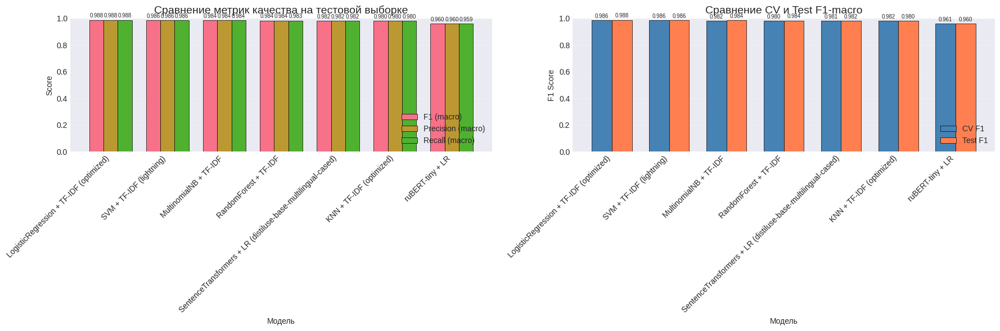

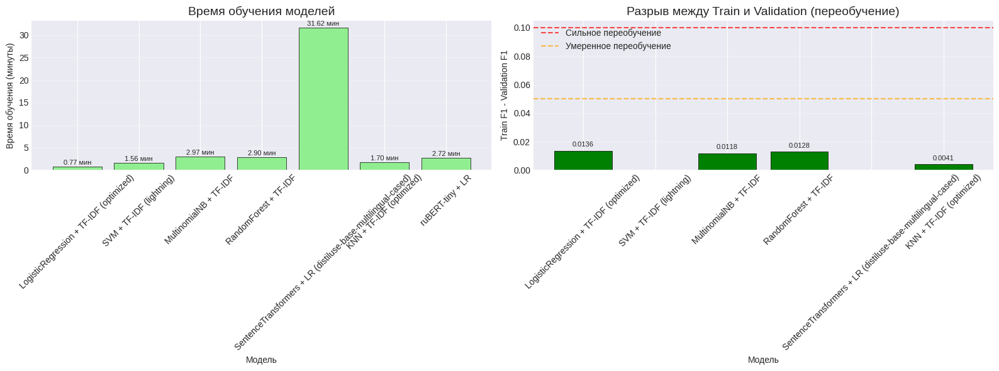

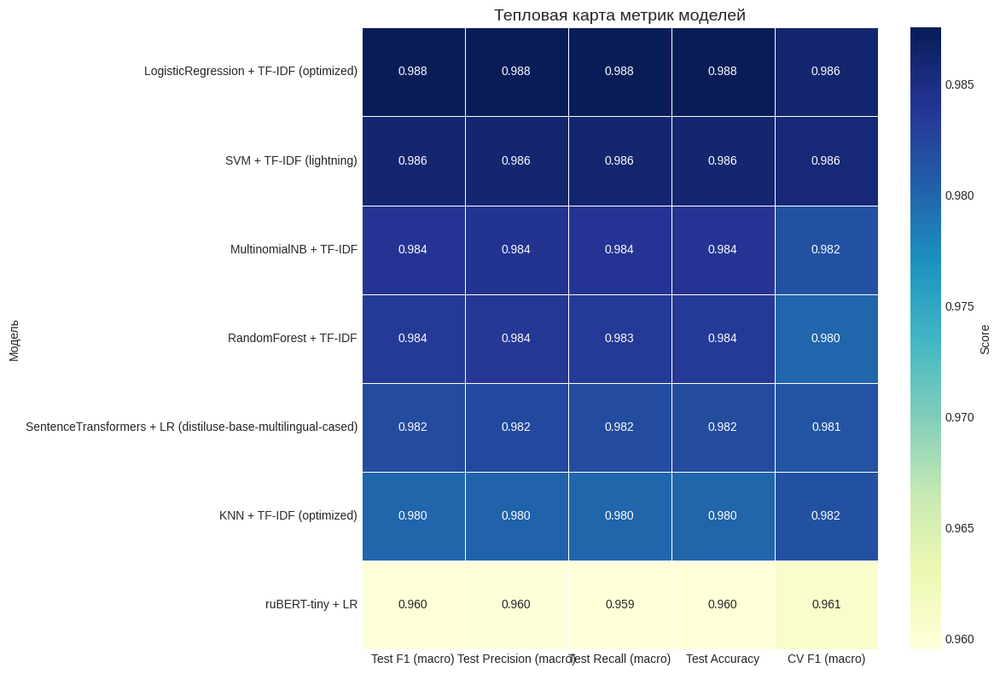


🏆 ЛУЧШАЯ МОДЕЛЬ ПО ИТОГАМ ЭКСПЕРИМЕНТА
   Модель: LogisticRegression + TF-IDF (optimized)
   Test F1-macro: 0.9875
   Test Accuracy: 0.9875
   Время обучения: 0.77 мин

 Сводная таблица сохранена как 'models_comparison.csv'
✅ Финальное сравнение завершено!


In [ ]:
# ============================================================
# 18. ФИНАЛЬНОЕ СРАВНЕНИЕ ВСЕХ МОДЕЛЕЙ (КЛАССИКА + DL)
# ============================================================

print("\n" + "="*60)
print("📊 ФИНАЛЬНОЕ СРАВНЕНИЕ: ВСЕ МОДЕЛИ")
print("="*60)

# ------------------------------------------------------------
# 1. Собираем все результаты, которые есть в памяти
# ------------------------------------------------------------
all_results = []

# Список имён словарей, которые должны быть определены
model_dicts = [
    ('results_lr', 'LogisticRegression + TF-IDF'),
    ('results_svm', 'SVM + TF-IDF'),
    ('results_rf', 'RandomForest + TF-IDF'),
    ('results_nb', 'MultinomialNB + TF-IDF'),
    ('results_knn', 'KNN + TF-IDF'),
    ('results_ft', 'FastEmbed (FastText+LR)'),
    ('results_bert', 'ruBERT-tiny + LR'),
    ('results_st', 'SentenceTransformers + LR')
]

for var_name, display_name in model_dicts:
    if var_name in globals():
        res = globals()[var_name]
        # Убедимся, что это словарь с нужными ключами
        if isinstance(res, dict) and 'test_f1' in res:
            all_results.append(res)
            print(f"✅ Добавлена модель: {res.get('name', display_name)}")
        else:
            print(f"⚠️ {var_name} существует, но не содержит нужных ключей")
    else:
        print(f"ℹ️ {var_name} не найдена – пропускаем")

print(f"\n Всего моделей для сравнения: {len(all_results)}")

# ------------------------------------------------------------
# 2. Создаём сводный DataFrame
# ------------------------------------------------------------
comparison_data = []
for res in all_results:
    # Безопасно извлекаем разницу train/validation, если доступно
    overfit_gap = np.nan
    if 'gs' in res and res['gs'] is not None and hasattr(res['gs'], 'cv_results_'):
        if 'mean_train_score' in res['gs'].cv_results_ and 'mean_test_score' in res['gs'].cv_results_:
            best_idx = res['gs'].best_index_
            train_score = res['gs'].cv_results_['mean_train_score'][best_idx]
            val_score = res['gs'].cv_results_['mean_test_score'][best_idx]
            overfit_gap = train_score - val_score

    comparison_data.append({
        'Модель': res['name'],
        'Test F1 (macro)': res['test_f1'],
        'Test Precision (macro)': res['test_precision'],
        'Test Recall (macro)': res['test_recall'],
        'Test Accuracy': res['test_accuracy'],
        'CV F1 (macro)': res['cv_score'],
        'Train-Val Разрыв': overfit_gap,
        'Время обучения (мин)': res['training_time'] / 60
    })

df_comparison = pd.DataFrame(comparison_data)
df_comparison = df_comparison.sort_values('Test F1 (macro)', ascending=False).reset_index(drop=True)

# ------------------------------------------------------------
# 3. Выводим таблицу с форматированием
# ------------------------------------------------------------
print("\n СВОДНАЯ ТАБЛИЦА МЕТРИК")
print("-" * 100)

display_cols = ['Модель', 'Test F1 (macro)', 'Test Precision (macro)',
                'Test Recall (macro)', 'Test Accuracy', 'CV F1 (macro)',
                'Train-Val Разрыв', 'Время обучения (мин)']

df_display = df_comparison[display_cols].copy()
for col in df_display.columns[1:]:
    if col == 'Время обучения (мин)':
        df_display[col] = df_display[col].apply(lambda x: f'{x:.2f}')
    else:
        df_display[col] = df_display[col].apply(lambda x: f'{x:.4f}')

print(df_display.to_string(index=False))
print("-" * 100)

# ------------------------------------------------------------
# 4. Визуализация 1: Сравнение F1, Precision, Recall
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# График 1: F1, Precision, Recall
metrics = ['Test F1 (macro)', 'Test Precision (macro)', 'Test Recall (macro)']
x = np.arange(len(df_comparison))
width = 0.25

for i, metric in enumerate(metrics):
    values = df_comparison[metric].values
    axes[0].bar(x + (i - 1) * width, values, width, label=metric.replace('Test ', ''),
                edgecolor='black', linewidth=0.5)

axes[0].set_xlabel('Модель')
axes[0].set_ylabel('Score')
axes[0].set_title('Сравнение метрик качества на тестовой выборке', fontsize=14)
axes[0].set_xticks(x)
axes[0].set_xticklabels(df_comparison['Модель'], rotation=45, ha='right')
axes[0].legend(loc='lower right')
axes[0].set_ylim(0, 1)
axes[0].grid(axis='y', alpha=0.3)

# Добавляем значения
for i, metric in enumerate(metrics):
    for j, v in enumerate(df_comparison[metric].values):
        axes[0].text(j + (i - 1) * width, v + 0.01, f'{v:.3f}',
                     ha='center', va='bottom', fontsize=7)

# График 2: CV F1 vs Test F1
ax2 = axes[1]
x2 = np.arange(len(df_comparison))
width2 = 0.35

ax2.bar(x2 - width2/2, df_comparison['CV F1 (macro)'].values, width2,
        label='CV F1', color='steelblue', edgecolor='black', linewidth=0.5)
ax2.bar(x2 + width2/2, df_comparison['Test F1 (macro)'].values, width2,
        label='Test F1', color='coral', edgecolor='black', linewidth=0.5)

ax2.set_xlabel('Модель')
ax2.set_ylabel('F1 Score')
ax2.set_title('Сравнение CV и Test F1-macro', fontsize=14)
ax2.set_xticks(x2)
ax2.set_xticklabels(df_comparison['Модель'], rotation=45, ha='right')
ax2.legend(loc='lower right')
ax2.set_ylim(0, 1)
ax2.grid(axis='y', alpha=0.3)

# Добавляем значения
for i, v in enumerate(df_comparison['CV F1 (macro)'].values):
    ax2.text(i - width2/2, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=7)
for i, v in enumerate(df_comparison['Test F1 (macro)'].values):
    ax2.text(i + width2/2, v + 0.01, f'{v:.3f}', ha='center', va='bottom', fontsize=7)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. Визуализация 2: Время обучения и разрыв train-val
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# График 3: Время обучения
ax3 = axes[0]
times = df_comparison['Время обучения (мин)'].values
bars3 = ax3.bar(df_comparison['Модель'], times, color='lightgreen',
                edgecolor='black', linewidth=0.5)
ax3.set_xlabel('Модель')
ax3.set_ylabel('Время обучения (минуты)')
ax3.set_title('Время обучения моделей', fontsize=14)
ax3.tick_params(axis='x', rotation=45)
ax3.grid(axis='y', alpha=0.3)

for bar, v in zip(bars3, times):
    ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
             f'{v:.2f} мин', ha='center', va='bottom', fontsize=8)

# График 4: Разрыв между Train и Validation
ax4 = axes[1]
gaps = df_comparison['Train-Val Разрыв'].values
colors = ['red' if g > 0.1 else 'orange' if g > 0.05 else 'green' for g in gaps]
bars4 = ax4.bar(df_comparison['Модель'], gaps, color=colors, edgecolor='black', linewidth=0.5)
ax4.set_xlabel('Модель')
ax4.set_ylabel('Train F1 - Validation F1')
ax4.set_title('Разрыв между Train и Validation (переобучение)', fontsize=14)
ax4.tick_params(axis='x', rotation=45)
ax4.axhline(y=0.1, color='red', linestyle='--', alpha=0.7, label='Сильное переобучение')
ax4.axhline(y=0.05, color='orange', linestyle='--', alpha=0.7, label='Умеренное переобучение')
ax4.legend(loc='upper left')
ax4.grid(axis='y', alpha=0.3)

for bar, v in zip(bars4, gaps):
    if not np.isnan(v):
        ax4.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.002,
                 f'{v:.4f}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Тепловая карта метрик
# ------------------------------------------------------------
plt.figure(figsize=(12, 8))
metric_cols = ['Test F1 (macro)', 'Test Precision (macro)',
               'Test Recall (macro)', 'Test Accuracy', 'CV F1 (macro)']
heatmap_data = df_comparison.set_index('Модель')[metric_cols].astype(float)

sns.heatmap(heatmap_data, annot=True, fmt='.3f', cmap='YlGnBu',
            cbar_kws={'label': 'Score'}, linewidths=0.5, linecolor='white')
plt.title('Тепловая карта метрик моделей', fontsize=14)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Вывод лучшей модели
# ------------------------------------------------------------
best_row = df_comparison.loc[df_comparison['Test F1 (macro)'].idxmax()]
best_model_name = best_row['Модель']
best_f1 = best_row['Test F1 (macro)']

print("\n" + "="*60)
print("🏆 ЛУЧШАЯ МОДЕЛЬ ПО ИТОГАМ ЭКСПЕРИМЕНТА")
print("="*60)
print(f"   Модель: {best_model_name}")
print(f"   Test F1-macro: {best_f1:.4f}")
print(f"   Test Accuracy: {best_row['Test Accuracy']:.4f}")
print(f"   Время обучения: {best_row['Время обучения (мин)']:.2f} мин")
print("="*60)

# ------------------------------------------------------------
# 8. Сохраняем сводную таблицу в CSV
# ------------------------------------------------------------
df_comparison.to_csv('models_comparison.csv', index=False, encoding='utf-8-sig')
print("\n Сводная таблица сохранена как 'models_comparison.csv'")
print("✅ Финальное сравнение завершено!")
print("="*60)